In [1]:
import os
import gc
import cv2
import math
import copy
import time
import csv
import random
import shutil, sys
from PIL import Image
import glob
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.metrics import f1_score, roc_auc_score
import timm
from timm.models.efficientnet import *
import joblib
from tqdm import tqdm
from collections import defaultdict
import warnings

warnings.filterwarnings("ignore")
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
from scipy import ndimage

/home/joe1007/miniconda3/envs/e2d/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


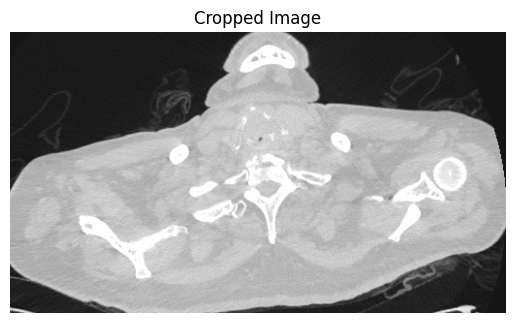

In [2]:
def autocropmin(image, threshold=100, kernsel_size=10):
    img = image.copy()
    area = img.shape[0] * img.shape[1]
    SIZE = img.shape[0]
    imgfilt = ndimage.minimum_filter(img, size=kernsel_size)
    img_b = np.where(imgfilt < threshold, 0, 255)
    a = img_b[:, :, 0].sum(axis=1)
    a = np.concatenate(([0], a, [0]))

    a_ = np.where(a == 0)[0]
    mina = a_[np.argmax(a_[1:] - a_[:-1])]
    maxa = a_[np.argmax(a_[1:] - a_[:-1]) + 1] - 1

    b = img_b[:, :, 0].sum(axis=0)
    b = np.concatenate(([0], b, [0]))

    b_ = np.where(b == 0)[0]
    minb = b_[np.argmax(b_[1:] - b_[:-1])]
    maxb = b_[np.argmax(b_[1:] - b_[:-1]) + 1] - 1

    if mina != maxa and minb != maxb:
        imageout = img[mina:maxa, minb:maxb, :]
    else:
        imageout = img

    area2 = imageout.shape[0] * imageout.shape[1]
    save = (area - area2) / area
    return imageout, img.shape, imageout.shape, area, area2, save

str1 = "/ssd7/ICCV2025_COVID19/track1_fixed/train/non-covid/ct_scan_1/0.jpg"
img = cv2.imread(str1)

# 只取第一個返回值（裁剪後的圖片）
cropped_image = autocropmin(img)[0]

# print(cropped_image.shape)
# cropped_image = np.where(cropped_image > 0, 1, 0)

# Convert BGR image to RGB
# img_rgb = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)

# Display the cropped image
plt.imshow(cropped_image, cmap="gray")  # Specify colormap as 'gray' for grayscale
plt.title("Cropped Image")
plt.axis("off")
plt.show()

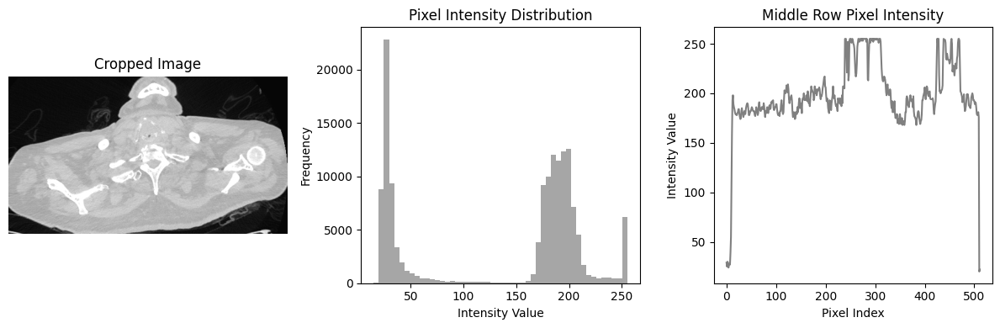

In [4]:
# 取得裁剪後的圖片
cropped_image = autocropmin(img)[0]

# 轉為灰階（如果需要）
if len(cropped_image.shape) == 3:
    gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)
else:
    gray_image = cropped_image

# 簡單的直方圖
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Cropped Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.hist(gray_image.flatten(), bins=50, color="gray", alpha=0.7)
plt.title("Pixel Intensity Distribution")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")

plt.subplot(1, 3, 3)
# 取中間一行的像素值變化
middle_row = gray_image[gray_image.shape[0]//2, :]
plt.plot(middle_row, color="gray")
plt.title("Middle Row Pixel Intensity")
plt.xlabel("Pixel Index")
plt.ylabel("Intensity Value")

plt.tight_layout()
plt.show()

In [4]:
train_df_list_ = pd.read_csv(
    "/ssd7/ICCV2025_COVID19/processing_by_hospital_0/chih_4_fold_covid_train_df.csv"
)  # 使用已經切割好fold index的影像資訊彙整檔案
valid_df_list_ = pd.read_csv(
    "/ssd7/ICCV2025_COVID19/processing_by_hospital_0/chih_4_fold_covid_valid_df.csv"
)  # 使用已經切割好fold index的影像資訊彙整檔案

all_train_list = [
    list(
        glob.glob(os.path.join("/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid", "*"))),
    list(
        glob.glob(os.path.join("/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid", "*"))),
    list(
        glob.glob(os.path.join("/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid", "*"))),
    list(
        glob.glob(os.path.join("/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid", "*"))),
]


In [5]:

# 初始化一个列表来收集数据
data_to_save = []

# 紀錄用autocropmin分析後的資訊
for train_list in all_train_list:
    diff_shape_ct_list = []

    for i in tqdm(range(len(train_list))):
        tmp_list = list(glob.glob(os.path.join(train_list[i], "*")))
        tmp_shape_set = set()
        for j in range(len(tmp_list)):
            str1 = tmp_list[j]
            img = cv2.imread(str1)

            try:
                tmp_shape_set.add(img.shape)
            except:
                print(str1)
                print("bug file")
                continue

            img, img1, imgout2, area, area2, save = autocropmin(img)
            data_to_save.append([str1, img1, imgout2, area, area2, save])  # 收集数据
            print([str1, img1, imgout2, area, area2, save])

            str1 = str1.replace("/val/", "/valid_pure_crop_challenge/")
            str1 = str1.replace("/train/", "/train_pure_crop_challenge/")

            folder_path = "/".join(str1.split("/")[:-1])

            if len(tmp_shape_set) != 1:
                shutil.rmtree(folder_path)
                diff_shape_ct_list.append(folder_path)

                break

            if not os.path.exists(folder_path):
                os.makedirs(folder_path)
            cv2.imwrite(str1, img)
"""
    # 將裁切後大小不同的影像額外儲存，並且只挑最後一個當作可使用的檔案(有執行的話，此迴圈要註解掉)
    for ct_path in diff_shape_ct_list:
        
        str2=ct_path   
        str1=str2.replace("/valid_pure_crop_challenge/","/valid/")
        str1=str1.replace("/train_pure_crop_challenge/","/train/")

        tmp_list=list(glob.glob(os.path.join(str1, "*")))
        last_file=str(len(tmp_list)-1)+".jpg"
        str1=str1+"/"+last_file
        str2=str2+"/"+last_file
        img=cv2.imread(str1)
        img,img1,imgout2,area,area2,save=autocropmin(img)
        data_to_save.append([str1, img1, imgout2, area, area2, save])  # 收集数据
        print([str1, img1, imgout2, area, area2, save])
        folder_path="/".join(str2.split("/")[:-1])

        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
        cv2.imwrite(str2,img)
"""
# 将数据写入 CSV 文件

import csv
csv_file_path = "/ssd7/ICCV2025_COVID19/Analysis_hospital_0/train_val_output.csv"
with open(csv_file_path, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Image Path', 'Img1', 'Imgout2', 'Area', 'Area2', 'Save'])  # 写入标题
    for row in data_to_save:
        writer.writerow(row)  # 写入数据行


  0%|          | 0/175 [00:00<?, ?it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/6.jpg', (512, 512, 3), (233, 512, 3), 262144, 119296, 0.544921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/7.jpg', (512, 512, 3), (236, 501, 3), 262144, 118236, 0.5489654541015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/43.jpg', (512, 512, 3), (322, 446, 3), 262144, 143612, 0.4521636962890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/24.jpg', (512, 512, 3), (296, 487, 3), 262144, 144152, 0.450103759765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/50.jpg', (512, 512, 3), (326, 433, 3), 262144, 141158, 0.46152496337890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/23.jpg', (512, 512, 3), (292, 489, 3), 262144, 142788, 0.4553070068359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/42.jpg', (512

  1%|          | 1/175 [00:01<04:32,  1.56s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/0.jpg', (512, 512, 3), (230, 512, 3), 262144, 117760, 0.55078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/3.jpg', (512, 512, 3), (220, 512, 3), 262144, 112640, 0.5703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/47.jpg', (512, 512, 3), (327, 437, 3), 262144, 142899, 0.4548835754394531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/9.jpg', (512, 512, 3), (245, 496, 3), 262144, 121520, 0.53643798828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/34.jpg', (512, 512, 3), (314, 465, 3), 262144, 146010, 0.44301605224609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/36.jpg', (512, 512, 3), (314, 462, 3), 262144, 145068, 0.4466094970703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_76/15.jpg', (512, 512, 3), (

  1%|          | 2/175 [00:07<12:28,  4.33s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_167/36.jpg', (512, 512, 3), (284, 512, 3), 262144, 145408, 0.4453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_167/120.jpg', (512, 512, 3), (356, 512, 3), 262144, 182272, 0.3046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_167/226.jpg', (512, 512, 3), (408, 489, 3), 262144, 199512, 0.238922119140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_167/147.jpg', (512, 512, 3), (373, 512, 3), 262144, 190976, 0.271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_167/106.jpg', (512, 512, 3), (345, 512, 3), 262144, 176640, 0.326171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_167/15.jpg', (512, 512, 3), (267, 512, 3), 262144, 136704, 0.478515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_167/142.jpg', (512, 512, 3), (368, 51

  2%|▏         | 3/175 [00:16<18:30,  6.46s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_51/15.jpg', (512, 512, 3), (238, 512, 3), 262144, 121856, 0.53515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_51/142.jpg', (512, 512, 3), (295, 512, 3), 262144, 151040, 0.423828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/155.jpg', (512, 512, 3), (352, 512, 3), 262144, 180224, 0.3125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/6.jpg', (512, 512, 3), (260, 512, 3), 262144, 133120, 0.4921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/180.jpg', (512, 512, 3), (364, 512, 3), 262144, 186368, 0.2890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/69.jpg', (512, 512, 3), (313, 512, 3), 262144, 160256, 0.388671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/223.jpg', (512, 512, 3), (368, 499, 3), 262144, 183632

  2%|▏         | 4/175 [00:26<22:34,  7.92s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/226.jpg', (512, 512, 3), (368, 499, 3), 262144, 183632, 0.29949951171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/147.jpg', (512, 512, 3), (347, 512, 3), 262144, 177664, 0.322265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/306.jpg', (512, 512, 3), (365, 460, 3), 262144, 167900, 0.3595123291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/106.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/15.jpg', (512, 512, 3), (272, 512, 3), 262144, 139264, 0.46875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_44/142.jpg', (512, 512, 3), (344, 512, 3), 262144, 176128, 0.328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_10/155.jpg', (512, 512, 3), (279, 491, 3)

  3%|▎         | 5/175 [00:37<25:22,  8.95s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_10/15.jpg', (512, 512, 3), (222, 512, 3), 262144, 113664, 0.56640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_10/142.jpg', (512, 512, 3), (275, 498, 3), 262144, 136950, 0.47757720947265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_26/155.jpg', (512, 512, 3), (331, 470, 3), 262144, 155570, 0.40654754638671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_26/6.jpg', (512, 512, 3), (278, 512, 3), 262144, 142336, 0.45703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_26/180.jpg', (512, 512, 3), (335, 512, 3), 262144, 171520, 0.345703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_26/358.jpg', (512, 512, 3), (360, 430, 3), 262144, 154800, 0.40948486328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_26/69.jpg', (512, 512, 3), 

  3%|▎         | 6/175 [00:48<26:57,  9.57s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_26/306.jpg', (512, 512, 3), (355, 433, 3), 262144, 153715, 0.4136238098144531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_26/106.jpg', (512, 512, 3), (335, 512, 3), 262144, 171520, 0.345703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_26/15.jpg', (512, 512, 3), (282, 512, 3), 262144, 144384, 0.44921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_26/142.jpg', (512, 512, 3), (334, 512, 3), 262144, 171008, 0.34765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_59/155.jpg', (512, 512, 3), (328, 512, 3), 262144, 167936, 0.359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_59/6.jpg', (512, 512, 3), (234, 512, 3), 262144, 119808, 0.54296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_59/180.jpg', (512, 512, 3), (336, 512, 3), 26

  4%|▍         | 7/175 [00:58<27:13,  9.72s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_59/226.jpg', (512, 512, 3), (344, 512, 3), 262144, 176128, 0.328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_59/147.jpg', (512, 512, 3), (324, 512, 3), 262144, 165888, 0.3671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_59/306.jpg', (512, 512, 3), (360, 497, 3), 262144, 178920, 0.317474365234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_59/106.jpg', (512, 512, 3), (304, 512, 3), 262144, 155648, 0.40625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_59/15.jpg', (512, 512, 3), (243, 512, 3), 262144, 124416, 0.525390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_59/142.jpg', (512, 512, 3), (322, 512, 3), 262144, 164864, 0.37109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_87/155.jpg', (512, 512, 3), (329, 505, 3), 26214

  5%|▍         | 8/175 [01:08<27:30,  9.88s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_87/306.jpg', (512, 512, 3), (307, 419, 3), 262144, 128633, 0.5093040466308594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_87/106.jpg', (512, 512, 3), (318, 512, 3), 262144, 162816, 0.37890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_87/15.jpg', (512, 512, 3), (249, 512, 3), 262144, 127488, 0.513671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_87/142.jpg', (512, 512, 3), (326, 507, 3), 262144, 165282, 0.36949920654296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_154/155.jpg', (512, 512, 3), (302, 501, 3), 262144, 151302, 0.42282867431640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_154/6.jpg', (512, 512, 3), (191, 478, 3), 262144, 91298, 0.6517257690429688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_154/180.jpg', (5

  5%|▌         | 9/175 [01:19<28:22, 10.25s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_154/15.jpg', (512, 512, 3), (235, 512, 3), 262144, 120320, 0.541015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_154/142.jpg', (512, 512, 3), (287, 512, 3), 262144, 146944, 0.439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_118/155.jpg', (512, 512, 3), (367, 512, 3), 262144, 187904, 0.283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_118/6.jpg', (512, 512, 3), (312, 512, 3), 262144, 159744, 0.390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_118/180.jpg', (512, 512, 3), (383, 512, 3), 262144, 196096, 0.251953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_118/358.jpg', (512, 512, 3), (416, 491, 3), 262144, 204256, 0.2208251953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_118/69.jpg', (512, 512, 3), (299, 512, 

  6%|▌         | 10/175 [01:31<29:04, 10.57s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_118/15.jpg', (512, 512, 3), (294, 512, 3), 262144, 150528, 0.42578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_118/407.jpg', (512, 512, 3), (416, 486, 3), 262144, 202176, 0.228759765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_118/142.jpg', (512, 512, 3), (366, 512, 3), 262144, 187392, 0.28515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/155.jpg', (512, 512, 3), (265, 512, 3), 262144, 135680, 0.482421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/6.jpg', (512, 512, 3), (203, 512, 3), 262144, 103936, 0.603515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/180.jpg', (512, 512, 3), (274, 512, 3), 262144, 140288, 0.46484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/358.jpg', (512, 512, 3), (292, 466, 

  6%|▋         | 11/175 [01:40<28:07, 10.29s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/120.jpg', (512, 512, 3), (250, 512, 3), 262144, 128000, 0.51171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/226.jpg', (512, 512, 3), (287, 512, 3), 262144, 146944, 0.439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/147.jpg', (512, 512, 3), (262, 512, 3), 262144, 134144, 0.48828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/306.jpg', (512, 512, 3), (296, 472, 3), 262144, 139712, 0.467041015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/106.jpg', (512, 512, 3), (244, 512, 3), 262144, 124928, 0.5234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/15.jpg', (512, 512, 3), (206, 512, 3), 262144, 105472, 0.59765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_112/142.jpg', (512, 512, 3), (259, 512, 

  7%|▋         | 12/175 [01:49<27:01,  9.95s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_8/36.jpg', (512, 512, 3), (259, 512, 3), 262144, 132608, 0.494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_8/120.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_8/226.jpg', (512, 512, 3), (348, 512, 3), 262144, 178176, 0.3203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_8/147.jpg', (512, 512, 3), (314, 512, 3), 262144, 160768, 0.38671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_8/306.jpg', (512, 512, 3), (335, 491, 3), 262144, 164485, 0.3725395202636719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_8/106.jpg', (512, 512, 3), (306, 512, 3), 262144, 156672, 0.40234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_8/15.jpg', (512, 512, 3), (232, 512, 3), 262144

  7%|▋         | 13/175 [02:00<26:59, 10.00s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_72/147.jpg', (512, 512, 3), (318, 512, 3), 262144, 162816, 0.37890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_72/306.jpg', (512, 512, 3), (322, 444, 3), 262144, 142968, 0.454620361328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_72/106.jpg', (512, 512, 3), (306, 512, 3), 262144, 156672, 0.40234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_72/15.jpg', (512, 512, 3), (264, 512, 3), 262144, 135168, 0.484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_72/142.jpg', (512, 512, 3), (317, 512, 3), 262144, 162304, 0.380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_80/155.jpg', (512, 512, 3), (322, 464, 3), 262144, 149408, 0.4300537109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_80/430.jpg', (512, 512, 3), (324, 414, 

  8%|▊         | 14/175 [02:12<28:32, 10.64s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_80/147.jpg', (512, 512, 3), (317, 464, 3), 262144, 147088, 0.43890380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_80/306.jpg', (512, 512, 3), (327, 435, 3), 262144, 142245, 0.4573783874511719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_80/106.jpg', (512, 512, 3), (292, 462, 3), 262144, 134904, 0.485382080078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_80/15.jpg', (512, 512, 3), (271, 459, 3), 262144, 124389, 0.5254936218261719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_80/407.jpg', (512, 512, 3), (327, 413, 3), 262144, 135051, 0.4848213195800781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_80/142.jpg', (512, 512, 3), (314, 465, 3), 262144, 146010, 0.44301605224609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_153/

  9%|▊         | 15/175 [02:22<28:04, 10.53s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_153/36.jpg', (512, 512, 3), (229, 512, 3), 262144, 117248, 0.552734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_153/120.jpg', (512, 512, 3), (267, 512, 3), 262144, 136704, 0.478515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_153/226.jpg', (512, 512, 3), (297, 454, 3), 262144, 134838, 0.48563385009765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_153/147.jpg', (512, 512, 3), (279, 496, 3), 262144, 138384, 0.47210693359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_153/306.jpg', (512, 512, 3), (309, 430, 3), 262144, 132870, 0.49314117431640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_153/106.jpg', (512, 512, 3), (258, 512, 3), 262144, 132096, 0.49609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_153/15.jpg', (512,

  9%|▉         | 16/175 [02:32<27:45, 10.47s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_67/142.jpg', (512, 512, 3), (310, 512, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/155.jpg', (512, 512, 3), (293, 512, 3), 262144, 150016, 0.427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/6.jpg', (512, 512, 3), (250, 506, 3), 262144, 126500, 0.5174407958984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/180.jpg', (512, 512, 3), (301, 512, 3), 262144, 154112, 0.412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/69.jpg', (512, 512, 3), (260, 482, 3), 262144, 125320, 0.521942138671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/223.jpg', (512, 512, 3), (310, 512, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/256.jpg', (512, 512, 3), (

 10%|▉         | 17/175 [02:42<26:53, 10.21s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/226.jpg', (512, 512, 3), (310, 512, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/147.jpg', (512, 512, 3), (290, 512, 3), 262144, 148480, 0.43359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/306.jpg', (512, 512, 3), (303, 506, 3), 262144, 153318, 0.41513824462890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/106.jpg', (512, 512, 3), (280, 497, 3), 262144, 139160, 0.469146728515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/15.jpg', (512, 512, 3), (254, 500, 3), 262144, 127000, 0.515533447265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_127/142.jpg', (512, 512, 3), (289, 512, 3), 262144, 147968, 0.435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_106/6.jpg', (512, 51

 10%|█         | 18/175 [02:46<21:33,  8.24s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_106/106.jpg', (512, 512, 3), (427, 295, 3), 262144, 125965, 0.5194816589355469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_106/15.jpg', (512, 512, 3), (427, 273, 3), 262144, 116571, 0.5553169250488281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_106/142.jpg', (484, 484, 3), (288, 478, 3), 234256, 137664, 0.4123352230038932]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/155.jpg', (512, 512, 3), (332, 495, 3), 262144, 164340, 0.3730926513671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/6.jpg', (512, 512, 3), (272, 493, 3), 262144, 134096, 0.48846435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/180.jpg', (512, 512, 3), (340, 492, 3), 262144, 167280, 0.36187744140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/69

 11%|█         | 19/175 [02:55<22:10,  8.53s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/120.jpg', (512, 512, 3), (316, 499, 3), 262144, 157684, 0.3984832763671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/226.jpg', (512, 512, 3), (352, 475, 3), 262144, 167200, 0.3621826171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/147.jpg', (512, 512, 3), (328, 496, 3), 262144, 162688, 0.37939453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/306.jpg', (512, 512, 3), (360, 441, 3), 262144, 158760, 0.394378662109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/106.jpg', (512, 512, 3), (311, 502, 3), 262144, 156122, 0.40444183349609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/15.jpg', (512, 512, 3), (275, 493, 3), 262144, 135575, 0.4828224182128906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_56/142.jpg

 11%|█▏        | 20/175 [02:56<16:38,  6.44s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_128/36.jpg', (512, 512, 3), (305, 413, 3), 262144, 125965, 0.5194816589355469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_128/15.jpg', (512, 512, 3), (267, 456, 3), 262144, 121752, 0.535552978515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/155.jpg', (512, 512, 3), (322, 512, 3), 262144, 164864, 0.37109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/6.jpg', (512, 512, 3), (240, 512, 3), 262144, 122880, 0.53125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/180.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/69.jpg', (512, 512, 3), (296, 512, 3), 262144, 151552, 0.421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/223.jpg', (512, 512, 3), (337, 512, 3), 

 12%|█▏        | 21/175 [03:06<19:07,  7.45s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/120.jpg', (512, 512, 3), (318, 512, 3), 262144, 162816, 0.37890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/226.jpg', (512, 512, 3), (338, 512, 3), 262144, 173056, 0.33984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/147.jpg', (512, 512, 3), (320, 512, 3), 262144, 163840, 0.375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/306.jpg', (512, 512, 3), (335, 491, 3), 262144, 164485, 0.3725395202636719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/106.jpg', (512, 512, 3), (317, 512, 3), 262144, 162304, 0.380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/15.jpg', (512, 512, 3), (247, 512, 3), 262144, 126464, 0.517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_99/142.jpg', (512, 512, 3), (319, 512, 3), 26

 13%|█▎        | 22/175 [03:13<18:36,  7.30s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_158/226.jpg', (512, 512, 3), (351, 452, 3), 262144, 158652, 0.3947906494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_158/147.jpg', (512, 512, 3), (324, 505, 3), 262144, 163620, 0.3758392333984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_158/106.jpg', (512, 512, 3), (308, 512, 3), 262144, 157696, 0.3984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_158/15.jpg', (512, 512, 3), (270, 512, 3), 262144, 138240, 0.47265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_158/142.jpg', (512, 512, 3), (321, 512, 3), 262144, 164352, 0.373046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_140/155.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_140/6.jpg', (512, 512, 3), 

 13%|█▎        | 23/175 [03:20<18:06,  7.15s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_140/106.jpg', (512, 512, 3), (289, 512, 3), 262144, 147968, 0.435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_140/15.jpg', (512, 512, 3), (232, 512, 3), 262144, 118784, 0.546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_140/142.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_125/6.jpg', (512, 512, 3), (288, 512, 3), 262144, 147456, 0.4375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_125/63.jpg', (512, 512, 3), (396, 480, 3), 262144, 190080, 0.27490234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_125/7.jpg', (512, 512, 3), (292, 512, 3), 262144, 149504, 0.4296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_125/43.jpg', (512, 512, 3), (381, 432, 3), 262144, 1

 14%|█▎        | 24/175 [03:22<13:54,  5.53s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_125/34.jpg', (512, 512, 3), (369, 452, 3), 262144, 166788, 0.3637542724609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_125/36.jpg', (512, 512, 3), (374, 447, 3), 262144, 167178, 0.36226654052734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_125/15.jpg', (512, 512, 3), (334, 512, 3), 262144, 171008, 0.34765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_170/155.jpg', (512, 512, 3), (337, 512, 3), 262144, 172544, 0.341796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_170/6.jpg', (512, 512, 3), (268, 512, 3), 262144, 137216, 0.4765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_170/180.jpg', (512, 512, 3), (344, 512, 3), 262144, 176128, 0.328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_170/69.jpg', (512, 512, 3), (298,

 14%|█▍        | 25/175 [03:31<16:23,  6.56s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_170/15.jpg', (512, 512, 3), (269, 512, 3), 262144, 137728, 0.474609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_170/142.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/155.jpg', (512, 512, 3), (309, 470, 3), 262144, 145230, 0.44599151611328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/6.jpg', (512, 512, 3), (217, 512, 3), 262144, 111104, 0.576171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/180.jpg', (512, 512, 3), (316, 455, 3), 262144, 143780, 0.4515228271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/69.jpg', (512, 512, 3), (270, 506, 3), 262144, 136620, 0.4788360595703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/223.jpg', (512, 5

 15%|█▍        | 26/175 [03:38<17:02,  6.87s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/36.jpg', (512, 512, 3), (250, 512, 3), 262144, 128000, 0.51171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/120.jpg', (512, 512, 3), (302, 485, 3), 262144, 146470, 0.44126129150390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/226.jpg', (512, 512, 3), (327, 426, 3), 262144, 139302, 0.46860504150390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/147.jpg', (512, 512, 3), (308, 474, 3), 262144, 145992, 0.443084716796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/106.jpg', (512, 512, 3), (298, 490, 3), 262144, 146020, 0.4429779052734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/15.jpg', (512, 512, 3), (231, 512, 3), 262144, 118272, 0.548828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_124/142.jpg

 15%|█▌        | 27/175 [03:50<20:55,  8.48s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_57/407.jpg', (512, 512, 3), (340, 410, 3), 262144, 139400, 0.468231201171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_57/142.jpg', (512, 512, 3), (312, 512, 3), 262144, 159744, 0.390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/155.jpg', (512, 512, 3), (286, 475, 3), 262144, 135850, 0.48177337646484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/6.jpg', (512, 512, 3), (221, 512, 3), 262144, 113152, 0.568359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/180.jpg', (512, 512, 3), (285, 464, 3), 262144, 132240, 0.49554443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/69.jpg', (512, 512, 3), (260, 506, 3), 262144, 131560, 0.498138427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/223.jpg', (512, 

 16%|█▌        | 28/175 [03:58<20:09,  8.23s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/120.jpg', (512, 512, 3), (281, 491, 3), 262144, 137971, 0.4736824035644531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/226.jpg', (512, 512, 3), (294, 443, 3), 262144, 130242, 0.5031661987304688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/147.jpg', (512, 512, 3), (285, 479, 3), 262144, 136515, 0.4792366027832031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/106.jpg', (512, 512, 3), (278, 501, 3), 262144, 139278, 0.46869659423828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/15.jpg', (512, 512, 3), (225, 512, 3), 262144, 115200, 0.560546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_107/142.jpg', (512, 512, 3), (285, 481, 3), 262144, 137085, 0.4770622253417969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_10

 17%|█▋        | 29/175 [04:02<16:30,  6.79s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_103/9.jpg', (512, 512, 3), (243, 497, 3), 262144, 120771, 0.5392951965332031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_103/34.jpg', (512, 512, 3), (227, 429, 3), 262144, 97383, 0.6285133361816406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_103/36.jpg', (512, 512, 3), (230, 425, 3), 262144, 97750, 0.6271133422851562]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_103/120.jpg', (512, 512, 3), (244, 482, 3), 262144, 117608, 0.551361083984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_103/106.jpg', (512, 512, 3), (252, 411, 3), 262144, 103572, 0.6049041748046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_103/15.jpg', (512, 512, 3), (233, 456, 3), 262144, 106248, 0.594696044921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_79/6

 17%|█▋        | 30/175 [04:03<12:16,  5.08s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_79/76.jpg', (512, 512, 3), (427, 499, 3), 262144, 213073, 0.18719100952148438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_79/11.jpg', (512, 512, 3), (427, 512, 3), 262144, 218624, 0.166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_79/37.jpg', (512, 512, 3), (427, 512, 3), 262144, 218624, 0.166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_79/2.jpg', (512, 512, 3), (427, 362, 3), 262144, 154574, 0.41034698486328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_79/12.jpg', (512, 512, 3), (427, 512, 3), 262144, 218624, 0.166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_79/51.jpg', (512, 512, 3), (427, 512, 3), 262144, 218624, 0.166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_79/93.jpg', (484, 484, 3), (288, 4

 18%|█▊        | 31/175 [04:09<12:59,  5.41s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_137/226.jpg', (512, 512, 3), (375, 502, 3), 262144, 188250, 0.28188323974609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_137/147.jpg', (512, 512, 3), (347, 512, 3), 262144, 177664, 0.322265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_137/106.jpg', (512, 512, 3), (342, 512, 3), 262144, 175104, 0.33203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_137/15.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_137/142.jpg', (512, 512, 3), (348, 512, 3), 262144, 178176, 0.3203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_17/6.jpg', (512, 512, 3), (182, 512, 3), 262144, 93184, 0.64453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_17/69.jpg', (512, 512, 3), (301, 408, 3

 18%|█▊        | 32/175 [04:11<10:27,  4.39s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_17/59.jpg', (512, 512, 3), (313, 402, 3), 262144, 125826, 0.5200119018554688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_17/9.jpg', (512, 512, 3), (191, 512, 3), 262144, 97792, 0.626953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_17/34.jpg', (512, 512, 3), (326, 454, 3), 262144, 148004, 0.4354095458984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_17/36.jpg', (512, 512, 3), (327, 445, 3), 262144, 145515, 0.4449043273925781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_17/15.jpg', (512, 512, 3), (240, 512, 3), 262144, 122880, 0.53125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_92/155.jpg', (512, 512, 3), (432, 507, 3), 262144, 219024, 0.16448974609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_92/6.jpg', (512, 512, 3), (4

 19%|█▉        | 33/175 [04:16<11:03,  4.67s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_92/142.jpg', (512, 512, 3), (428, 512, 3), 262144, 219136, 0.1640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/155.jpg', (512, 512, 3), (336, 407, 3), 262144, 136752, 0.47833251953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/6.jpg', (512, 512, 3), (242, 512, 3), 262144, 123904, 0.52734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/180.jpg', (512, 512, 3), (336, 409, 3), 262144, 137424, 0.47576904296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/69.jpg', (512, 512, 3), (286, 470, 3), 262144, 134420, 0.4872283935546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/138.jpg', (512, 512, 3), (331, 413, 3), 262144, 136703, 0.4785194396972656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/63.jpg', (512, 512, 3)

 19%|█▉        | 34/175 [04:21<11:24,  4.86s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/9.jpg', (512, 512, 3), (240, 512, 3), 262144, 122880, 0.53125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/34.jpg', (512, 512, 3), (251, 497, 3), 262144, 124747, 0.5241279602050781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/36.jpg', (512, 512, 3), (253, 496, 3), 262144, 125488, 0.52130126953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/120.jpg', (512, 512, 3), (320, 421, 3), 262144, 134720, 0.486083984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/147.jpg', (512, 512, 3), (340, 409, 3), 262144, 139060, 0.4695281982421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/106.jpg', (512, 512, 3), (313, 431, 3), 262144, 134903, 0.4853858947753906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_42/15.jpg', (512, 512,

 20%|██        | 35/175 [04:28<12:40,  5.43s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_31/15.jpg', (512, 512, 3), (196, 512, 3), 262144, 100352, 0.6171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_31/142.jpg', (512, 512, 3), (311, 450, 3), 262144, 139950, 0.46613311767578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/6.jpg', (512, 512, 3), (234, 501, 3), 262144, 117234, 0.5527877807617188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/7.jpg', (512, 512, 3), (241, 499, 3), 262144, 120259, 0.5412483215332031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/24.jpg', (512, 512, 3), (279, 443, 3), 262144, 123597, 0.5285148620605469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/23.jpg', (512, 512, 3), (278, 446, 3), 262144, 123988, 0.5270233154296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/13.jpg', (512, 512

 21%|██        | 36/175 [04:29<09:27,  4.08s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/4.jpg', (512, 512, 3), (219, 505, 3), 262144, 110595, 0.5781135559082031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/0.jpg', (512, 512, 3), (191, 512, 3), 262144, 97792, 0.626953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/3.jpg', (512, 512, 3), (206, 507, 3), 262144, 104442, 0.6015853881835938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/9.jpg', (512, 512, 3), (247, 490, 3), 262144, 121030, 0.5383071899414062]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/34.jpg', (512, 512, 3), (297, 402, 3), 262144, 119394, 0.5445480346679688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_6/15.jpg', (512, 512, 3), (263, 470, 3), 262144, 123610, 0.5284652709960938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_19/155.jpg', (512, 512, 3

 21%|██        | 37/175 [04:38<12:52,  5.59s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_19/226.jpg', (512, 512, 3), (359, 464, 3), 262144, 166576, 0.36456298828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_19/147.jpg', (512, 512, 3), (326, 512, 3), 262144, 166912, 0.36328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_19/306.jpg', (512, 512, 3), (378, 447, 3), 262144, 168966, 0.35544586181640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_19/106.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_19/15.jpg', (512, 512, 3), (262, 512, 3), 262144, 134144, 0.48828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_19/142.jpg', (512, 512, 3), (325, 512, 3), 262144, 166400, 0.365234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_108/155.jpg', (512, 512, 3), (364

 22%|██▏       | 38/175 [04:43<12:30,  5.48s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_108/147.jpg', (512, 512, 3), (363, 512, 3), 262144, 185856, 0.291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_108/106.jpg', (512, 512, 3), (350, 512, 3), 262144, 179200, 0.31640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_108/15.jpg', (512, 512, 3), (321, 512, 3), 262144, 164352, 0.373046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_108/142.jpg', (512, 512, 3), (362, 512, 3), 262144, 185344, 0.29296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/155.jpg', (512, 512, 3), (349, 512, 3), 262144, 178688, 0.318359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/6.jpg', (512, 512, 3), (239, 512, 3), 262144, 122368, 0.533203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/180.jpg', (512, 512, 3), (349, 512, 3)

 22%|██▏       | 39/175 [04:54<15:49,  6.98s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/120.jpg', (512, 512, 3), (342, 512, 3), 262144, 175104, 0.33203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/226.jpg', (512, 512, 3), (349, 512, 3), 262144, 178688, 0.318359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/147.jpg', (512, 512, 3), (347, 512, 3), 262144, 177664, 0.322265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/306.jpg', (512, 512, 3), (339, 491, 3), 262144, 166449, 0.3650474548339844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/106.jpg', (512, 512, 3), (338, 512, 3), 262144, 173056, 0.33984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/15.jpg', (512, 512, 3), (244, 512, 3), 262144, 124928, 0.5234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_110/142.jpg', (512, 512, 3), (346, 

 23%|██▎       | 40/175 [05:03<17:04,  7.59s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_75/142.jpg', (512, 512, 3), (384, 494, 3), 262144, 189696, 0.2763671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_48/155.jpg', (512, 512, 3), (240, 465, 3), 262144, 111600, 0.57427978515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_48/6.jpg', (512, 512, 3), (254, 497, 3), 262144, 126238, 0.5184402465820312]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_48/180.jpg', (512, 512, 3), (254, 459, 3), 262144, 116586, 0.5552597045898438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_48/358.jpg', (512, 512, 3), (268, 380, 3), 262144, 101840, 0.61151123046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_48/69.jpg', (512, 512, 3), (210, 481, 3), 262144, 101010, 0.6146774291992188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_48/349.jpg', (

 23%|██▎       | 41/175 [05:13<18:27,  8.26s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_48/142.jpg', (512, 512, 3), (235, 466, 3), 262144, 109510, 0.5822525024414062]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/155.jpg', (512, 512, 3), (316, 462, 3), 262144, 145992, 0.443084716796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/6.jpg', (512, 512, 3), (243, 512, 3), 262144, 124416, 0.525390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/180.jpg', (512, 512, 3), (321, 451, 3), 262144, 144771, 0.4477424621582031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/69.jpg', (512, 512, 3), (268, 503, 3), 262144, 134804, 0.4857635498046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/223.jpg', (512, 512, 3), (321, 445, 3), 262144, 142845, 0.4550895690917969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/256

 24%|██▍       | 42/175 [05:22<19:04,  8.61s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/306.jpg', (512, 512, 3), (321, 431, 3), 262144, 138351, 0.4722328186035156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/106.jpg', (512, 512, 3), (295, 494, 3), 262144, 145730, 0.44408416748046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/15.jpg', (512, 512, 3), (230, 512, 3), 262144, 117760, 0.55078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_150/142.jpg', (512, 512, 3), (309, 473, 3), 262144, 146157, 0.4424552917480469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_3/6.jpg', (512, 512, 3), (257, 512, 3), 262144, 131584, 0.498046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_3/7.jpg', (512, 512, 3), (259, 512, 3), 262144, 132608, 0.494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_3/43.jpg', (512, 512, 3),

 25%|██▍       | 43/175 [05:24<14:20,  6.52s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_3/36.jpg', (512, 512, 3), (357, 459, 3), 262144, 163863, 0.3749122619628906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_3/15.jpg', (512, 512, 3), (279, 485, 3), 262144, 135315, 0.4838142395019531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/155.jpg', (512, 512, 3), (329, 460, 3), 262144, 151340, 0.4226837158203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/6.jpg', (512, 512, 3), (223, 512, 3), 262144, 114176, 0.564453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/180.jpg', (512, 512, 3), (335, 447, 3), 262144, 149745, 0.4287681579589844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/69.jpg', (512, 512, 3), (285, 495, 3), 262144, 141075, 0.4618415832519531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/223.jpg

 25%|██▌       | 44/175 [05:33<15:48,  7.24s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/120.jpg', (512, 512, 3), (316, 473, 3), 262144, 149468, 0.4298248291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/226.jpg', (512, 512, 3), (344, 438, 3), 262144, 150672, 0.42523193359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/147.jpg', (512, 512, 3), (325, 463, 3), 262144, 150475, 0.4259834289550781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/306.jpg', (512, 512, 3), (337, 453, 3), 262144, 152661, 0.4176445007324219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/106.jpg', (512, 512, 3), (310, 477, 3), 262144, 147870, 0.43592071533203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/15.jpg', (512, 512, 3), (225, 512, 3), 262144, 115200, 0.560546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_126/

 26%|██▌       | 45/175 [05:42<17:03,  7.87s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_52/306.jpg', (512, 512, 3), (412, 471, 3), 262144, 194052, 0.2597503662109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_52/106.jpg', (512, 512, 3), (365, 512, 3), 262144, 186880, 0.287109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_52/15.jpg', (512, 512, 3), (310, 512, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_52/142.jpg', (512, 512, 3), (373, 512, 3), 262144, 190976, 0.271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_81/155.jpg', (512, 512, 3), (357, 512, 3), 262144, 182784, 0.302734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_81/6.jpg', (512, 512, 3), (285, 512, 3), 262144, 145920, 0.443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_81/180.jpg', (512, 512, 3), (363, 512, 3

 26%|██▋       | 46/175 [05:53<19:09,  8.91s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_81/106.jpg', (512, 512, 3), (356, 512, 3), 262144, 182272, 0.3046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_81/15.jpg', (512, 512, 3), (294, 512, 3), 262144, 150528, 0.42578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_81/407.jpg', (512, 512, 3), (406, 490, 3), 262144, 198940, 0.2411041259765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_81/142.jpg', (512, 512, 3), (355, 512, 3), 262144, 181760, 0.306640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/6.jpg', (512, 512, 3), (223, 462, 3), 262144, 103026, 0.6069869995117188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/7.jpg', (512, 512, 3), (228, 460, 3), 262144, 104880, 0.59991455078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/43.jpg', (512, 512, 3), (306,

 27%|██▋       | 47/175 [05:55<14:11,  6.65s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/45.jpg', (512, 512, 3), (306, 391, 3), 262144, 119646, 0.5435867309570312]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/0.jpg', (512, 512, 3), (211, 477, 3), 262144, 100647, 0.6160621643066406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/3.jpg', (512, 512, 3), (216, 470, 3), 262144, 101520, 0.61273193359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/47.jpg', (512, 512, 3), (305, 391, 3), 262144, 119255, 0.5450782775878906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/9.jpg', (512, 512, 3), (238, 459, 3), 262144, 109242, 0.5832748413085938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/34.jpg', (512, 512, 3), (312, 404, 3), 262144, 126048, 0.5191650390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_86/36.jpg', (51

 27%|██▋       | 48/175 [05:56<10:46,  5.09s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_46/3.jpg', (512, 512, 3), (265, 512, 3), 262144, 135680, 0.482421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_46/47.jpg', (512, 512, 3), (393, 467, 3), 262144, 183531, 0.2998847961425781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_46/9.jpg', (512, 512, 3), (327, 512, 3), 262144, 167424, 0.361328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_46/34.jpg', (512, 512, 3), (371, 481, 3), 262144, 178451, 0.3192634582519531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_46/36.jpg', (512, 512, 3), (370, 477, 3), 262144, 176490, 0.32674407958984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_46/15.jpg', (512, 512, 3), (368, 512, 3), 262144, 188416, 0.28125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_55/6.jpg', (512, 512, 3), (427, 3

 28%|██▊       | 49/175 [05:57<08:09,  3.89s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_55/79.jpg', (512, 512, 3), (427, 499, 3), 262144, 213073, 0.18719100952148438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_55/16.jpg', (512, 512, 3), (427, 512, 3), 262144, 218624, 0.166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_55/76.jpg', (512, 512, 3), (427, 512, 3), 262144, 218624, 0.166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_55/11.jpg', (512, 512, 3), (427, 498, 3), 262144, 212646, 0.18881988525390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_55/37.jpg', (512, 512, 3), (427, 512, 3), 262144, 218624, 0.166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_55/96.jpg', (484, 484, 3), (278, 484, 3), 234256, 134552, 0.4256198347107438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_139/155.jpg', (512, 512, 3

 29%|██▊       | 50/175 [06:06<10:53,  5.23s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_139/36.jpg', (512, 512, 3), (283, 512, 3), 262144, 144896, 0.447265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_139/120.jpg', (512, 512, 3), (352, 512, 3), 262144, 180224, 0.3125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_139/226.jpg', (512, 512, 3), (375, 483, 3), 262144, 181125, 0.3090629577636719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_139/147.jpg', (512, 512, 3), (365, 504, 3), 262144, 183960, 0.298248291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_139/106.jpg', (512, 512, 3), (343, 512, 3), 262144, 175616, 0.330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_139/15.jpg', (512, 512, 3), (262, 512, 3), 262144, 134144, 0.48828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_139/142.jpg', (512, 512, 3), (36

 29%|██▉       | 51/175 [06:19<15:53,  7.69s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_144/407.jpg', (512, 512, 3), (354, 448, 3), 262144, 158592, 0.39501953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_144/142.jpg', (512, 512, 3), (295, 500, 3), 262144, 147500, 0.4373321533203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_91/155.jpg', (512, 512, 3), (290, 512, 3), 262144, 148480, 0.43359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_91/6.jpg', (512, 512, 3), (181, 512, 3), 262144, 92672, 0.646484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_91/180.jpg', (512, 512, 3), (303, 512, 3), 262144, 155136, 0.408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_91/358.jpg', (512, 512, 3), (332, 454, 3), 262144, 150728, 0.425018310546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_91/69.jpg', (512, 512, 3), (23

 30%|██▉       | 52/175 [06:29<17:09,  8.37s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_91/15.jpg', (512, 512, 3), (193, 512, 3), 262144, 98816, 0.623046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_91/142.jpg', (512, 512, 3), (283, 506, 3), 262144, 143198, 0.45374298095703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_49/155.jpg', (512, 512, 3), (338, 495, 3), 262144, 167310, 0.36176300048828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_49/6.jpg', (512, 512, 3), (233, 512, 3), 262144, 119296, 0.544921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_49/180.jpg', (512, 512, 3), (346, 489, 3), 262144, 169194, 0.35457611083984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_49/69.jpg', (512, 512, 3), (281, 512, 3), 262144, 143872, 0.451171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_49/349.jpg', (512, 512, 

 30%|███       | 53/175 [06:39<17:41,  8.70s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_49/15.jpg', (512, 512, 3), (239, 512, 3), 262144, 122368, 0.533203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_49/142.jpg', (512, 512, 3), (334, 497, 3), 262144, 165998, 0.36676788330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_162/155.jpg', (512, 512, 3), (326, 504, 3), 262144, 164304, 0.37322998046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_162/6.jpg', (512, 512, 3), (258, 512, 3), 262144, 132096, 0.49609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_162/180.jpg', (512, 512, 3), (327, 481, 3), 262144, 157287, 0.3999977111816406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_162/69.jpg', (512, 512, 3), (296, 512, 3), 262144, 151552, 0.421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_162/223.jpg', (512, 512, 3)

 31%|███       | 54/175 [06:46<16:32,  8.20s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_162/147.jpg', (512, 512, 3), (325, 512, 3), 262144, 166400, 0.365234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_162/106.jpg', (512, 512, 3), (314, 512, 3), 262144, 160768, 0.38671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_162/15.jpg', (512, 512, 3), (264, 512, 3), 262144, 135168, 0.484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_162/142.jpg', (512, 512, 3), (324, 512, 3), 262144, 165888, 0.3671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_20/155.jpg', (512, 512, 3), (352, 503, 3), 262144, 177056, 0.3245849609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_20/6.jpg', (512, 512, 3), (371, 495, 3), 262144, 183645, 0.2994499206542969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_20/180.jpg', (512, 512, 3), (358, 507

 31%|███▏      | 55/175 [06:55<17:12,  8.61s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_20/226.jpg', (512, 512, 3), (359, 505, 3), 262144, 181295, 0.3084144592285156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_20/147.jpg', (512, 512, 3), (350, 501, 3), 262144, 175350, 0.33109283447265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_20/306.jpg', (512, 512, 3), (337, 433, 3), 262144, 145921, 0.4433555603027344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_20/106.jpg', (512, 512, 3), (346, 484, 3), 262144, 167464, 0.361175537109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_20/15.jpg', (512, 512, 3), (373, 495, 3), 262144, 184635, 0.2956733703613281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_20/142.jpg', (512, 512, 3), (351, 500, 3), 262144, 175500, 0.3305206298828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_34

 32%|███▏      | 56/175 [07:06<18:22,  9.26s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_34/226.jpg', (512, 512, 3), (405, 512, 3), 262144, 207360, 0.208984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_34/147.jpg', (512, 512, 3), (387, 512, 3), 262144, 198144, 0.244140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_34/306.jpg', (512, 512, 3), (426, 512, 3), 262144, 218112, 0.16796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_34/106.jpg', (512, 512, 3), (366, 512, 3), 262144, 187392, 0.28515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_34/15.jpg', (512, 512, 3), (281, 512, 3), 262144, 143872, 0.451171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_34/142.jpg', (512, 512, 3), (385, 512, 3), 262144, 197120, 0.248046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_43/155.jpg', (512, 512, 3), (373, 512, 3), 262

 33%|███▎      | 57/175 [07:15<18:06,  9.20s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_43/147.jpg', (512, 512, 3), (368, 512, 3), 262144, 188416, 0.28125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_43/306.jpg', (512, 512, 3), (415, 501, 3), 262144, 207915, 0.20686721801757812]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_43/106.jpg', (512, 512, 3), (360, 512, 3), 262144, 184320, 0.296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_43/15.jpg', (512, 512, 3), (284, 512, 3), 262144, 145408, 0.4453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_43/142.jpg', (512, 512, 3), (367, 512, 3), 262144, 187904, 0.283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_146/155.jpg', (512, 512, 3), (296, 468, 3), 262144, 138528, 0.4715576171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_146/430.jpg', (512, 512, 3), (330, 427, 

 33%|███▎      | 58/175 [07:27<19:35, 10.04s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_146/15.jpg', (512, 512, 3), (201, 506, 3), 262144, 101706, 0.6120223999023438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_146/407.jpg', (512, 512, 3), (336, 422, 3), 262144, 141792, 0.4591064453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_146/142.jpg', (512, 512, 3), (292, 468, 3), 262144, 136656, 0.47869873046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165/155.jpg', (512, 512, 3), (316, 485, 3), 262144, 153260, 0.4153594970703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165/6.jpg', (512, 512, 3), (218, 486, 3), 262144, 105948, 0.5958404541015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165/180.jpg', (512, 512, 3), (325, 479, 3), 262144, 155675, 0.4061470031738281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165

 34%|███▎      | 59/175 [07:37<19:24, 10.03s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165/36.jpg', (512, 512, 3), (230, 484, 3), 262144, 111320, 0.575347900390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165/120.jpg', (512, 512, 3), (293, 487, 3), 262144, 142691, 0.4556770324707031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165/226.jpg', (512, 512, 3), (337, 455, 3), 262144, 153335, 0.4150733947753906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165/147.jpg', (512, 512, 3), (311, 486, 3), 262144, 151146, 0.42342376708984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165/306.jpg', (512, 512, 3), (339, 441, 3), 262144, 149499, 0.4297065734863281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_165/106.jpg', (512, 512, 3), (283, 486, 3), 262144, 137538, 0.47533416748046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_

 34%|███▍      | 60/175 [07:46<18:45,  9.79s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_73/306.jpg', (512, 512, 3), (395, 482, 3), 262144, 190390, 0.27371978759765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_73/106.jpg', (512, 512, 3), (333, 512, 3), 262144, 170496, 0.349609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_73/15.jpg', (512, 512, 3), (247, 512, 3), 262144, 126464, 0.517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_73/142.jpg', (512, 512, 3), (364, 512, 3), 262144, 186368, 0.2890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_93/155.jpg', (512, 512, 3), (307, 504, 3), 262144, 154728, 0.409759521484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_93/6.jpg', (512, 512, 3), (261, 512, 3), 262144, 133632, 0.490234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_93/180.jpg', (512, 512, 3), (310, 

 35%|███▍      | 61/175 [07:55<18:16,  9.62s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_93/106.jpg', (512, 512, 3), (301, 512, 3), 262144, 154112, 0.412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_93/15.jpg', (512, 512, 3), (259, 512, 3), 262144, 132608, 0.494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_93/142.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_74/155.jpg', (512, 512, 3), (317, 463, 3), 262144, 146771, 0.4401130676269531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_74/6.jpg', (512, 512, 3), (243, 512, 3), 262144, 124416, 0.525390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_74/180.jpg', (512, 512, 3), (321, 451, 3), 262144, 144771, 0.4477424621582031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_74/69.jpg', (512, 512, 3), (271,

 35%|███▌      | 62/175 [08:05<17:52,  9.49s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_74/142.jpg', (512, 512, 3), (311, 473, 3), 262144, 147103, 0.4388465881347656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/155.jpg', (512, 512, 3), (320, 512, 3), 262144, 163840, 0.375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/6.jpg', (512, 512, 3), (264, 512, 3), 262144, 135168, 0.484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/180.jpg', (512, 512, 3), (328, 512, 3), 262144, 167936, 0.359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/358.jpg', (512, 512, 3), (354, 489, 3), 262144, 173106, 0.33965301513671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/69.jpg', (512, 512, 3), (280, 512, 3), 262144, 143360, 0.453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/349.jpg', (512, 512, 3), (353, 494, 3

 36%|███▌      | 63/175 [08:17<19:31, 10.46s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/306.jpg', (512, 512, 3), (344, 512, 3), 262144, 176128, 0.328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/106.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/15.jpg', (512, 512, 3), (205, 512, 3), 262144, 104960, 0.599609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/407.jpg', (512, 512, 3), (349, 464, 3), 262144, 161936, 0.38226318359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_104/142.jpg', (512, 512, 3), (316, 512, 3), 262144, 161792, 0.3828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_111/6.jpg', (512, 512, 3), (307, 512, 3), 262144, 157184, 0.400390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_111/7.jpg', (512, 512, 3), (311, 512, 3),

 37%|███▋      | 64/175 [08:19<14:25,  7.80s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_111/36.jpg', (512, 512, 3), (380, 512, 3), 262144, 194560, 0.2578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_111/15.jpg', (512, 512, 3), (336, 512, 3), 262144, 172032, 0.34375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_30/6.jpg', (512, 512, 3), (198, 512, 3), 262144, 101376, 0.61328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_30/7.jpg', (512, 512, 3), (203, 505, 3), 262144, 102515, 0.6089363098144531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_30/43.jpg', (512, 512, 3), (307, 413, 3), 262144, 126791, 0.5163307189941406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_30/24.jpg', (512, 512, 3), (272, 448, 3), 262144, 121856, 0.53515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_30/50.jpg', (512, 512, 3), (309, 405, 3), 2

 37%|███▋      | 65/175 [08:21<10:59,  6.00s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_30/36.jpg', (512, 512, 3), (303, 426, 3), 262144, 129078, 0.5076065063476562]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_30/15.jpg', (512, 512, 3), (233, 469, 3), 262144, 109277, 0.5831413269042969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_58/155.jpg', (512, 512, 3), (304, 489, 3), 262144, 148656, 0.43292236328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_58/6.jpg', (512, 512, 3), (235, 512, 3), 262144, 120320, 0.541015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_58/180.jpg', (512, 512, 3), (315, 481, 3), 262144, 151515, 0.4220161437988281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_58/358.jpg', (512, 512, 3), (310, 406, 3), 262144, 125860, 0.5198822021484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_58/69.jpg', (5

 38%|███▊      | 66/175 [08:31<13:24,  7.38s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_58/142.jpg', (512, 512, 3), (298, 501, 3), 262144, 149298, 0.43047332763671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_7/6.jpg', (512, 512, 3), (298, 512, 3), 262144, 152576, 0.41796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_7/7.jpg', (512, 512, 3), (301, 512, 3), 262144, 154112, 0.412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_7/43.jpg', (512, 512, 3), (371, 485, 3), 262144, 179935, 0.3136024475097656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_7/24.jpg', (512, 512, 3), (360, 512, 3), 262144, 184320, 0.296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_7/50.jpg', (512, 512, 3), (361, 472, 3), 262144, 170392, 0.350006103515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_7/23.jpg', (512, 512, 3), (358, 512, 3

 38%|███▊      | 67/175 [08:33<10:06,  5.62s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_7/15.jpg', (512, 512, 3), (328, 512, 3), 262144, 167936, 0.359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_123/6.jpg', (512, 512, 3), (245, 512, 3), 262144, 125440, 0.521484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_123/7.jpg', (512, 512, 3), (246, 512, 3), 262144, 125952, 0.51953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_123/43.jpg', (512, 512, 3), (318, 481, 3), 262144, 152958, 0.41651153564453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_123/24.jpg', (512, 512, 3), (294, 512, 3), 262144, 150528, 0.42578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_123/23.jpg', (512, 512, 3), (292, 512, 3), 262144, 149504, 0.4296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_123/42.jpg', (512, 512, 3), (317, 483, 3), 262

 39%|███▉      | 68/175 [08:34<07:45,  4.35s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_123/34.jpg', (512, 512, 3), (311, 505, 3), 262144, 157055, 0.4008827209472656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_123/36.jpg', (512, 512, 3), (313, 502, 3), 262144, 157126, 0.40061187744140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_123/15.jpg', (512, 512, 3), (268, 512, 3), 262144, 137216, 0.4765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_89/155.jpg', (512, 512, 3), (317, 500, 3), 262144, 158500, 0.3953704833984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_89/6.jpg', (512, 512, 3), (210, 512, 3), 262144, 107520, 0.58984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_89/180.jpg', (512, 512, 3), (323, 482, 3), 262144, 155686, 0.40610504150390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_89/358.jpg', (512,

 39%|███▉      | 69/175 [08:45<10:55,  6.18s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_89/147.jpg', (512, 512, 3), (315, 503, 3), 262144, 158445, 0.3955802917480469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_89/306.jpg', (512, 512, 3), (324, 432, 3), 262144, 139968, 0.466064453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_89/106.jpg', (512, 512, 3), (301, 512, 3), 262144, 154112, 0.412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_89/15.jpg', (512, 512, 3), (218, 512, 3), 262144, 111616, 0.57421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_89/142.jpg', (512, 512, 3), (314, 504, 3), 262144, 158256, 0.39630126953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_12/155.jpg', (512, 512, 3), (336, 512, 3), 262144, 172032, 0.34375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_12/6.jpg', (512, 512, 3), (238, 47

 40%|████      | 70/175 [08:57<13:53,  7.94s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_12/407.jpg', (512, 512, 3), (356, 433, 3), 262144, 154148, 0.4119720458984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_12/142.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/155.jpg', (512, 512, 3), (374, 459, 3), 262144, 171666, 0.34514617919921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/6.jpg', (512, 512, 3), (297, 512, 3), 262144, 152064, 0.419921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/180.jpg', (512, 512, 3), (379, 448, 3), 262144, 169792, 0.352294921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/69.jpg', (512, 512, 3), (322, 512, 3), 262144, 164864, 0.37109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/138.jpg', (512, 512, 3), (36

 41%|████      | 71/175 [09:02<12:27,  7.18s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/36.jpg', (512, 512, 3), (272, 512, 3), 262144, 139264, 0.46875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/120.jpg', (512, 512, 3), (362, 475, 3), 262144, 171950, 0.34406280517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/147.jpg', (512, 512, 3), (372, 462, 3), 262144, 171864, 0.344390869140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/106.jpg', (512, 512, 3), (353, 497, 3), 262144, 175441, 0.3307456970214844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/15.jpg', (512, 512, 3), (285, 512, 3), 262144, 145920, 0.443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_65/142.jpg', (512, 512, 3), (370, 464, 3), 262144, 171680, 0.3450927734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_100/6.jpg', (512, 512, 3

 41%|████      | 72/175 [09:04<09:36,  5.60s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_100/59.jpg', (512, 512, 3), (328, 447, 3), 262144, 146616, 0.440704345703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_100/9.jpg', (512, 512, 3), (263, 512, 3), 262144, 134656, 0.486328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_100/34.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_100/36.jpg', (512, 512, 3), (332, 505, 3), 262144, 167660, 0.3604278564453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_100/15.jpg', (512, 512, 3), (288, 512, 3), 262144, 147456, 0.4375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_29/155.jpg', (512, 512, 3), (341, 481, 3), 262144, 164021, 0.3743095397949219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_29/6.jpg', (512, 512, 3), (280,

 42%|████▏     | 73/175 [09:13<11:06,  6.53s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_29/306.jpg', (512, 512, 3), (352, 442, 3), 262144, 155584, 0.406494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_29/106.jpg', (512, 512, 3), (318, 512, 3), 262144, 162816, 0.37890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_29/15.jpg', (512, 512, 3), (272, 512, 3), 262144, 139264, 0.46875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_29/142.jpg', (512, 512, 3), (336, 492, 3), 262144, 165312, 0.369384765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/155.jpg', (512, 512, 3), (290, 512, 3), 262144, 148480, 0.43359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/6.jpg', (512, 512, 3), (184, 466, 3), 262144, 85744, 0.67291259765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/180.jpg', (512, 512, 3), (300, 512, 

 42%|████▏     | 74/175 [09:23<12:36,  7.49s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/120.jpg', (512, 512, 3), (275, 512, 3), 262144, 140800, 0.462890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/226.jpg', (512, 512, 3), (320, 512, 3), 262144, 163840, 0.375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/147.jpg', (512, 512, 3), (285, 512, 3), 262144, 145920, 0.443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/306.jpg', (512, 512, 3), (325, 512, 3), 262144, 166400, 0.365234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/106.jpg', (512, 512, 3), (273, 512, 3), 262144, 139776, 0.466796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/15.jpg', (512, 512, 3), (203, 473, 3), 262144, 96019, 0.6337165832519531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_141/142.jpg', (512, 512, 3), (283, 512

 43%|████▎     | 75/175 [09:24<09:32,  5.73s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_61/15.jpg', (512, 512, 3), (288, 512, 3), 262144, 147456, 0.4375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_54/155.jpg', (512, 512, 3), (279, 419, 3), 262144, 116901, 0.5540580749511719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_54/6.jpg', (512, 512, 3), (195, 512, 3), 262144, 99840, 0.619140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_54/180.jpg', (512, 512, 3), (285, 398, 3), 262144, 113430, 0.5672988891601562]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_54/69.jpg', (512, 512, 3), (246, 477, 3), 262144, 117342, 0.5523757934570312]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_54/223.jpg', (512, 512, 3), (274, 385, 3), 262144, 105490, 0.5975875854492188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_54/138.jpg', (512, 512, 3

 43%|████▎     | 76/175 [09:31<09:48,  5.94s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_54/106.jpg', (512, 512, 3), (272, 461, 3), 262144, 125392, 0.52166748046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_54/15.jpg', (512, 512, 3), (196, 512, 3), 262144, 100352, 0.6171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_54/142.jpg', (512, 512, 3), (276, 430, 3), 262144, 118680, 0.547271728515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_173/155.jpg', (512, 512, 3), (340, 512, 3), 262144, 174080, 0.3359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_173/6.jpg', (512, 512, 3), (240, 512, 3), 262144, 122880, 0.53125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_173/180.jpg', (512, 512, 3), (355, 512, 3), 262144, 181760, 0.306640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_173/358.jpg', (512, 512, 3), (404, 490, 

 44%|████▍     | 77/175 [09:43<12:52,  7.88s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_173/106.jpg', (512, 512, 3), (319, 512, 3), 262144, 163328, 0.376953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_173/15.jpg', (512, 512, 3), (241, 512, 3), 262144, 123392, 0.529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_173/407.jpg', (512, 512, 3), (394, 489, 3), 262144, 192666, 0.26503753662109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_173/142.jpg', (512, 512, 3), (335, 512, 3), 262144, 171520, 0.345703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_133/155.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_133/6.jpg', (512, 512, 3), (286, 512, 3), 262144, 146432, 0.44140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_133/180.jpg', (512, 512, 3), (338, 

 45%|████▍     | 78/175 [09:55<14:36,  9.03s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_133/15.jpg', (512, 512, 3), (284, 512, 3), 262144, 145408, 0.4453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_133/407.jpg', (512, 512, 3), (344, 440, 3), 262144, 151360, 0.422607421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_133/142.jpg', (512, 512, 3), (323, 512, 3), 262144, 165376, 0.369140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_134/155.jpg', (512, 512, 3), (403, 512, 3), 262144, 206336, 0.212890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_134/6.jpg', (512, 512, 3), (377, 512, 3), 262144, 193024, 0.263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_134/180.jpg', (512, 512, 3), (408, 512, 3), 262144, 208896, 0.203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_134/69.jpg', (512, 512, 3), (389, 512, 3),

 45%|████▌     | 79/175 [10:04<14:26,  9.03s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_134/142.jpg', (512, 512, 3), (400, 512, 3), 262144, 204800, 0.21875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/155.jpg', (512, 512, 3), (295, 505, 3), 262144, 148975, 0.4317054748535156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/6.jpg', (512, 512, 3), (236, 512, 3), 262144, 120832, 0.5390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/180.jpg', (512, 512, 3), (290, 504, 3), 262144, 146160, 0.44244384765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/69.jpg', (512, 512, 3), (286, 512, 3), 262144, 146432, 0.44140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/223.jpg', (512, 512, 3), (281, 439, 3), 262144, 123359, 0.5294227600097656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/138.jpg', (512, 512, 3), (299,

 46%|████▌     | 80/175 [10:11<13:23,  8.46s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/34.jpg', (512, 512, 3), (246, 512, 3), 262144, 125952, 0.51953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/36.jpg', (512, 512, 3), (247, 512, 3), 262144, 126464, 0.517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/120.jpg', (512, 512, 3), (300, 499, 3), 262144, 149700, 0.4289398193359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/226.jpg', (512, 512, 3), (282, 433, 3), 262144, 122106, 0.5342025756835938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/147.jpg', (512, 512, 3), (297, 504, 3), 262144, 149688, 0.428985595703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/106.jpg', (512, 512, 3), (303, 501, 3), 262144, 151803, 0.4209175109863281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_24/15.jpg', (512, 5

 46%|████▋     | 81/175 [10:22<14:43,  9.39s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_130/15.jpg', (512, 512, 3), (373, 512, 3), 262144, 190976, 0.271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_130/407.jpg', (512, 512, 3), (398, 483, 3), 262144, 192234, 0.26668548583984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_130/142.jpg', (512, 512, 3), (393, 512, 3), 262144, 201216, 0.232421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_149/6.jpg', (512, 512, 3), (258, 501, 3), 262144, 129258, 0.5069198608398438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_149/7.jpg', (512, 512, 3), (258, 497, 3), 262144, 128226, 0.5108566284179688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_149/43.jpg', (512, 512, 3), (340, 457, 3), 262144, 155380, 0.4072723388671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_149/24.jpg', (

 47%|████▋     | 82/175 [10:24<10:59,  7.09s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_149/34.jpg', (512, 512, 3), (329, 464, 3), 262144, 152656, 0.41766357421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_149/36.jpg', (512, 512, 3), (332, 462, 3), 262144, 153384, 0.414886474609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_149/15.jpg', (512, 512, 3), (279, 484, 3), 262144, 135036, 0.4848785400390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/6.jpg', (512, 512, 3), (248, 512, 3), 262144, 126976, 0.515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/63.jpg', (512, 512, 3), (321, 442, 3), 262144, 141882, 0.45876312255859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/7.jpg', (512, 512, 3), (253, 512, 3), 262144, 129536, 0.505859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/43.jpg', (512, 512

 47%|████▋     | 83/175 [10:26<08:26,  5.50s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/58.jpg', (512, 512, 3), (330, 447, 3), 262144, 147510, 0.43729400634765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/47.jpg', (512, 512, 3), (331, 488, 3), 262144, 161528, 0.383819580078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/59.jpg', (512, 512, 3), (329, 445, 3), 262144, 146405, 0.4415092468261719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/9.jpg', (512, 512, 3), (263, 512, 3), 262144, 134656, 0.486328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/34.jpg', (512, 512, 3), (330, 512, 3), 262144, 168960, 0.35546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/36.jpg', (512, 512, 3), (331, 505, 3), 262144, 167155, 0.3623542785644531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_120/15.jpg', (512

 48%|████▊     | 84/175 [10:36<10:31,  6.94s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_71/142.jpg', (512, 512, 3), (339, 467, 3), 262144, 158313, 0.3960838317871094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/155.jpg', (512, 512, 3), (321, 474, 3), 262144, 152154, 0.41957855224609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/6.jpg', (512, 512, 3), (231, 512, 3), 262144, 118272, 0.548828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/180.jpg', (512, 512, 3), (326, 458, 3), 262144, 149308, 0.4304351806640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/69.jpg', (512, 512, 3), (284, 502, 3), 262144, 142568, 0.456146240234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/223.jpg', (512, 512, 3), (331, 438, 3), 262144, 144978, 0.44695281982421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/256.jpg

 49%|████▊     | 85/175 [10:44<10:43,  7.15s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/34.jpg', (512, 512, 3), (272, 505, 3), 262144, 137360, 0.47601318359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/36.jpg', (512, 512, 3), (273, 504, 3), 262144, 137592, 0.475128173828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/120.jpg', (512, 512, 3), (317, 498, 3), 262144, 157866, 0.39778900146484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/226.jpg', (512, 512, 3), (331, 437, 3), 262144, 144647, 0.4482154846191406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/147.jpg', (512, 512, 3), (319, 480, 3), 262144, 153120, 0.4158935546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/106.jpg', (512, 512, 3), (306, 501, 3), 262144, 153306, 0.41518402099609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_38/15.j

 49%|████▉     | 86/175 [10:53<11:35,  7.82s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_15/226.jpg', (512, 512, 3), (356, 512, 3), 262144, 182272, 0.3046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_15/147.jpg', (512, 512, 3), (333, 512, 3), 262144, 170496, 0.349609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_15/306.jpg', (512, 512, 3), (328, 481, 3), 262144, 157768, 0.398162841796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_15/106.jpg', (512, 512, 3), (320, 512, 3), 262144, 163840, 0.375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_15/15.jpg', (512, 512, 3), (254, 512, 3), 262144, 130048, 0.50390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_15/142.jpg', (512, 512, 3), (330, 512, 3), 262144, 168960, 0.35546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_32/155.jpg', (512, 512, 3), (361, 512, 3), 26214

 50%|████▉     | 87/175 [11:02<11:46,  8.03s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_32/226.jpg', (512, 512, 3), (384, 512, 3), 262144, 196608, 0.25]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_32/147.jpg', (512, 512, 3), (358, 512, 3), 262144, 183296, 0.30078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_32/306.jpg', (512, 512, 3), (361, 475, 3), 262144, 171475, 0.3458747863769531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_32/106.jpg', (512, 512, 3), (336, 512, 3), 262144, 172032, 0.34375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_32/15.jpg', (512, 512, 3), (264, 512, 3), 262144, 135168, 0.484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_32/142.jpg', (512, 512, 3), (356, 512, 3), 262144, 182272, 0.3046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_60/155.jpg', (512, 512, 3), (317, 512, 3), 262144, 162

 50%|█████     | 88/175 [11:07<10:35,  7.30s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_60/36.jpg', (512, 512, 3), (254, 495, 3), 262144, 125730, 0.5203781127929688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_60/120.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_60/147.jpg', (512, 512, 3), (314, 512, 3), 262144, 160768, 0.38671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_60/106.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_60/15.jpg', (512, 512, 3), (231, 485, 3), 262144, 112035, 0.5726203918457031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_60/142.jpg', (512, 512, 3), (313, 512, 3), 262144, 160256, 0.388671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_105/155.jpg', (512, 512, 3), (34

 51%|█████     | 89/175 [11:15<10:28,  7.31s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_105/142.jpg', (512, 512, 3), (340, 512, 3), 262144, 174080, 0.3359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/155.jpg', (512, 512, 3), (363, 512, 3), 262144, 185856, 0.291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/6.jpg', (512, 512, 3), (295, 512, 3), 262144, 151040, 0.423828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/180.jpg', (512, 512, 3), (369, 512, 3), 262144, 188928, 0.279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/69.jpg', (512, 512, 3), (325, 512, 3), 262144, 166400, 0.365234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/223.jpg', (512, 512, 3), (376, 498, 3), 262144, 187248, 0.28570556640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/256.jpg', (512, 512, 3), (387, 46

 51%|█████▏    | 90/175 [11:24<11:11,  7.91s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/147.jpg', (512, 512, 3), (357, 512, 3), 262144, 182784, 0.302734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/306.jpg', (512, 512, 3), (395, 459, 3), 262144, 181305, 0.3083763122558594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/106.jpg', (512, 512, 3), (340, 512, 3), 262144, 174080, 0.3359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/15.jpg', (512, 512, 3), (307, 512, 3), 262144, 157184, 0.400390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_114/142.jpg', (512, 512, 3), (353, 512, 3), 262144, 180736, 0.310546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_88/155.jpg', (512, 512, 3), (304, 504, 3), 262144, 153216, 0.41552734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_88/6.jpg', (512, 512, 3), (227, 

 52%|█████▏    | 91/175 [11:35<12:25,  8.87s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_88/106.jpg', (512, 512, 3), (283, 512, 3), 262144, 144896, 0.447265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_88/15.jpg', (512, 512, 3), (232, 512, 3), 262144, 118784, 0.546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_88/142.jpg', (512, 512, 3), (300, 505, 3), 262144, 151500, 0.4220733642578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_117/6.jpg', (512, 512, 3), (290, 512, 3), 262144, 148480, 0.43359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_117/7.jpg', (512, 512, 3), (295, 512, 3), 262144, 151040, 0.423828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_117/43.jpg', (512, 512, 3), (367, 481, 3), 262144, 176527, 0.3266029357910156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_117/24.jpg', (512, 512, 3), (350, 51

 53%|█████▎    | 92/175 [11:37<09:17,  6.71s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_117/15.jpg', (512, 512, 3), (322, 512, 3), 262144, 164864, 0.37109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/155.jpg', (512, 512, 3), (322, 484, 3), 262144, 155848, 0.405487060546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/430.jpg', (512, 512, 3), (324, 415, 3), 262144, 134460, 0.4870758056640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/6.jpg', (512, 512, 3), (278, 481, 3), 262144, 133718, 0.48990631103515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/437.jpg', (512, 512, 3), (323, 416, 3), 262144, 134368, 0.4874267578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/180.jpg', (512, 512, 3), (333, 487, 3), 262144, 162171, 0.3813667297363281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/358.jpg', (

 53%|█████▎    | 93/175 [11:50<11:47,  8.63s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/106.jpg', (512, 512, 3), (292, 482, 3), 262144, 140744, 0.463104248046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/15.jpg', (512, 512, 3), (271, 480, 3), 262144, 130080, 0.5037841796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/407.jpg', (512, 512, 3), (327, 417, 3), 262144, 136359, 0.4798316955566406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_41/142.jpg', (512, 512, 3), (313, 485, 3), 262144, 151805, 0.4209098815917969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_5/155.jpg', (512, 512, 3), (417, 503, 3), 262144, 209751, 0.19986343383789062]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_5/6.jpg', (512, 512, 3), (309, 512, 3), 262144, 158208, 0.396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_5/180.jpg', (512

 54%|█████▎    | 94/175 [11:58<11:25,  8.46s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_5/142.jpg', (512, 512, 3), (398, 505, 3), 262144, 200990, 0.23328399658203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/155.jpg', (512, 512, 3), (309, 512, 3), 262144, 158208, 0.396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/6.jpg', (512, 512, 3), (283, 512, 3), 262144, 144896, 0.447265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/180.jpg', (512, 512, 3), (306, 512, 3), 262144, 156672, 0.40234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/69.jpg', (512, 512, 3), (301, 512, 3), 262144, 154112, 0.412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/223.jpg', (512, 512, 3), (318, 490, 3), 262144, 155820, 0.4055938720703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/256.jpg', (512, 512, 3), (331,

 54%|█████▍    | 95/175 [12:08<11:42,  8.78s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/36.jpg', (512, 512, 3), (293, 512, 3), 262144, 150016, 0.427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/120.jpg', (512, 512, 3), (308, 512, 3), 262144, 157696, 0.3984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/226.jpg', (512, 512, 3), (319, 489, 3), 262144, 155991, 0.4049415588378906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/147.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/306.jpg', (512, 512, 3), (341, 498, 3), 262144, 169818, 0.35219573974609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/106.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_62/15.jpg', (512, 512, 3), (287

 55%|█████▍    | 96/175 [12:13<10:14,  7.77s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_37/36.jpg', (512, 512, 3), (272, 512, 3), 262144, 139264, 0.46875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_37/120.jpg', (512, 512, 3), (362, 475, 3), 262144, 171950, 0.34406280517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_37/147.jpg', (512, 512, 3), (372, 462, 3), 262144, 171864, 0.344390869140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_37/106.jpg', (512, 512, 3), (353, 497, 3), 262144, 175441, 0.3307456970214844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_37/15.jpg', (512, 512, 3), (285, 512, 3), 262144, 145920, 0.443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_37/142.jpg', (512, 512, 3), (370, 464, 3), 262144, 171680, 0.3450927734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_113/155.jpg', (512, 512,

 55%|█████▌    | 97/175 [12:20<09:53,  7.61s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_113/15.jpg', (512, 512, 3), (211, 512, 3), 262144, 108032, 0.587890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_113/142.jpg', (512, 512, 3), (298, 512, 3), 262144, 152576, 0.41796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_94/155.jpg', (512, 512, 3), (402, 512, 3), 262144, 205824, 0.21484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_94/6.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_94/180.jpg', (512, 512, 3), (405, 512, 3), 262144, 207360, 0.208984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_94/69.jpg', (512, 512, 3), (347, 512, 3), 262144, 177664, 0.322265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_94/223.jpg', (512, 512, 3), (404, 512, 3), 26214

 56%|█████▌    | 98/175 [12:28<09:55,  7.73s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_94/106.jpg', (512, 512, 3), (368, 512, 3), 262144, 188416, 0.28125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_94/15.jpg', (512, 512, 3), (306, 512, 3), 262144, 156672, 0.40234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_94/142.jpg', (512, 512, 3), (398, 512, 3), 262144, 203776, 0.22265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/155.jpg', (512, 512, 3), (341, 512, 3), 262144, 174592, 0.333984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/6.jpg', (512, 512, 3), (237, 512, 3), 262144, 121344, 0.537109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/180.jpg', (512, 512, 3), (356, 512, 3), 262144, 182272, 0.3046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/69.jpg', (512, 512, 3), (303, 512, 3), 262144, 

 57%|█████▋    | 99/175 [12:37<10:19,  8.15s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/36.jpg', (512, 512, 3), (265, 512, 3), 262144, 135680, 0.482421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/120.jpg', (512, 512, 3), (330, 512, 3), 262144, 168960, 0.35546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/226.jpg', (512, 512, 3), (363, 512, 3), 262144, 185856, 0.291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/147.jpg', (512, 512, 3), (337, 512, 3), 262144, 172544, 0.341796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/306.jpg', (512, 512, 3), (372, 494, 3), 262144, 183768, 0.298980712890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/106.jpg', (512, 512, 3), (327, 512, 3), 262144, 167424, 0.361328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_109/15.jpg', (512, 512, 3), (243,

 57%|█████▋    | 100/175 [12:39<07:41,  6.15s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_171/0.jpg', (512, 512, 3), (426, 512, 3), 262144, 218112, 0.16796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_171/3.jpg', (512, 512, 3), (430, 512, 3), 262144, 220160, 0.16015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_171/47.jpg', (512, 512, 3), (360, 430, 3), 262144, 154800, 0.40948486328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_171/9.jpg', (512, 512, 3), (428, 512, 3), 262144, 219136, 0.1640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_171/34.jpg', (512, 512, 3), (342, 452, 3), 262144, 154584, 0.410308837890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_171/36.jpg', (512, 512, 3), (349, 446, 3), 262144, 155654, 0.40622711181640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_171/15.jpg', (512, 512, 3), (41

 58%|█████▊    | 101/175 [12:48<08:41,  7.04s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_84/120.jpg', (512, 512, 3), (321, 512, 3), 262144, 164352, 0.373046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_84/226.jpg', (512, 512, 3), (353, 512, 3), 262144, 180736, 0.310546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_84/147.jpg', (512, 512, 3), (346, 512, 3), 262144, 177152, 0.32421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_84/306.jpg', (512, 512, 3), (355, 482, 3), 262144, 171110, 0.34726715087890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_84/106.jpg', (512, 512, 3), (297, 512, 3), 262144, 152064, 0.419921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_84/15.jpg', (512, 512, 3), (301, 512, 3), 262144, 154112, 0.412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_84/142.jpg', (512, 512, 3), (343, 512

 58%|█████▊    | 102/175 [12:59<10:07,  8.32s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_135/120.jpg', (512, 512, 3), (329, 512, 3), 262144, 168448, 0.357421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_135/226.jpg', (512, 512, 3), (378, 512, 3), 262144, 193536, 0.26171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_135/147.jpg', (512, 512, 3), (345, 512, 3), 262144, 176640, 0.326171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_135/306.jpg', (512, 512, 3), (400, 494, 3), 262144, 197600, 0.2462158203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_135/106.jpg', (512, 512, 3), (323, 512, 3), 262144, 165376, 0.369140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_135/15.jpg', (512, 512, 3), (261, 512, 3), 262144, 133632, 0.490234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_135/142.jpg', (512, 512, 3), (343, 

 59%|█████▉    | 103/175 [13:09<10:33,  8.80s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_174/226.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_174/147.jpg', (512, 512, 3), (284, 512, 3), 262144, 145408, 0.4453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_174/306.jpg', (512, 512, 3), (322, 476, 3), 262144, 153272, 0.415313720703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_174/106.jpg', (512, 512, 3), (268, 512, 3), 262144, 137216, 0.4765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_174/15.jpg', (512, 512, 3), (217, 512, 3), 262144, 111104, 0.576171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_174/142.jpg', (512, 512, 3), (282, 512, 3), 262144, 144384, 0.44921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_96/155.jpg', (512, 512, 3), (380, 512

 59%|█████▉    | 104/175 [13:20<11:10,  9.44s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_96/147.jpg', (512, 512, 3), (379, 512, 3), 262144, 194048, 0.259765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_96/306.jpg', (512, 512, 3), (386, 473, 3), 262144, 182578, 0.30352020263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_96/106.jpg', (512, 512, 3), (366, 512, 3), 262144, 187392, 0.28515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_96/15.jpg', (512, 512, 3), (254, 512, 3), 262144, 130048, 0.50390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_96/142.jpg', (512, 512, 3), (377, 512, 3), 262144, 193024, 0.263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_21/155.jpg', (512, 512, 3), (369, 512, 3), 262144, 188928, 0.279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_21/6.jpg', (512, 512, 3), (400, 512, 3

 60%|██████    | 105/175 [13:29<10:59,  9.43s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_21/106.jpg', (512, 512, 3), (350, 512, 3), 262144, 179200, 0.31640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_21/15.jpg', (512, 512, 3), (394, 512, 3), 262144, 201728, 0.23046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_21/142.jpg', (512, 512, 3), (365, 512, 3), 262144, 186880, 0.287109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_145/155.jpg', (512, 512, 3), (332, 474, 3), 262144, 157368, 0.399688720703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_145/6.jpg', (512, 512, 3), (276, 512, 3), 262144, 141312, 0.4609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_145/180.jpg', (512, 512, 3), (338, 457, 3), 262144, 154466, 0.41075897216796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_145/69.jpg', (512, 512, 3), (278,

 61%|██████    | 106/175 [13:37<10:13,  8.89s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_145/142.jpg', (512, 512, 3), (327, 476, 3), 262144, 155652, 0.4062347412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/155.jpg', (512, 512, 3), (352, 499, 3), 262144, 175648, 0.3299560546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/6.jpg', (512, 512, 3), (298, 512, 3), 262144, 152576, 0.41796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/180.jpg', (512, 512, 3), (364, 475, 3), 262144, 172900, 0.3404388427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/69.jpg', (512, 512, 3), (286, 512, 3), 262144, 146432, 0.44140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/223.jpg', (512, 512, 3), (374, 462, 3), 262144, 172788, 0.3408660888671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/256.jpg', (512, 512, 3), 

 61%|██████    | 107/175 [13:45<09:47,  8.63s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/120.jpg', (512, 512, 3), (335, 512, 3), 262144, 171520, 0.345703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/226.jpg', (512, 512, 3), (375, 461, 3), 262144, 172875, 0.3405342102050781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/147.jpg', (512, 512, 3), (349, 503, 3), 262144, 175547, 0.3303413391113281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/106.jpg', (512, 512, 3), (326, 512, 3), 262144, 166912, 0.36328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/15.jpg', (512, 512, 3), (295, 512, 3), 262144, 151040, 0.423828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_1/142.jpg', (512, 512, 3), (347, 505, 3), 262144, 175235, 0.3315315246582031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_169/6.jpg', (512, 512, 3), (25

 62%|██████▏   | 108/175 [13:47<07:20,  6.58s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_169/47.jpg', (512, 512, 3), (340, 457, 3), 262144, 155380, 0.4072723388671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_169/59.jpg', (512, 512, 3), (337, 448, 3), 262144, 150976, 0.424072265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_169/9.jpg', (512, 512, 3), (250, 493, 3), 262144, 123250, 0.5298385620117188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_169/34.jpg', (512, 512, 3), (324, 464, 3), 262144, 150336, 0.426513671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_169/36.jpg', (512, 512, 3), (327, 462, 3), 262144, 151074, 0.42369842529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_169/15.jpg', (512, 512, 3), (275, 485, 3), 262144, 133375, 0.4912147521972656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_18/155.jp

 62%|██████▏   | 109/175 [13:56<08:13,  7.47s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_18/142.jpg', (512, 512, 3), (300, 488, 3), 262144, 146400, 0.4415283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/155.jpg', (512, 512, 3), (322, 512, 3), 262144, 164864, 0.37109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/6.jpg', (512, 512, 3), (301, 397, 3), 262144, 119497, 0.5441551208496094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/180.jpg', (512, 512, 3), (340, 512, 3), 262144, 174080, 0.3359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/69.jpg', (512, 512, 3), (265, 512, 3), 262144, 135680, 0.482421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/223.jpg', (512, 512, 3), (354, 512, 3), 262144, 181248, 0.30859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/256.jpg', (512, 512, 3), (364, 507, 

 63%|██████▎   | 110/175 [14:04<08:04,  7.45s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/226.jpg', (512, 512, 3), (355, 512, 3), 262144, 181760, 0.306640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/147.jpg', (512, 512, 3), (320, 512, 3), 262144, 163840, 0.375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/106.jpg', (512, 512, 3), (284, 512, 3), 262144, 145408, 0.4453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/15.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_82/142.jpg', (512, 512, 3), (312, 512, 3), 262144, 159744, 0.390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_97/155.jpg', (512, 512, 3), (352, 512, 3), 262144, 180224, 0.3125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_97/6.jpg', (512, 512, 3), (245, 512, 3), 262144, 125440, 0.52

 63%|██████▎   | 111/175 [14:11<07:53,  7.40s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_97/36.jpg', (512, 512, 3), (254, 512, 3), 262144, 130048, 0.50390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_97/120.jpg', (512, 512, 3), (341, 512, 3), 262144, 174592, 0.333984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_97/226.jpg', (512, 512, 3), (365, 512, 3), 262144, 186880, 0.287109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_97/147.jpg', (512, 512, 3), (351, 512, 3), 262144, 179712, 0.314453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_97/106.jpg', (512, 512, 3), (331, 512, 3), 262144, 169472, 0.353515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_97/15.jpg', (512, 512, 3), (248, 512, 3), 262144, 126976, 0.515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_97/142.jpg', (512, 512, 3), (350, 512, 3), 262144

 64%|██████▍   | 112/175 [14:12<05:51,  5.58s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_138/0.jpg', (512, 512, 3), (386, 512, 3), 262144, 197632, 0.24609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_138/3.jpg', (512, 512, 3), (378, 512, 3), 262144, 193536, 0.26171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_138/47.jpg', (512, 512, 3), (377, 466, 3), 262144, 175682, 0.32982635498046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_138/9.jpg', (512, 512, 3), (391, 512, 3), 262144, 200192, 0.236328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_138/34.jpg', (512, 512, 3), (414, 512, 3), 262144, 211968, 0.19140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_138/36.jpg', (512, 512, 3), (408, 512, 3), 262144, 208896, 0.203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_138/15.jpg', (512, 512, 3), (347, 512, 3), 2

 65%|██████▍   | 113/175 [14:14<04:31,  4.38s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_69/36.jpg', (512, 512, 3), (374, 512, 3), 262144, 191488, 0.26953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_69/15.jpg', (512, 512, 3), (317, 512, 3), 262144, 162304, 0.380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_147/155.jpg', (512, 512, 3), (331, 505, 3), 262144, 167155, 0.3623542785644531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_147/430.jpg', (512, 512, 3), (322, 430, 3), 262144, 138460, 0.4718170166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_147/6.jpg', (512, 512, 3), (393, 512, 3), 262144, 201216, 0.232421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_147/437.jpg', (512, 512, 3), (322, 429, 3), 262144, 138138, 0.47304534912109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_147/180.jpg', (512, 51

 65%|██████▌   | 114/175 [14:27<06:58,  6.87s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_147/15.jpg', (512, 512, 3), (394, 512, 3), 262144, 201728, 0.23046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_147/407.jpg', (512, 512, 3), (325, 433, 3), 262144, 140725, 0.4631767272949219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_147/142.jpg', (512, 512, 3), (323, 507, 3), 262144, 163761, 0.3753013610839844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_85/155.jpg', (512, 512, 3), (379, 512, 3), 262144, 194048, 0.259765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_85/6.jpg', (512, 512, 3), (369, 512, 3), 262144, 188928, 0.279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_85/180.jpg', (512, 512, 3), (390, 512, 3), 262144, 199680, 0.23828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_85/69.jpg', (512, 512, 3), (397

 66%|██████▌   | 115/175 [14:36<07:34,  7.58s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_85/142.jpg', (512, 512, 3), (367, 512, 3), 262144, 187904, 0.283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_119/155.jpg', (512, 512, 3), (331, 501, 3), 262144, 165831, 0.3674049377441406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_119/6.jpg', (512, 512, 3), (268, 512, 3), 262144, 137216, 0.4765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_119/180.jpg', (512, 512, 3), (348, 498, 3), 262144, 173304, 0.338897705078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_119/358.jpg', (512, 512, 3), (372, 437, 3), 262144, 162564, 0.3798675537109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_119/69.jpg', (512, 512, 3), (285, 512, 3), 262144, 145920, 0.443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_119/349.jpg', (512, 512

 66%|██████▋   | 116/175 [14:47<08:35,  8.74s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_119/142.jpg', (512, 512, 3), (324, 503, 3), 262144, 162972, 0.3783111572265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/155.jpg', (512, 512, 3), (385, 512, 3), 262144, 197120, 0.248046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/6.jpg', (512, 512, 3), (304, 512, 3), 262144, 155648, 0.40625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/180.jpg', (512, 512, 3), (381, 512, 3), 262144, 195072, 0.255859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/69.jpg', (512, 512, 3), (328, 512, 3), 262144, 167936, 0.359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/223.jpg', (512, 512, 3), (390, 502, 3), 262144, 195780, 0.2531585693359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/138.jpg', (512, 512, 3), (382, 512,

 67%|██████▋   | 117/175 [14:54<07:43,  7.99s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/36.jpg', (512, 512, 3), (274, 512, 3), 262144, 140288, 0.46484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/120.jpg', (512, 512, 3), (376, 512, 3), 262144, 192512, 0.265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/226.jpg', (512, 512, 3), (391, 503, 3), 262144, 196673, 0.24975204467773438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/147.jpg', (512, 512, 3), (384, 512, 3), 262144, 196608, 0.25]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/106.jpg', (512, 512, 3), (368, 512, 3), 262144, 188416, 0.28125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/15.jpg', (512, 512, 3), (299, 512, 3), 262144, 153088, 0.416015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_40/142.jpg', (512, 512, 3), (383, 512, 3), 262144, 1

 67%|██████▋   | 118/175 [14:55<05:42,  6.01s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_90/9.jpg', (512, 512, 3), (286, 512, 3), 262144, 146432, 0.44140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_90/34.jpg', (512, 512, 3), (332, 483, 3), 262144, 160356, 0.3882904052734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_90/36.jpg', (512, 512, 3), (334, 469, 3), 262144, 156646, 0.40244293212890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_90/15.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_23/155.jpg', (512, 512, 3), (326, 498, 3), 262144, 162348, 0.3806915283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_23/6.jpg', (512, 512, 3), (212, 504, 3), 262144, 106848, 0.5924072265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_23/180.jpg', (512, 512, 3

 68%|██████▊   | 119/175 [15:03<06:15,  6.70s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_23/15.jpg', (512, 512, 3), (227, 512, 3), 262144, 116224, 0.556640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_23/142.jpg', (512, 512, 3), (317, 512, 3), 262144, 162304, 0.380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/155.jpg', (512, 512, 3), (303, 512, 3), 262144, 155136, 0.408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/6.jpg', (512, 512, 3), (224, 512, 3), 262144, 114688, 0.5625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/180.jpg', (512, 512, 3), (306, 505, 3), 262144, 154530, 0.41051483154296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/358.jpg', (512, 512, 3), (347, 438, 3), 262144, 151986, 0.42021942138671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/69.jpg', (512, 512, 3), (26

 69%|██████▊   | 120/175 [15:15<07:26,  8.12s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/147.jpg', (512, 512, 3), (303, 512, 3), 262144, 155136, 0.408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/306.jpg', (512, 512, 3), (322, 463, 3), 262144, 149086, 0.43128204345703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/106.jpg', (512, 512, 3), (286, 512, 3), 262144, 146432, 0.44140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/15.jpg', (512, 512, 3), (230, 512, 3), 262144, 117760, 0.55078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/407.jpg', (512, 512, 3), (359, 433, 3), 262144, 155447, 0.4070167541503906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_168/142.jpg', (512, 512, 3), (303, 512, 3), 262144, 155136, 0.408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_83/155.jpg', (512, 512, 3

 69%|██████▉   | 121/175 [15:20<06:31,  7.25s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_83/106.jpg', (512, 512, 3), (306, 476, 3), 262144, 145656, 0.444366455078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_83/15.jpg', (512, 512, 3), (232, 512, 3), 262144, 118784, 0.546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_83/142.jpg', (512, 512, 3), (314, 455, 3), 262144, 142870, 0.45499420166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_11/155.jpg', (512, 512, 3), (328, 512, 3), 262144, 167936, 0.359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_11/430.jpg', (512, 512, 3), (358, 454, 3), 262144, 162532, 0.3799896240234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_11/6.jpg', (512, 512, 3), (261, 512, 3), 262144, 133632, 0.490234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_11/180.jpg', (512, 512, 3), (33

 70%|██████▉   | 122/175 [15:32<07:46,  8.80s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_11/407.jpg', (512, 512, 3), (365, 454, 3), 262144, 165710, 0.36786651611328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_11/142.jpg', (512, 512, 3), (322, 512, 3), 262144, 164864, 0.37109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/155.jpg', (512, 512, 3), (325, 512, 3), 262144, 166400, 0.365234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/6.jpg', (512, 512, 3), (272, 512, 3), 262144, 139264, 0.46875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/180.jpg', (512, 512, 3), (336, 506, 3), 262144, 170016, 0.3514404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/358.jpg', (512, 512, 3), (370, 437, 3), 262144, 161690, 0.38320159912109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/69.jpg', (512, 512, 3), (28

 70%|███████   | 123/175 [15:44<08:21,  9.65s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/120.jpg', (512, 512, 3), (308, 512, 3), 262144, 157696, 0.3984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/226.jpg', (512, 512, 3), (355, 497, 3), 262144, 176435, 0.3269538879394531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/147.jpg', (512, 512, 3), (321, 512, 3), 262144, 164352, 0.373046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/306.jpg', (512, 512, 3), (362, 458, 3), 262144, 165796, 0.3675384521484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/106.jpg', (512, 512, 3), (299, 512, 3), 262144, 153088, 0.416015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/15.jpg', (512, 512, 3), (276, 512, 3), 262144, 141312, 0.4609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_27/142.jpg', (512, 512, 3), (319, 

 71%|███████   | 124/175 [15:52<07:50,  9.22s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_172/15.jpg', (512, 512, 3), (317, 512, 3), 262144, 162304, 0.380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_172/142.jpg', (512, 512, 3), (365, 512, 3), 262144, 186880, 0.287109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/155.jpg', (512, 512, 3), (339, 512, 3), 262144, 173568, 0.337890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/6.jpg', (512, 512, 3), (261, 512, 3), 262144, 133632, 0.490234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/180.jpg', (512, 512, 3), (347, 512, 3), 262144, 177664, 0.322265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/358.jpg', (512, 512, 3), (367, 481, 3), 262144, 176527, 0.3266029357910156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/69.jpg', (512, 512, 3), (304, 512,

 71%|███████▏  | 125/175 [16:04<08:15,  9.91s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/226.jpg', (512, 512, 3), (355, 512, 3), 262144, 181760, 0.306640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/147.jpg', (512, 512, 3), (337, 512, 3), 262144, 172544, 0.341796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/306.jpg', (512, 512, 3), (367, 512, 3), 262144, 187904, 0.283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/106.jpg', (512, 512, 3), (323, 512, 3), 262144, 165376, 0.369140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/15.jpg', (512, 512, 3), (264, 512, 3), 262144, 135168, 0.484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/407.jpg', (512, 512, 3), (364, 460, 3), 262144, 167440, 0.36126708984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_63/142.jpg', (512, 512, 3), (336, 512, 3),

 72%|███████▏  | 126/175 [16:14<08:02,  9.85s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_160/142.jpg', (512, 512, 3), (337, 512, 3), 262144, 172544, 0.341796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/155.jpg', (512, 512, 3), (382, 512, 3), 262144, 195584, 0.25390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/6.jpg', (512, 512, 3), (293, 512, 3), 262144, 150016, 0.427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/180.jpg', (512, 512, 3), (399, 512, 3), 262144, 204288, 0.220703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/358.jpg', (512, 512, 3), (412, 512, 3), 262144, 210944, 0.1953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/69.jpg', (512, 512, 3), (350, 512, 3), 262144, 179200, 0.31640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/349.jpg', (512, 512, 3), (412, 512, 3), 

 73%|███████▎  | 127/175 [16:24<08:04, 10.09s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/226.jpg', (512, 512, 3), (412, 512, 3), 262144, 210944, 0.1953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/147.jpg', (512, 512, 3), (376, 512, 3), 262144, 192512, 0.265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/306.jpg', (512, 512, 3), (412, 512, 3), 262144, 210944, 0.1953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/106.jpg', (512, 512, 3), (369, 512, 3), 262144, 188928, 0.279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/15.jpg', (512, 512, 3), (298, 512, 3), 262144, 152576, 0.41796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_102/142.jpg', (512, 512, 3), (373, 512, 3), 262144, 190976, 0.271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_116/155.jpg', (512, 512, 3), (362, 512, 3), 26

 73%|███████▎  | 128/175 [16:34<07:50, 10.01s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_116/120.jpg', (512, 512, 3), (353, 512, 3), 262144, 180736, 0.310546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_116/226.jpg', (512, 512, 3), (396, 512, 3), 262144, 202752, 0.2265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_116/147.jpg', (512, 512, 3), (359, 512, 3), 262144, 183808, 0.298828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_116/306.jpg', (512, 512, 3), (371, 512, 3), 262144, 189952, 0.275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_116/106.jpg', (512, 512, 3), (338, 512, 3), 262144, 173056, 0.33984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_116/15.jpg', (512, 512, 3), (241, 512, 3), 262144, 123392, 0.529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_116/142.jpg', (512, 512, 3), (359, 512, 3

 74%|███████▎  | 129/175 [16:36<05:43,  7.47s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_64/0.jpg', (512, 512, 3), (270, 512, 3), 262144, 138240, 0.47265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_64/3.jpg', (512, 512, 3), (278, 512, 3), 262144, 142336, 0.45703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_64/47.jpg', (512, 512, 3), (368, 443, 3), 262144, 163024, 0.37811279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_64/9.jpg', (512, 512, 3), (280, 512, 3), 262144, 143360, 0.453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_64/34.jpg', (512, 512, 3), (355, 493, 3), 262144, 175015, 0.3323707580566406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_64/36.jpg', (512, 512, 3), (356, 481, 3), 262144, 171236, 0.3467864990234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_64/15.jpg', (512, 512, 3), (302, 512, 

 74%|███████▍  | 130/175 [16:44<05:56,  7.91s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_157/15.jpg', (512, 512, 3), (269, 512, 3), 262144, 137728, 0.474609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_157/142.jpg', (512, 512, 3), (353, 512, 3), 262144, 180736, 0.310546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/155.jpg', (512, 512, 3), (334, 485, 3), 262144, 161990, 0.38205718994140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/6.jpg', (512, 512, 3), (277, 512, 3), 262144, 141824, 0.458984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/180.jpg', (512, 512, 3), (345, 472, 3), 262144, 162840, 0.378814697265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/69.jpg', (512, 512, 3), (285, 512, 3), 262144, 145920, 0.443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/223.jpg', (512, 512, 3)

 75%|███████▍  | 131/175 [16:54<06:03,  8.27s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/226.jpg', (512, 512, 3), (357, 450, 3), 262144, 160650, 0.38716888427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/147.jpg', (512, 512, 3), (332, 486, 3), 262144, 161352, 0.384490966796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/306.jpg', (512, 512, 3), (359, 441, 3), 262144, 158319, 0.3960609436035156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/106.jpg', (512, 512, 3), (311, 501, 3), 262144, 155811, 0.4056282043457031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/15.jpg', (512, 512, 3), (278, 512, 3), 262144, 142336, 0.45703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_155/142.jpg', (512, 512, 3), (330, 488, 3), 262144, 161040, 0.38568115234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_143/15

 75%|███████▌  | 132/175 [17:02<06:03,  8.44s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_143/226.jpg', (512, 512, 3), (367, 503, 3), 262144, 184601, 0.2958030700683594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_143/147.jpg', (512, 512, 3), (343, 512, 3), 262144, 175616, 0.330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_143/306.jpg', (512, 512, 3), (374, 465, 3), 262144, 173910, 0.33658599853515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_143/106.jpg', (512, 512, 3), (343, 512, 3), 262144, 175616, 0.330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_143/15.jpg', (512, 512, 3), (283, 512, 3), 262144, 144896, 0.447265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_143/142.jpg', (512, 512, 3), (344, 512, 3), 262144, 176128, 0.328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_132/155.jpg', (512, 512, 3

 76%|███████▌  | 133/175 [17:11<05:58,  8.53s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_132/142.jpg', (512, 512, 3), (338, 512, 3), 262144, 173056, 0.33984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/6.jpg', (512, 512, 3), (233, 512, 3), 262144, 119296, 0.544921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/7.jpg', (512, 512, 3), (236, 507, 3), 262144, 119652, 0.5435638427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/43.jpg', (512, 512, 3), (322, 447, 3), 262144, 143934, 0.45093536376953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/24.jpg', (512, 512, 3), (296, 487, 3), 262144, 144152, 0.450103759765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/50.jpg', (512, 512, 3), (327, 433, 3), 262144, 141591, 0.4598731994628906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/23.jpg', (512

 77%|███████▋  | 134/175 [17:13<04:22,  6.39s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/0.jpg', (512, 512, 3), (231, 512, 3), 262144, 118272, 0.548828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/3.jpg', (512, 512, 3), (220, 512, 3), 262144, 112640, 0.5703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/47.jpg', (512, 512, 3), (327, 438, 3), 262144, 143226, 0.45363616943359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/9.jpg', (512, 512, 3), (245, 496, 3), 262144, 121520, 0.53643798828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/34.jpg', (512, 512, 3), (314, 465, 3), 262144, 146010, 0.44301605224609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/36.jpg', (512, 512, 3), (315, 462, 3), 262144, 145530, 0.44484710693359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_129/15.jpg', (512, 

 77%|███████▋  | 135/175 [17:18<03:59,  5.98s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_78/36.jpg', (512, 512, 3), (314, 512, 3), 262144, 160768, 0.38671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_78/120.jpg', (512, 512, 3), (364, 504, 3), 262144, 183456, 0.3001708984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_78/147.jpg', (512, 512, 3), (377, 496, 3), 262144, 186992, 0.28668212890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_78/106.jpg', (512, 512, 3), (361, 512, 3), 262144, 184832, 0.294921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_78/15.jpg', (512, 512, 3), (280, 512, 3), 262144, 143360, 0.453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_78/142.jpg', (512, 512, 3), (375, 498, 3), 262144, 186750, 0.28760528564453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_101/155.jpg', (512, 512, 3), (28

 78%|███████▊  | 136/175 [17:26<04:20,  6.68s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_101/147.jpg', (512, 512, 3), (283, 462, 3), 262144, 130746, 0.5012435913085938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_101/106.jpg', (512, 512, 3), (272, 489, 3), 262144, 133008, 0.49261474609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_101/15.jpg', (512, 512, 3), (198, 512, 3), 262144, 101376, 0.61328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_101/142.jpg', (512, 512, 3), (282, 466, 3), 262144, 131412, 0.4987030029296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_4/6.jpg', (512, 512, 3), (271, 512, 3), 262144, 138752, 0.470703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_4/7.jpg', (512, 512, 3), (278, 512, 3), 262144, 142336, 0.45703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_4/43.jpg', (512, 512, 3), (37

 78%|███████▊  | 137/175 [17:27<03:15,  5.15s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_4/3.jpg', (512, 512, 3), (245, 512, 3), 262144, 125440, 0.521484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_4/47.jpg', (512, 512, 3), (370, 483, 3), 262144, 178710, 0.31827545166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_4/9.jpg', (512, 512, 3), (289, 512, 3), 262144, 147968, 0.435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_4/34.jpg', (512, 512, 3), (368, 505, 3), 262144, 185840, 0.29107666015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_4/36.jpg', (512, 512, 3), (370, 496, 3), 262144, 183520, 0.2999267578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_4/15.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_16/155.jpg', (512, 512, 3), (342, 512, 3

 79%|███████▉  | 138/175 [17:40<04:36,  7.46s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_16/226.jpg', (512, 512, 3), (359, 512, 3), 262144, 183808, 0.298828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_16/147.jpg', (512, 512, 3), (340, 512, 3), 262144, 174080, 0.3359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_16/306.jpg', (512, 512, 3), (371, 491, 3), 262144, 182161, 0.3051109313964844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_16/106.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_16/15.jpg', (512, 512, 3), (313, 507, 3), 262144, 158691, 0.3946418762207031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_16/407.jpg', (512, 512, 3), (379, 497, 3), 262144, 188363, 0.2814521789550781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_16/142.jpg', (512, 512, 3),

 79%|███████▉  | 139/175 [17:51<04:59,  8.33s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_159/142.jpg', (512, 512, 3), (282, 506, 3), 262144, 142692, 0.4556732177734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_166/155.jpg', (512, 512, 3), (306, 480, 3), 262144, 146880, 0.439697265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_166/6.jpg', (512, 512, 3), (204, 512, 3), 262144, 104448, 0.6015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_166/180.jpg', (512, 512, 3), (313, 474, 3), 262144, 148362, 0.43404388427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_166/358.jpg', (512, 512, 3), (325, 430, 3), 262144, 139750, 0.46689605712890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_166/69.jpg', (512, 512, 3), (253, 505, 3), 262144, 127765, 0.5126152038574219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_166/349.j

 80%|████████  | 140/175 [18:02<05:19,  9.14s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_166/142.jpg', (512, 512, 3), (300, 482, 3), 262144, 144600, 0.448394775390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_98/6.jpg', (512, 512, 3), (208, 512, 3), 262144, 106496, 0.59375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_98/7.jpg', (512, 512, 3), (215, 512, 3), 262144, 110080, 0.580078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_98/43.jpg', (512, 512, 3), (267, 422, 3), 262144, 112674, 0.5701828002929688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_98/24.jpg', (512, 512, 3), (282, 489, 3), 262144, 137898, 0.47396087646484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_98/50.jpg', (512, 512, 3), (267, 401, 3), 262144, 107067, 0.5915718078613281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_98/23.jpg', (512, 512, 3)

 81%|████████  | 141/175 [18:03<03:53,  6.87s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_98/36.jpg', (512, 512, 3), (286, 461, 3), 262144, 131846, 0.49704742431640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_98/15.jpg', (512, 512, 3), (249, 506, 3), 262144, 125994, 0.5193710327148438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_2/155.jpg', (512, 512, 3), (391, 512, 3), 262144, 200192, 0.236328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_2/6.jpg', (512, 512, 3), (274, 512, 3), 262144, 140288, 0.46484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_2/180.jpg', (512, 512, 3), (399, 512, 3), 262144, 204288, 0.220703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_2/69.jpg', (512, 512, 3), (339, 512, 3), 262144, 173568, 0.337890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_2/223.jpg', (512, 512, 3), (411, 512, 

 81%|████████  | 142/175 [18:12<04:04,  7.41s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_2/142.jpg', (512, 512, 3), (387, 512, 3), 262144, 198144, 0.244140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_152/6.jpg', (512, 512, 3), (288, 512, 3), 262144, 147456, 0.4375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_152/63.jpg', (512, 512, 3), (394, 485, 3), 262144, 191090, 0.27104949951171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_152/7.jpg', (512, 512, 3), (292, 512, 3), 262144, 149504, 0.4296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_152/43.jpg', (512, 512, 3), (378, 430, 3), 262144, 162540, 0.3799591064453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_152/24.jpg', (512, 512, 3), (349, 501, 3), 262144, 174849, 0.3330039978027344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_152/50.jpg', (512, 512, 3), (38

 82%|████████▏ | 143/175 [18:14<03:03,  5.72s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_152/36.jpg', (512, 512, 3), (372, 445, 3), 262144, 165540, 0.3685150146484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_152/15.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_0/155.jpg', (512, 512, 3), (353, 506, 3), 262144, 178618, 0.31862640380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_0/6.jpg', (512, 512, 3), (263, 512, 3), 262144, 134656, 0.486328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_0/180.jpg', (512, 512, 3), (359, 494, 3), 262144, 177346, 0.32347869873046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_0/69.jpg', (512, 512, 3), (309, 512, 3), 262144, 158208, 0.396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_0/223.jpg', (512, 512, 3), (3

 82%|████████▏ | 144/175 [18:22<03:24,  6.60s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_0/142.jpg', (512, 512, 3), (350, 512, 3), 262144, 179200, 0.31640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_148/155.jpg', (512, 512, 3), (300, 500, 3), 262144, 150000, 0.42779541015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_148/6.jpg', (512, 512, 3), (208, 512, 3), 262144, 106496, 0.59375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_148/180.jpg', (512, 512, 3), (312, 498, 3), 262144, 155376, 0.40728759765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_148/358.jpg', (512, 512, 3), (343, 433, 3), 262144, 148519, 0.4334449768066406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_148/69.jpg', (512, 512, 3), (260, 506, 3), 262144, 131560, 0.498138427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_148/349.jpg', (512, 512,

 83%|████████▎ | 145/175 [18:33<03:55,  7.84s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_148/15.jpg', (512, 512, 3), (214, 512, 3), 262144, 109568, 0.58203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_148/142.jpg', (512, 512, 3), (298, 502, 3), 262144, 149596, 0.4293365478515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/6.jpg', (512, 512, 3), (267, 496, 3), 262144, 132432, 0.49481201171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/7.jpg', (512, 512, 3), (275, 494, 3), 262144, 135850, 0.48177337646484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/43.jpg', (512, 512, 3), (373, 418, 3), 262144, 155914, 0.40523529052734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/24.jpg', (512, 512, 3), (342, 457, 3), 262144, 156294, 0.40378570556640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/50.jpg', (

 83%|████████▎ | 146/175 [18:35<02:52,  5.93s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/45.jpg', (512, 512, 3), (373, 412, 3), 262144, 153676, 0.4137725830078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/0.jpg', (512, 512, 3), (245, 512, 3), 262144, 125440, 0.521484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/3.jpg', (512, 512, 3), (237, 502, 3), 262144, 118974, 0.5461502075195312]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/47.jpg', (512, 512, 3), (372, 408, 3), 262144, 151776, 0.4210205078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/9.jpg', (512, 512, 3), (289, 494, 3), 262144, 142766, 0.45539093017578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/34.jpg', (512, 512, 3), (366, 437, 3), 262144, 159942, 0.38986968994140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_45/36.jpg', (512, 

 84%|████████▍ | 147/175 [18:45<03:20,  7.17s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_163/36.jpg', (512, 512, 3), (289, 512, 3), 262144, 147968, 0.435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_163/120.jpg', (512, 512, 3), (345, 512, 3), 262144, 176640, 0.326171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_163/226.jpg', (512, 512, 3), (392, 512, 3), 262144, 200704, 0.234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_163/147.jpg', (512, 512, 3), (360, 512, 3), 262144, 184320, 0.296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_163/306.jpg', (512, 512, 3), (398, 512, 3), 262144, 203776, 0.22265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_163/106.jpg', (512, 512, 3), (339, 512, 3), 262144, 173568, 0.337890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_163/15.jpg', (512, 512, 3), (336, 512, 3), 26

 85%|████████▍ | 148/175 [18:53<03:26,  7.66s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_70/147.jpg', (512, 512, 3), (345, 512, 3), 262144, 176640, 0.326171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_70/306.jpg', (512, 512, 3), (391, 512, 3), 262144, 200192, 0.236328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_70/106.jpg', (512, 512, 3), (301, 512, 3), 262144, 154112, 0.412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_70/15.jpg', (512, 512, 3), (231, 512, 3), 262144, 118272, 0.548828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_70/142.jpg', (512, 512, 3), (335, 512, 3), 262144, 171520, 0.345703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_131/6.jpg', (512, 512, 3), (241, 512, 3), 262144, 123392, 0.529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_131/63.jpg', (512, 512, 3), (320, 430, 3), 26

 85%|████████▌ | 149/175 [18:55<02:33,  5.89s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_131/58.jpg', (512, 512, 3), (324, 434, 3), 262144, 140616, 0.463592529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_131/47.jpg', (512, 512, 3), (322, 432, 3), 262144, 139104, 0.4693603515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_131/59.jpg', (512, 512, 3), (323, 434, 3), 262144, 140182, 0.46524810791015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_131/9.jpg', (512, 512, 3), (253, 512, 3), 262144, 129536, 0.505859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_131/34.jpg', (512, 512, 3), (320, 454, 3), 262144, 145280, 0.44580078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_131/36.jpg', (512, 512, 3), (320, 451, 3), 262144, 144320, 0.449462890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_131/15.jpg', (512, 51

 86%|████████▌ | 150/175 [19:05<02:58,  7.13s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_13/306.jpg', (512, 512, 3), (355, 441, 3), 262144, 156555, 0.4027900695800781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_13/106.jpg', (512, 512, 3), (352, 512, 3), 262144, 180224, 0.3125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_13/15.jpg', (512, 512, 3), (274, 512, 3), 262144, 140288, 0.46484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_13/142.jpg', (512, 512, 3), (359, 504, 3), 262144, 180936, 0.309783935546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_68/155.jpg', (512, 512, 3), (335, 475, 3), 262144, 159125, 0.3929862976074219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_68/6.jpg', (512, 512, 3), (277, 512, 3), 262144, 141824, 0.458984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_68/180.jpg', (512, 512, 3), (339

 86%|████████▋ | 151/175 [19:13<02:52,  7.21s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_68/147.jpg', (512, 512, 3), (331, 476, 3), 262144, 157556, 0.3989715576171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_68/106.jpg', (512, 512, 3), (309, 469, 3), 262144, 144921, 0.4471702575683594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_68/15.jpg', (512, 512, 3), (236, 512, 3), 262144, 120832, 0.5390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_68/142.jpg', (512, 512, 3), (328, 477, 3), 262144, 156456, 0.403167724609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_77/155.jpg', (512, 512, 3), (349, 506, 3), 262144, 176594, 0.32634735107421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_77/6.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_77/180.jpg', (512, 5

 87%|████████▋ | 152/175 [19:21<02:55,  7.64s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_77/15.jpg', (512, 512, 3), (309, 512, 3), 262144, 158208, 0.396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_77/142.jpg', (512, 512, 3), (347, 512, 3), 262144, 177664, 0.322265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/155.jpg', (512, 512, 3), (349, 506, 3), 262144, 176594, 0.32634735107421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/6.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/180.jpg', (512, 512, 3), (351, 481, 3), 262144, 168831, 0.3559608459472656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/69.jpg', (512, 512, 3), (319, 512, 3), 262144, 163328, 0.376953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/223.jpg', (512, 512, 3), (358

 87%|████████▋ | 153/175 [19:30<02:54,  7.93s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/36.jpg', (512, 512, 3), (296, 512, 3), 262144, 151552, 0.421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/120.jpg', (512, 512, 3), (343, 512, 3), 262144, 175616, 0.330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/226.jpg', (512, 512, 3), (359, 463, 3), 262144, 166217, 0.3659324645996094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/147.jpg', (512, 512, 3), (348, 512, 3), 262144, 178176, 0.3203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/306.jpg', (512, 512, 3), (376, 465, 3), 262144, 174840, 0.333038330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/106.jpg', (512, 512, 3), (339, 512, 3), 262144, 173568, 0.337890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_25/15.jpg', (512, 512, 3), (309, 512

 88%|████████▊ | 154/175 [19:31<02:06,  6.00s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_33/15.jpg', (512, 512, 3), (289, 512, 3), 262144, 147968, 0.435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/155.jpg', (512, 512, 3), (374, 512, 3), 262144, 191488, 0.26953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/6.jpg', (512, 512, 3), (268, 512, 3), 262144, 137216, 0.4765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/180.jpg', (512, 512, 3), (373, 512, 3), 262144, 190976, 0.271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/69.jpg', (512, 512, 3), (338, 512, 3), 262144, 173056, 0.33984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/223.jpg', (512, 512, 3), (371, 485, 3), 262144, 179935, 0.3136024475097656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/256.jpg', (512, 512, 3), (371, 492, 3), 2

 89%|████████▊ | 155/175 [19:40<02:14,  6.73s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/226.jpg', (512, 512, 3), (372, 486, 3), 262144, 180792, 0.310333251953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/147.jpg', (512, 512, 3), (373, 512, 3), 262144, 190976, 0.271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/106.jpg', (512, 512, 3), (356, 512, 3), 262144, 182272, 0.3046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/15.jpg', (512, 512, 3), (275, 512, 3), 262144, 140800, 0.462890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_35/142.jpg', (512, 512, 3), (372, 512, 3), 262144, 190464, 0.2734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_28/6.jpg', (512, 512, 3), (239, 501, 3), 262144, 119739, 0.5432319641113281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_28/7.jpg', (512, 512, 3), (244, 497, 

 89%|████████▉ | 156/175 [19:41<01:37,  5.14s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_28/34.jpg', (512, 512, 3), (323, 435, 3), 262144, 140505, 0.4640159606933594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_28/36.jpg', (512, 512, 3), (324, 420, 3), 262144, 136080, 0.48089599609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_28/15.jpg', (512, 512, 3), (302, 486, 3), 262144, 146772, 0.4401092529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_161/155.jpg', (512, 512, 3), (368, 512, 3), 262144, 188416, 0.28125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_161/6.jpg', (512, 512, 3), (369, 512, 3), 262144, 188928, 0.279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_161/180.jpg', (512, 512, 3), (380, 512, 3), 262144, 194560, 0.2578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_161/358.jpg', (512, 512, 3), (40

 90%|████████▉ | 157/175 [19:52<02:05,  6.96s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_161/142.jpg', (512, 512, 3), (363, 512, 3), 262144, 185856, 0.291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/155.jpg', (512, 512, 3), (337, 458, 3), 262144, 154346, 0.41121673583984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/6.jpg', (512, 512, 3), (339, 458, 3), 262144, 155262, 0.40772247314453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/180.jpg', (512, 512, 3), (333, 458, 3), 262144, 152514, 0.41820526123046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/69.jpg', (512, 512, 3), (342, 454, 3), 262144, 155268, 0.4076995849609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/223.jpg', (512, 512, 3), (325, 456, 3), 262144, 148200, 0.434661865234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/256.j

 90%|█████████ | 158/175 [20:02<02:09,  7.59s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/226.jpg', (512, 512, 3), (326, 457, 3), 262144, 148982, 0.43167877197265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/147.jpg', (512, 512, 3), (340, 457, 3), 262144, 155380, 0.4072723388671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/306.jpg', (512, 512, 3), (324, 457, 3), 262144, 148068, 0.4351654052734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/106.jpg', (512, 512, 3), (342, 455, 3), 262144, 155610, 0.40639495849609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/15.jpg', (512, 512, 3), (339, 457, 3), 262144, 154923, 0.4090156555175781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_66/142.jpg', (512, 512, 3), (337, 457, 3), 262144, 154009, 0.4125022888183594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_

 91%|█████████ | 159/175 [20:03<01:31,  5.72s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_36/15.jpg', (512, 512, 3), (341, 512, 3), 262144, 174592, 0.333984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/155.jpg', (512, 512, 3), (327, 512, 3), 262144, 167424, 0.361328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/430.jpg', (512, 512, 3), (357, 433, 3), 262144, 154581, 0.4103202819824219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/6.jpg', (512, 512, 3), (228, 512, 3), 262144, 116736, 0.5546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/437.jpg', (512, 512, 3), (355, 432, 3), 262144, 153360, 0.41497802734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/180.jpg', (512, 512, 3), (337, 512, 3), 262144, 172544, 0.341796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/358.jpg', (512, 512, 3), (365, 44

 91%|█████████▏| 160/175 [20:15<01:56,  7.77s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/306.jpg', (512, 512, 3), (362, 455, 3), 262144, 164710, 0.37168121337890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/106.jpg', (512, 512, 3), (297, 512, 3), 262144, 152064, 0.419921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/15.jpg', (512, 512, 3), (235, 512, 3), 262144, 120320, 0.541015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/407.jpg', (512, 512, 3), (361, 434, 3), 262144, 156674, 0.40233612060546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_53/142.jpg', (512, 512, 3), (321, 512, 3), 262144, 164352, 0.373046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_50/155.jpg', (512, 512, 3), (338, 451, 3), 262144, 152438, 0.41849517822265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_50/6.jpg', (512, 512

 92%|█████████▏| 161/175 [20:23<01:47,  7.65s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_50/120.jpg', (512, 512, 3), (327, 478, 3), 262144, 156306, 0.40373992919921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_50/226.jpg', (512, 512, 3), (351, 411, 3), 262144, 144261, 0.4496879577636719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_50/147.jpg', (512, 512, 3), (336, 458, 3), 262144, 153888, 0.4129638671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_50/106.jpg', (512, 512, 3), (322, 486, 3), 262144, 156492, 0.4030303955078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_50/15.jpg', (512, 512, 3), (262, 512, 3), 262144, 134144, 0.48828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_50/142.jpg', (512, 512, 3), (337, 462, 3), 262144, 155694, 0.40607452392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_22/155.jpg'

 93%|█████████▎| 162/175 [20:35<01:55,  8.91s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_22/106.jpg', (512, 512, 3), (251, 512, 3), 262144, 128512, 0.509765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_22/15.jpg', (512, 512, 3), (216, 512, 3), 262144, 110592, 0.578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_22/407.jpg', (512, 512, 3), (285, 452, 3), 262144, 128820, 0.5085906982421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_22/142.jpg', (512, 512, 3), (269, 512, 3), 262144, 137728, 0.474609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_136/155.jpg', (512, 512, 3), (337, 512, 3), 262144, 172544, 0.341796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_136/6.jpg', (512, 512, 3), (227, 184, 3), 262144, 41768, 0.840667724609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_136/180.jpg', (512, 512, 3), (352, 

 93%|█████████▎| 163/175 [20:44<01:48,  9.00s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_136/306.jpg', (512, 512, 3), (358, 456, 3), 262144, 163248, 0.37725830078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_136/106.jpg', (512, 512, 3), (293, 512, 3), 262144, 150016, 0.427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_136/15.jpg', (512, 512, 3), (231, 243, 3), 262144, 56133, 0.7858695983886719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_136/142.jpg', (512, 512, 3), (330, 512, 3), 262144, 168960, 0.35546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_47/6.jpg', (512, 512, 3), (294, 512, 3), 262144, 150528, 0.42578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_47/69.jpg', (512, 512, 3), (340, 512, 3), 262144, 174080, 0.3359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_47/138.jpg', (512, 512, 3), (366, 51

 94%|█████████▎| 164/175 [20:48<01:23,  7.60s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_47/106.jpg', (512, 512, 3), (350, 512, 3), 262144, 179200, 0.31640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_47/15.jpg', (512, 512, 3), (304, 512, 3), 262144, 155648, 0.40625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_47/142.jpg', (512, 512, 3), (369, 498, 3), 262144, 183762, 0.29900360107421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_95/155.jpg', (512, 512, 3), (357, 474, 3), 262144, 169218, 0.35448455810546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_95/6.jpg', (512, 512, 3), (256, 484, 3), 262144, 123904, 0.52734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_95/180.jpg', (512, 512, 3), (372, 471, 3), 262144, 175212, 0.3316192626953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_95/358.jpg', (512, 512, 3), (

 94%|█████████▍| 165/175 [20:59<01:25,  8.57s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_95/106.jpg', (512, 512, 3), (317, 477, 3), 262144, 151209, 0.4231834411621094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_95/15.jpg', (512, 512, 3), (268, 483, 3), 262144, 129444, 0.5062103271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_95/142.jpg', (512, 512, 3), (344, 475, 3), 262144, 163400, 0.376678466796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/155.jpg', (512, 512, 3), (320, 512, 3), 262144, 163840, 0.375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/6.jpg', (512, 512, 3), (297, 512, 3), 262144, 152064, 0.419921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/180.jpg', (512, 512, 3), (325, 495, 3), 262144, 160875, 0.3863105773925781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/69.jpg', (512, 512

 95%|█████████▍| 166/175 [21:09<01:20,  8.92s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/120.jpg', (512, 512, 3), (306, 512, 3), 262144, 156672, 0.40234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/226.jpg', (512, 512, 3), (330, 491, 3), 262144, 162030, 0.38190460205078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/147.jpg', (512, 512, 3), (318, 512, 3), 262144, 162816, 0.37890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/306.jpg', (512, 512, 3), (332, 450, 3), 262144, 149400, 0.430084228515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/106.jpg', (512, 512, 3), (299, 512, 3), 262144, 153088, 0.416015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/15.jpg', (512, 512, 3), (297, 512, 3), 262144, 152064, 0.419921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_151/142.jpg', (512, 512, 3

 95%|█████████▌| 167/175 [21:21<01:18,  9.84s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_122/120.jpg', (512, 512, 3), (232, 463, 3), 262144, 107416, 0.590240478515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_122/226.jpg', (512, 512, 3), (263, 428, 3), 262144, 112564, 0.5706024169921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_122/147.jpg', (512, 512, 3), (243, 455, 3), 262144, 110565, 0.5782279968261719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_122/306.jpg', (512, 512, 3), (278, 408, 3), 262144, 113424, 0.56732177734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_122/106.jpg', (512, 512, 3), (235, 469, 3), 262144, 110215, 0.5795631408691406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_122/15.jpg', (512, 512, 3), (329, 512, 3), 262144, 168448, 0.357421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_122/40

 96%|█████████▌| 168/175 [21:32<01:11, 10.20s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_121/106.jpg', (512, 512, 3), (360, 512, 3), 262144, 184320, 0.296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_121/15.jpg', (512, 512, 3), (391, 512, 3), 262144, 200192, 0.236328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_121/142.jpg', (512, 512, 3), (377, 512, 3), 262144, 193024, 0.263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_39/6.jpg', (512, 512, 3), (376, 512, 3), 262144, 192512, 0.265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_39/7.jpg', (512, 512, 3), (362, 512, 3), 262144, 185344, 0.29296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_39/43.jpg', (512, 512, 3), (319, 409, 3), 262144, 130471, 0.5022926330566406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_39/24.jpg', (512, 512, 3), (329, 460, 3), 2621

 97%|█████████▋| 169/175 [21:33<00:45,  7.59s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_39/36.jpg', (512, 512, 3), (327, 414, 3), 262144, 135378, 0.48357391357421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_39/15.jpg', (512, 512, 3), (329, 480, 3), 262144, 157920, 0.3975830078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_9/155.jpg', (512, 512, 3), (352, 497, 3), 262144, 174944, 0.3326416015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_9/6.jpg', (512, 512, 3), (357, 512, 3), 262144, 182784, 0.302734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_9/180.jpg', (512, 512, 3), (373, 493, 3), 262144, 183889, 0.2985191345214844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_9/69.jpg', (512, 512, 3), (334, 492, 3), 262144, 164328, 0.373138427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_9/223.jpg', (512, 512, 

 97%|█████████▋| 170/175 [21:43<00:40,  8.14s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_9/15.jpg', (512, 512, 3), (359, 512, 3), 262144, 183808, 0.298828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_9/142.jpg', (512, 512, 3), (343, 498, 3), 262144, 170814, 0.34839630126953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/155.jpg', (512, 512, 3), (360, 512, 3), 262144, 184320, 0.296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/6.jpg', (512, 512, 3), (271, 512, 3), 262144, 138752, 0.470703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/180.jpg', (512, 512, 3), (372, 512, 3), 262144, 190464, 0.2734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/69.jpg', (512, 512, 3), (318, 512, 3), 262144, 162816, 0.37890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/223.jpg', (512, 512, 3), (368, 512, 3),

 98%|█████████▊| 171/175 [21:52<00:33,  8.36s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/226.jpg', (512, 512, 3), (366, 512, 3), 262144, 187392, 0.28515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/147.jpg', (512, 512, 3), (362, 512, 3), 262144, 185344, 0.29296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/306.jpg', (512, 512, 3), (380, 505, 3), 262144, 191900, 0.2679595947265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/106.jpg', (512, 512, 3), (338, 512, 3), 262144, 173056, 0.33984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/15.jpg', (512, 512, 3), (279, 512, 3), 262144, 142848, 0.455078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_164/142.jpg', (512, 512, 3), (360, 512, 3), 262144, 184320, 0.296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_142/155.jpg', (512, 512, 3), (341, 48

 98%|█████████▊| 172/175 [22:02<00:26,  8.88s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_142/226.jpg', (512, 512, 3), (342, 471, 3), 262144, 161082, 0.38552093505859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_142/147.jpg', (512, 512, 3), (341, 489, 3), 262144, 166749, 0.3639030456542969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_142/306.jpg', (512, 512, 3), (350, 415, 3), 262144, 145250, 0.44591522216796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_142/106.jpg', (512, 512, 3), (333, 491, 3), 262144, 163503, 0.3762855529785156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_142/15.jpg', (512, 512, 3), (353, 491, 3), 262144, 173323, 0.3388252258300781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_142/142.jpg', (512, 512, 3), (340, 490, 3), 262144, 166600, 0.364471435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_

 99%|█████████▉| 173/175 [22:10<00:17,  8.70s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_115/106.jpg', (512, 512, 3), (344, 512, 3), 262144, 176128, 0.328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_115/15.jpg', (512, 512, 3), (318, 512, 3), 262144, 162816, 0.37890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_115/142.jpg', (512, 512, 3), (358, 512, 3), 262144, 183296, 0.30078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_156/155.jpg', (512, 512, 3), (352, 460, 3), 262144, 161920, 0.38232421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_156/6.jpg', (512, 512, 3), (363, 481, 3), 262144, 174603, 0.3339424133300781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_156/180.jpg', (512, 512, 3), (350, 461, 3), 262144, 161350, 0.38449859619140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_156/69.jpg', (512, 512, 3), 

 99%|█████████▉| 174/175 [22:16<00:08,  8.03s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_156/147.jpg', (512, 512, 3), (355, 460, 3), 262144, 163300, 0.3770599365234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_156/106.jpg', (512, 512, 3), (362, 461, 3), 262144, 166882, 0.36339569091796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_156/15.jpg', (512, 512, 3), (363, 477, 3), 262144, 173151, 0.3394813537597656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_156/142.jpg', (512, 512, 3), (356, 460, 3), 262144, 163760, 0.37530517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_14/155.jpg', (512, 512, 3), (386, 502, 3), 262144, 193772, 0.2608184814453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_14/6.jpg', (512, 512, 3), (297, 490, 3), 262144, 145530, 0.44484710693359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_

100%|██████████| 175/175 [22:27<00:00,  7.70s/it]


['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_14/106.jpg', (512, 512, 3), (330, 495, 3), 262144, 163350, 0.37686920166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_14/15.jpg', (512, 512, 3), (289, 490, 3), 262144, 141610, 0.45980072021484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/covid/ct_scan_14/142.jpg', (512, 512, 3), (371, 501, 3), 262144, 185871, 0.2909584045410156]


  0%|          | 0/164 [00:00<?, ?it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_76/155.jpg', (512, 512, 3), (310, 404, 3), 262144, 125240, 0.522247314453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_76/6.jpg', (512, 512, 3), (304, 489, 3), 262144, 148656, 0.43292236328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_76/180.jpg', (512, 512, 3), (309, 386, 3), 262144, 119274, 0.5450057983398438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_76/69.jpg', (512, 512, 3), (268, 447, 3), 262144, 119796, 0.5430145263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_76/223.jpg', (512, 512, 3), (313, 398, 3), 262144, 124574, 0.5247879028320312]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_76/138.jpg', (512, 512, 3), (306, 416, 3), 262144, 127296, 0.514404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/n

  1%|          | 1/164 [00:06<17:48,  6.56s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_76/15.jpg', (512, 512, 3), (247, 474, 3), 262144, 117078, 0.5533828735351562]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_76/142.jpg', (512, 512, 3), (307, 414, 3), 262144, 127098, 0.5151596069335938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/155.jpg', (512, 512, 3), (352, 512, 3), 262144, 180224, 0.3125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/6.jpg', (512, 512, 3), (343, 512, 3), 262144, 175616, 0.330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/180.jpg', (512, 512, 3), (354, 512, 3), 262144, 181248, 0.30859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/358.jpg', (512, 512, 3), (368, 505, 3), 262144, 185840, 0.29107666015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/69

  1%|          | 2/164 [00:16<23:24,  8.67s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/226.jpg', (512, 512, 3), (365, 512, 3), 262144, 186880, 0.287109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/147.jpg', (512, 512, 3), (351, 512, 3), 262144, 179712, 0.314453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/306.jpg', (512, 512, 3), (364, 490, 3), 262144, 178360, 0.319610595703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/106.jpg', (512, 512, 3), (335, 503, 3), 262144, 168505, 0.3572044372558594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/15.jpg', (512, 512, 3), (309, 512, 3), 262144, 158208, 0.396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_51/142.jpg', (512, 512, 3), (350, 512, 3), 262144, 179200, 0.31640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_44/6

  2%|▏         | 3/164 [00:18<14:14,  5.31s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_44/15.jpg', (512, 512, 3), (250, 512, 3), 262144, 128000, 0.51171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/155.jpg', (512, 512, 3), (371, 512, 3), 262144, 189952, 0.275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/6.jpg', (512, 512, 3), (273, 490, 3), 262144, 133770, 0.48970794677734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/180.jpg', (512, 512, 3), (378, 512, 3), 262144, 193536, 0.26171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/358.jpg', (512, 512, 3), (384, 430, 3), 262144, 165120, 0.3701171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/69.jpg', (512, 512, 3), (322, 501, 3), 262144, 161322, 0.38460540771484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/3

  2%|▏         | 4/164 [00:29<20:32,  7.70s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/226.jpg', (512, 512, 3), (384, 496, 3), 262144, 190464, 0.2734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/147.jpg', (512, 512, 3), (369, 512, 3), 262144, 188928, 0.279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/306.jpg', (512, 512, 3), (391, 465, 3), 262144, 181815, 0.3064308166503906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/106.jpg', (512, 512, 3), (353, 500, 3), 262144, 176500, 0.3267059326171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/15.jpg', (512, 512, 3), (283, 493, 3), 262144, 139519, 0.4677772521972656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_10/142.jpg', (512, 512, 3), (367, 512, 3), 262144, 187904, 0.283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_sc

  3%|▎         | 5/164 [00:35<19:14,  7.26s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_26/36.jpg', (512, 512, 3), (288, 512, 3), 262144, 147456, 0.4375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_26/120.jpg', (512, 512, 3), (363, 512, 3), 262144, 185856, 0.291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_26/226.jpg', (512, 512, 3), (390, 512, 3), 262144, 199680, 0.23828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_26/147.jpg', (512, 512, 3), (376, 512, 3), 262144, 192512, 0.265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_26/106.jpg', (512, 512, 3), (352, 512, 3), 262144, 180224, 0.3125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_26/15.jpg', (512, 512, 3), (357, 512, 3), 262144, 182784, 0.302734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_26/142.jpg', (512, 512, 3), (37

  4%|▎         | 6/164 [00:45<21:28,  8.16s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_59/106.jpg', (512, 512, 3), (309, 512, 3), 262144, 158208, 0.396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_59/15.jpg', (512, 512, 3), (240, 512, 3), 262144, 122880, 0.53125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_59/142.jpg', (512, 512, 3), (328, 512, 3), 262144, 167936, 0.359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/155.jpg', (512, 512, 3), (356, 512, 3), 262144, 182272, 0.3046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/6.jpg', (512, 512, 3), (281, 512, 3), 262144, 143872, 0.451171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/180.jpg', (512, 512, 3), (364, 512, 3), 262144, 186368, 0.2890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/69.jpg', (512, 512, 3), (3

  4%|▍         | 7/164 [00:55<22:43,  8.68s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/226.jpg', (512, 512, 3), (375, 512, 3), 262144, 192000, 0.267578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/147.jpg', (512, 512, 3), (353, 512, 3), 262144, 180736, 0.310546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/306.jpg', (512, 512, 3), (377, 504, 3), 262144, 190008, 0.275177001953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/106.jpg', (512, 512, 3), (339, 506, 3), 262144, 171534, 0.34564971923828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/15.jpg', (512, 512, 3), (293, 512, 3), 262144, 150016, 0.427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_87/142.jpg', (512, 512, 3), (352, 512, 3), 262144, 180224, 0.3125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_154/155

  5%|▍         | 8/164 [01:03<22:02,  8.48s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_154/147.jpg', (512, 512, 3), (290, 483, 3), 262144, 140070, 0.46567535400390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_154/106.jpg', (512, 512, 3), (267, 512, 3), 262144, 136704, 0.478515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_154/15.jpg', (512, 512, 3), (193, 512, 3), 262144, 98816, 0.623046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_154/142.jpg', (512, 512, 3), (288, 478, 3), 262144, 137664, 0.474853515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_118/155.jpg', (512, 512, 3), (324, 461, 3), 262144, 149364, 0.4302215576171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_118/6.jpg', (512, 512, 3), (258, 470, 3), 262144, 121260, 0.5374298095703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-co

  5%|▌         | 9/164 [01:14<23:32,  9.12s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_118/15.jpg', (512, 512, 3), (263, 467, 3), 262144, 122821, 0.5314750671386719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_118/142.jpg', (512, 512, 3), (322, 461, 3), 262144, 148442, 0.43373870849609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/155.jpg', (512, 512, 3), (258, 478, 3), 262144, 123324, 0.5295562744140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/430.jpg', (512, 512, 3), (296, 446, 3), 262144, 132016, 0.49639892578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/505.jpg', (512, 512, 3), (289, 448, 3), 262144, 129472, 0.506103515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/576.jpg', (512, 512, 3), (254, 420, 3), 262144, 106680, 0.593048095703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_

  6%|▌         | 10/164 [01:30<28:51, 11.25s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/106.jpg', (512, 512, 3), (248, 479, 3), 262144, 118792, 0.546844482421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/589.jpg', (512, 512, 3), (241, 416, 3), 262144, 100256, 0.6175537109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/15.jpg', (512, 512, 3), (297, 497, 3), 262144, 147609, 0.4369163513183594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/407.jpg', (512, 512, 3), (298, 440, 3), 262144, 131120, 0.49981689453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/142.jpg', (512, 512, 3), (252, 476, 3), 262144, 119952, 0.54241943359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_112/553.jpg', (512, 512, 3), (266, 432, 3), 262144, 114912, 0.5616455078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/tra

  7%|▋         | 12/164 [01:37<19:16,  7.61s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_72/15.jpg', (512, 512, 3), (243, 473, 3), 262144, 114939, 0.5615425109863281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_72/142.jpg', (512, 512, 3), (307, 414, 3), 262144, 127098, 0.5151596069335938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/6.jpg', (512, 512, 3), (408, 512, 3), 262144, 208896, 0.203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/7.jpg', (512, 512, 3), (413, 512, 3), 262144, 211456, 0.193359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/43.jpg', (512, 512, 3), (400, 467, 3), 262144, 186800, 0.28741455078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/24.jpg', (512, 512, 3), (377, 506, 3), 262144, 190762, 0.27230072021484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_sca

  8%|▊         | 13/164 [01:38<15:23,  6.11s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/3.jpg', (512, 512, 3), (393, 512, 3), 262144, 201216, 0.232421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/58.jpg', (512, 512, 3), (361, 487, 3), 262144, 175807, 0.3293495178222656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/47.jpg', (512, 512, 3), (393, 471, 3), 262144, 185103, 0.2938880920410156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/9.jpg', (512, 512, 3), (419, 512, 3), 262144, 214528, 0.181640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/34.jpg', (512, 512, 3), (386, 491, 3), 262144, 189526, 0.27701568603515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_80/36.jpg', (512, 512, 3), (389, 481, 3), 262144, 187109, 0.2862358093261719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct

  9%|▊         | 14/164 [01:40<12:13,  4.89s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_153/0.jpg', (512, 512, 3), (249, 499, 3), 262144, 124251, 0.5260200500488281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_153/3.jpg', (512, 512, 3), (270, 484, 3), 262144, 130680, 0.501495361328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_153/47.jpg', (512, 512, 3), (347, 402, 3), 262144, 139494, 0.46787261962890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_153/9.jpg', (512, 512, 3), (282, 456, 3), 262144, 128592, 0.50946044921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_153/34.jpg', (512, 512, 3), (325, 500, 3), 262144, 162500, 0.3801116943359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_153/36.jpg', (512, 512, 3), (333, 486, 3), 262144, 161838, 0.38263702392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/t

  9%|▉         | 15/164 [01:51<16:39,  6.70s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_67/15.jpg', (512, 512, 3), (224, 482, 3), 262144, 107968, 0.588134765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_67/407.jpg', (512, 512, 3), (375, 420, 3), 262144, 157500, 0.3991851806640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_67/142.jpg', (512, 512, 3), (295, 461, 3), 262144, 135995, 0.4812202453613281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_127/155.jpg', (512, 512, 3), (376, 512, 3), 262144, 192512, 0.265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_127/6.jpg', (512, 512, 3), (286, 512, 3), 262144, 146432, 0.44140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_127/180.jpg', (512, 512, 3), (376, 506, 3), 262144, 190256, 0.27423095703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_sc

 10%|▉         | 16/164 [01:58<16:23,  6.64s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_127/120.jpg', (512, 512, 3), (364, 512, 3), 262144, 186368, 0.2890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_127/226.jpg', (512, 512, 3), (380, 512, 3), 262144, 194560, 0.2578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_127/147.jpg', (512, 512, 3), (374, 512, 3), 262144, 191488, 0.26953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_127/106.jpg', (512, 512, 3), (360, 512, 3), 262144, 184320, 0.296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_127/15.jpg', (512, 512, 3), (304, 512, 3), 262144, 155648, 0.40625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_127/142.jpg', (512, 512, 3), (371, 512, 3), 262144, 189952, 0.275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_106/155.jpg', (512, 51

 10%|█         | 17/164 [02:06<17:45,  7.25s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_106/106.jpg', (512, 512, 3), (349, 496, 3), 262144, 173104, 0.33966064453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_106/15.jpg', (512, 512, 3), (243, 512, 3), 262144, 124416, 0.525390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_106/142.jpg', (512, 512, 3), (374, 469, 3), 262144, 175406, 0.33087921142578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_56/155.jpg', (512, 512, 3), (361, 467, 3), 262144, 168587, 0.3568916320800781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_56/6.jpg', (512, 512, 3), (275, 512, 3), 262144, 140800, 0.462890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_56/180.jpg', (512, 512, 3), (363, 451, 3), 262144, 163713, 0.3754844665527344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-co

 11%|█         | 18/164 [02:16<19:25,  7.98s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_56/142.jpg', (512, 512, 3), (357, 475, 3), 262144, 169575, 0.3531227111816406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/155.jpg', (512, 512, 3), (261, 472, 3), 262144, 123192, 0.530059814453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/430.jpg', (512, 512, 3), (287, 397, 3), 262144, 113939, 0.5653572082519531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/505.jpg', (512, 512, 3), (287, 399, 3), 262144, 114513, 0.5631675720214844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/6.jpg', (512, 512, 3), (213, 512, 3), 262144, 109056, 0.583984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/437.jpg', (512, 512, 3), (287, 396, 3), 262144, 113652, 0.5664520263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/tr

 12%|█▏        | 19/164 [02:30<23:27,  9.71s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/147.jpg', (512, 512, 3), (256, 479, 3), 262144, 122624, 0.5322265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/306.jpg', (512, 512, 3), (298, 475, 3), 262144, 141550, 0.46002960205078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/106.jpg', (512, 512, 3), (231, 485, 3), 262144, 112035, 0.5726203918457031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/15.jpg', (512, 512, 3), (218, 512, 3), 262144, 111616, 0.57421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/407.jpg', (512, 512, 3), (288, 405, 3), 262144, 116640, 0.5550537109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_128/142.jpg', (512, 512, 3), (253, 479, 3), 262144, 121187, 0.5377082824707031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/no

 12%|█▏        | 20/164 [02:39<22:32,  9.39s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_99/106.jpg', (512, 512, 3), (254, 435, 3), 262144, 110490, 0.5785140991210938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_99/15.jpg', (512, 512, 3), (157, 443, 3), 262144, 69551, 0.7346839904785156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_99/142.jpg', (512, 512, 3), (262, 456, 3), 262144, 119472, 0.54425048828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_158/155.jpg', (512, 512, 3), (317, 433, 3), 262144, 137261, 0.4763908386230469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_158/6.jpg', (512, 512, 3), (214, 483, 3), 262144, 103362, 0.6057052612304688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_158/180.jpg', (512, 512, 3), (329, 425, 3), 262144, 139825, 0.4666099548339844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/

 13%|█▎        | 21/164 [02:49<22:53,  9.61s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_158/106.jpg', (512, 512, 3), (287, 443, 3), 262144, 127141, 0.5149955749511719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_158/15.jpg', (512, 512, 3), (219, 480, 3), 262144, 105120, 0.5989990234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_158/142.jpg', (512, 512, 3), (311, 436, 3), 262144, 135596, 0.4827423095703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_140/155.jpg', (512, 512, 3), (270, 503, 3), 262144, 135810, 0.48192596435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_140/6.jpg', (512, 512, 3), (287, 512, 3), 262144, 146944, 0.439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_140/180.jpg', (512, 512, 3), (278, 499, 3), 262144, 138722, 0.47081756591796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/tr

 13%|█▎        | 22/164 [02:59<22:49,  9.64s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_140/120.jpg', (512, 512, 3), (255, 512, 3), 262144, 130560, 0.501953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_140/226.jpg', (512, 512, 3), (284, 495, 3), 262144, 140580, 0.4637298583984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_140/147.jpg', (512, 512, 3), (267, 504, 3), 262144, 134568, 0.486663818359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_140/306.jpg', (512, 512, 3), (292, 475, 3), 262144, 138700, 0.4709014892578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_140/106.jpg', (512, 512, 3), (248, 512, 3), 262144, 126976, 0.515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_140/15.jpg', (512, 512, 3), (287, 512, 3), 262144, 146944, 0.439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/c

 14%|█▍        | 23/164 [03:09<23:22,  9.95s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_125/120.jpg', (512, 512, 3), (307, 512, 3), 262144, 157184, 0.400390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_125/226.jpg', (512, 512, 3), (315, 479, 3), 262144, 150885, 0.4244194030761719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_125/147.jpg', (512, 512, 3), (310, 512, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_125/306.jpg', (512, 512, 3), (332, 423, 3), 262144, 140436, 0.4642791748046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_125/106.jpg', (512, 512, 3), (304, 512, 3), 262144, 155648, 0.40625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_125/15.jpg', (512, 512, 3), (222, 512, 3), 262144, 113664, 0.56640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_12

 15%|█▍        | 24/164 [03:11<17:24,  7.46s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_124/34.jpg', (512, 512, 3), (392, 498, 3), 262144, 195216, 0.25531005859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_124/36.jpg', (512, 512, 3), (391, 490, 3), 262144, 191590, 0.26914215087890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_124/15.jpg', (512, 512, 3), (341, 512, 3), 262144, 174592, 0.333984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_57/155.jpg', (512, 512, 3), (302, 473, 3), 262144, 142846, 0.45508575439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_57/430.jpg', (512, 512, 3), (326, 419, 3), 262144, 136594, 0.47893524169921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_57/6.jpg', (512, 512, 3), (210, 484, 3), 262144, 101640, 0.612274169921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/

 15%|█▌        | 25/164 [03:22<20:06,  8.68s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_57/120.jpg', (512, 512, 3), (287, 473, 3), 262144, 135751, 0.4821510314941406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_57/226.jpg', (512, 512, 3), (320, 460, 3), 262144, 147200, 0.4384765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_57/147.jpg', (512, 512, 3), (298, 474, 3), 262144, 141252, 0.4611663818359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_57/306.jpg', (512, 512, 3), (326, 432, 3), 262144, 140832, 0.4627685546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_57/106.jpg', (512, 512, 3), (280, 473, 3), 262144, 132440, 0.494781494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_57/15.jpg', (512, 512, 3), (215, 481, 3), 262144, 103415, 0.6055030822753906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/no

 16%|█▌        | 26/164 [03:27<16:53,  7.34s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_107/36.jpg', (512, 512, 3), (279, 505, 3), 262144, 140895, 0.4625282287597656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_107/120.jpg', (512, 512, 3), (287, 484, 3), 262144, 138908, 0.4701080322265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_107/147.jpg', (512, 512, 3), (293, 456, 3), 262144, 133608, 0.490325927734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_107/106.jpg', (512, 512, 3), (296, 493, 3), 262144, 145928, 0.443328857421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_107/15.jpg', (512, 512, 3), (279, 477, 3), 262144, 133083, 0.4923286437988281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_107/142.jpg', (512, 512, 3), (291, 462, 3), 262144, 134442, 0.48714447021484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospi

 16%|█▋        | 27/164 [03:38<19:52,  8.70s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_103/142.jpg', (512, 512, 3), (310, 512, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_79/155.jpg', (512, 512, 3), (323, 486, 3), 262144, 156978, 0.40117645263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_79/6.jpg', (512, 512, 3), (233, 512, 3), 262144, 119296, 0.544921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_79/180.jpg', (512, 512, 3), (328, 469, 3), 262144, 153832, 0.413177490234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_79/358.jpg', (512, 512, 3), (373, 443, 3), 262144, 165239, 0.3696632385253906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_79/69.jpg', (512, 512, 3), (278, 497, 3), 262144, 138166, 0.47293853759765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-cov

 17%|█▋        | 28/164 [03:48<20:30,  9.04s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_79/142.jpg', (512, 512, 3), (316, 491, 3), 262144, 155156, 0.4081268310546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/155.jpg', (512, 512, 3), (318, 428, 3), 262144, 136104, 0.480804443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/6.jpg', (512, 512, 3), (232, 475, 3), 262144, 110200, 0.579620361328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/180.jpg', (512, 512, 3), (319, 420, 3), 262144, 133980, 0.4889068603515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/69.jpg', (512, 512, 3), (266, 413, 3), 262144, 109858, 0.5809249877929688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/223.jpg', (512, 512, 3), (322, 409, 3), 262144, 131698, 0.49761199951171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospita

 18%|█▊        | 29/164 [03:58<20:29,  9.10s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/226.jpg', (512, 512, 3), (322, 408, 3), 262144, 131376, 0.49884033203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/147.jpg', (512, 512, 3), (315, 431, 3), 262144, 135765, 0.4820976257324219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/306.jpg', (512, 512, 3), (327, 402, 3), 262144, 131454, 0.49854278564453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/106.jpg', (512, 512, 3), (295, 433, 3), 262144, 127735, 0.5127296447753906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/15.jpg', (512, 512, 3), (232, 464, 3), 262144, 107648, 0.58935546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_137/142.jpg', (512, 512, 3), (313, 432, 3), 262144, 135216, 0.48419189453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/

 18%|█▊        | 30/164 [04:07<20:37,  9.23s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_17/147.jpg', (512, 512, 3), (394, 512, 3), 262144, 201728, 0.23046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_17/306.jpg', (512, 512, 3), (443, 512, 3), 262144, 226816, 0.134765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_17/106.jpg', (512, 512, 3), (366, 512, 3), 262144, 187392, 0.28515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_17/15.jpg', (512, 512, 3), (264, 512, 3), 262144, 135168, 0.484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_17/142.jpg', (512, 512, 3), (390, 512, 3), 262144, 199680, 0.23828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_92/155.jpg', (512, 512, 3), (303, 512, 3), 262144, 155136, 0.408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_92/6.jpg', (512, 512, 

 19%|█▉        | 31/164 [04:17<21:08,  9.54s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_92/15.jpg', (512, 512, 3), (231, 512, 3), 262144, 118272, 0.548828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_92/142.jpg', (512, 512, 3), (299, 512, 3), 262144, 153088, 0.416015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/155.jpg', (512, 512, 3), (274, 507, 3), 262144, 138918, 0.47006988525390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/6.jpg', (512, 512, 3), (232, 315, 3), 262144, 73080, 0.721221923828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/180.jpg', (512, 512, 3), (275, 506, 3), 262144, 139150, 0.46918487548828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/69.jpg', (512, 512, 3), (253, 432, 3), 262144, 109296, 0.58306884765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/c

 20%|█▉        | 32/164 [04:26<20:24,  9.28s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/226.jpg', (512, 512, 3), (282, 404, 3), 262144, 113928, 0.565399169921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/147.jpg', (512, 512, 3), (274, 499, 3), 262144, 136726, 0.47843170166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/306.jpg', (512, 512, 3), (281, 392, 3), 262144, 110152, 0.579803466796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/106.jpg', (512, 512, 3), (277, 481, 3), 262144, 133237, 0.4917411804199219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/15.jpg', (512, 512, 3), (238, 330, 3), 262144, 78540, 0.7003936767578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_42/142.jpg', (512, 512, 3), (274, 498, 3), 262144, 136452, 0.4794769287109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/

 20%|██        | 33/164 [04:36<20:26,  9.36s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_31/142.jpg', (512, 512, 3), (298, 512, 3), 262144, 152576, 0.41796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6/6.jpg', (512, 512, 3), (181, 221, 3), 262144, 40001, 0.8474082946777344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6/69.jpg', (512, 512, 3), (285, 386, 3), 262144, 110010, 0.5803451538085938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6/63.jpg', (512, 512, 3), (288, 397, 3), 262144, 114336, 0.5638427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6/7.jpg', (512, 512, 3), (186, 512, 3), 262144, 95232, 0.63671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6/43.jpg', (512, 512, 3), (292, 421, 3), 262144, 122932, 0.5310516357421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6/64.j

 21%|██        | 34/164 [04:38<15:31,  7.17s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6/34.jpg', (512, 512, 3), (296, 445, 3), 262144, 131720, 0.497528076171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6/36.jpg', (512, 512, 3), (296, 437, 3), 262144, 129352, 0.506561279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6/15.jpg', (512, 512, 3), (232, 512, 3), 262144, 118784, 0.546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_19/6.jpg', (512, 512, 3), (271, 512, 3), 262144, 138752, 0.470703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_19/63.jpg', (512, 512, 3), (351, 424, 3), 262144, 148824, 0.432281494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_19/7.jpg', (512, 512, 3), (278, 512, 3), 262144, 142336, 0.45703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_19/43.jpg', 

 21%|██▏       | 35/164 [04:39<11:51,  5.51s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_19/34.jpg', (512, 512, 3), (380, 479, 3), 262144, 182020, 0.3056488037109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_19/36.jpg', (512, 512, 3), (382, 473, 3), 262144, 180686, 0.31073760986328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_19/15.jpg', (512, 512, 3), (326, 512, 3), 262144, 166912, 0.36328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_108/155.jpg', (512, 512, 3), (359, 512, 3), 262144, 183808, 0.298828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_108/6.jpg', (512, 512, 3), (265, 512, 3), 262144, 135680, 0.482421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_108/180.jpg', (512, 512, 3), (367, 512, 3), 262144, 187904, 0.283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_108

 22%|██▏       | 36/164 [04:50<14:58,  7.02s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_108/15.jpg', (512, 512, 3), (277, 512, 3), 262144, 141824, 0.458984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_108/142.jpg', (512, 512, 3), (354, 512, 3), 262144, 181248, 0.30859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_110/155.jpg', (512, 512, 3), (358, 444, 3), 262144, 158952, 0.393646240234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_110/6.jpg', (512, 512, 3), (260, 512, 3), 262144, 133120, 0.4921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_110/180.jpg', (512, 512, 3), (351, 443, 3), 262144, 155493, 0.4068412780761719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_110/69.jpg', (512, 512, 3), (331, 512, 3), 262144, 169472, 0.353515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_110

 23%|██▎       | 37/164 [04:56<14:01,  6.63s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_110/142.jpg', (512, 512, 3), (357, 450, 3), 262144, 160650, 0.38716888427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/155.jpg', (512, 512, 3), (309, 505, 3), 262144, 156045, 0.4047355651855469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/6.jpg', (512, 512, 3), (242, 512, 3), 262144, 123904, 0.52734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/180.jpg', (512, 512, 3), (314, 489, 3), 262144, 153546, 0.41426849365234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/358.jpg', (512, 512, 3), (326, 439, 3), 262144, 143114, 0.45406341552734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/69.jpg', (512, 512, 3), (270, 512, 3), 262144, 138240, 0.47265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-co

 23%|██▎       | 38/164 [05:05<15:48,  7.53s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/36.jpg', (512, 512, 3), (258, 512, 3), 262144, 132096, 0.49609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/120.jpg', (512, 512, 3), (292, 512, 3), 262144, 149504, 0.4296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/226.jpg', (512, 512, 3), (322, 471, 3), 262144, 151662, 0.42145538330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/147.jpg', (512, 512, 3), (303, 512, 3), 262144, 155136, 0.408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/306.jpg', (512, 512, 3), (332, 445, 3), 262144, 147740, 0.4364166259765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/106.jpg', (512, 512, 3), (287, 512, 3), 262144, 146944, 0.439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_75/1

 24%|██▍       | 39/164 [05:07<11:57,  5.74s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_48/34.jpg', (512, 512, 3), (402, 512, 3), 262144, 205824, 0.21484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_48/36.jpg', (512, 512, 3), (388, 512, 3), 262144, 198656, 0.2421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_48/15.jpg', (512, 512, 3), (427, 512, 3), 262144, 218624, 0.166015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_150/155.jpg', (512, 512, 3), (244, 440, 3), 262144, 107360, 0.5904541015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_150/430.jpg', (512, 512, 3), (295, 401, 3), 262144, 118295, 0.5487403869628906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_150/505.jpg', (512, 512, 3), (300, 412, 3), 262144, 123600, 0.52850341796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_15

 24%|██▍       | 40/164 [05:20<16:34,  8.02s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_150/147.jpg', (512, 512, 3), (244, 440, 3), 262144, 107360, 0.5904541015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_150/306.jpg', (512, 512, 3), (274, 431, 3), 262144, 118094, 0.5495071411132812]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_150/106.jpg', (512, 512, 3), (231, 462, 3), 262144, 106722, 0.5928878784179688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_150/15.jpg', (512, 512, 3), (314, 505, 3), 262144, 158570, 0.39510345458984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_150/407.jpg', (512, 512, 3), (292, 403, 3), 262144, 117676, 0.5511016845703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_150/142.jpg', (512, 512, 3), (243, 439, 3), 262144, 106677, 0.5930595397949219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospi

 25%|██▌       | 41/164 [05:24<13:50,  6.75s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_3/36.jpg', (512, 512, 3), (271, 430, 3), 262144, 116530, 0.5554733276367188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_3/120.jpg', (512, 512, 3), (247, 410, 3), 262144, 101270, 0.6136856079101562]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_3/106.jpg', (512, 512, 3), (278, 388, 3), 262144, 107864, 0.588531494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_3/15.jpg', (512, 512, 3), (230, 457, 3), 262144, 105110, 0.5990371704101562]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_3/142.jpg', (512, 512, 3), (207, 397, 3), 262144, 82179, 0.6865119934082031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_126/155.jpg', (512, 512, 3), (307, 482, 3), 262144, 147974, 0.43552398681640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/trai

 26%|██▌       | 42/164 [05:34<15:59,  7.87s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_126/120.jpg', (512, 512, 3), (299, 463, 3), 262144, 138437, 0.4719047546386719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_126/226.jpg', (512, 512, 3), (319, 502, 3), 262144, 160138, 0.38912200927734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_126/147.jpg', (512, 512, 3), (305, 475, 3), 262144, 144875, 0.4473457336425781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_126/306.jpg', (512, 512, 3), (344, 375, 3), 262144, 129000, 0.507904052734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_126/106.jpg', (512, 512, 3), (295, 461, 3), 262144, 135995, 0.4812202453613281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_126/15.jpg', (512, 512, 3), (266, 493, 3), 262144, 131138, 0.49974822998046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/ho

 26%|██▌       | 43/164 [05:36<11:56,  5.92s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_52/9.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_52/34.jpg', (512, 512, 3), (359, 505, 3), 262144, 181295, 0.3084144592285156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_52/36.jpg', (512, 512, 3), (362, 504, 3), 262144, 182448, 0.30401611328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_52/15.jpg', (512, 512, 3), (324, 512, 3), 262144, 165888, 0.3671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_81/155.jpg', (512, 512, 3), (320, 512, 3), 262144, 163840, 0.375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_81/6.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_81/180.jpg', (512,

 27%|██▋       | 44/164 [05:44<13:02,  6.52s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_81/36.jpg', (512, 512, 3), (259, 435, 3), 262144, 112665, 0.5702171325683594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_81/120.jpg', (512, 512, 3), (349, 512, 3), 262144, 178688, 0.318359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_81/226.jpg', (512, 512, 3), (377, 512, 3), 262144, 193024, 0.263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_81/147.jpg', (512, 512, 3), (358, 512, 3), 262144, 183296, 0.30078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_81/106.jpg', (512, 512, 3), (339, 452, 3), 262144, 153228, 0.4154815673828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_81/15.jpg', (512, 512, 3), (258, 465, 3), 262144, 119970, 0.5423507690429688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_sc

 27%|██▋       | 45/164 [05:53<14:47,  7.46s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_86/120.jpg', (512, 512, 3), (347, 512, 3), 262144, 177664, 0.322265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_86/226.jpg', (512, 512, 3), (373, 507, 3), 262144, 189111, 0.2785987854003906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_86/147.jpg', (512, 512, 3), (357, 512, 3), 262144, 182784, 0.302734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_86/306.jpg', (512, 512, 3), (373, 486, 3), 262144, 181278, 0.30847930908203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_86/106.jpg', (512, 512, 3), (339, 512, 3), 262144, 173568, 0.337890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_86/15.jpg', (512, 512, 3), (267, 512, 3), 262144, 136704, 0.478515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_8

 28%|██▊       | 46/164 [06:02<15:27,  7.86s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_46/147.jpg', (512, 512, 3), (377, 490, 3), 262144, 184730, 0.29531097412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_46/306.jpg', (512, 512, 3), (368, 462, 3), 262144, 170016, 0.3514404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_46/106.jpg', (512, 512, 3), (363, 493, 3), 262144, 178959, 0.3173255920410156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_46/15.jpg', (512, 512, 3), (293, 503, 3), 262144, 147379, 0.4377937316894531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_46/142.jpg', (512, 512, 3), (376, 491, 3), 262144, 184616, 0.295745849609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_55/6.jpg', (512, 512, 3), (343, 512, 3), 262144, 175616, 0.330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-

 29%|██▊       | 47/164 [06:05<12:28,  6.40s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_55/36.jpg', (512, 512, 3), (282, 512, 3), 262144, 144384, 0.44921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_55/106.jpg', (512, 512, 3), (342, 512, 3), 262144, 175104, 0.33203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_55/15.jpg', (512, 512, 3), (354, 512, 3), 262144, 181248, 0.30859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_139/155.jpg', (512, 512, 3), (301, 478, 3), 262144, 143878, 0.45114898681640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_139/6.jpg', (512, 512, 3), (253, 497, 3), 262144, 125741, 0.5203361511230469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_139/180.jpg', (512, 512, 3), (307, 498, 3), 262144, 152886, 0.41678619384765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_s

 29%|██▉       | 48/164 [06:16<14:54,  7.71s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_139/147.jpg', (512, 512, 3), (299, 471, 3), 262144, 140829, 0.4627799987792969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_139/306.jpg', (512, 512, 3), (341, 345, 3), 262144, 117645, 0.5512199401855469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_139/106.jpg', (512, 512, 3), (289, 457, 3), 262144, 132073, 0.4961814880371094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_139/15.jpg', (512, 512, 3), (264, 493, 3), 262144, 130152, 0.503509521484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_139/142.jpg', (512, 512, 3), (299, 468, 3), 262144, 139932, 0.4662017822265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_144/155.jpg', (512, 512, 3), (312, 512, 3), 262144, 159744, 0.390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/tra

 30%|██▉       | 49/164 [06:25<15:28,  8.08s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_144/306.jpg', (512, 512, 3), (327, 512, 3), 262144, 167424, 0.361328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_144/106.jpg', (512, 512, 3), (267, 512, 3), 262144, 136704, 0.478515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_144/15.jpg', (512, 512, 3), (321, 512, 3), 262144, 164352, 0.373046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_144/142.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_91/6.jpg', (512, 512, 3), (252, 478, 3), 262144, 120456, 0.540496826171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_91/69.jpg', (512, 512, 3), (314, 479, 3), 262144, 150406, 0.42624664306640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_9

 30%|███       | 50/164 [06:28<12:25,  6.54s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_91/34.jpg', (512, 512, 3), (311, 484, 3), 262144, 150524, 0.4257965087890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_91/36.jpg', (512, 512, 3), (300, 467, 3), 262144, 140100, 0.4655609130859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_91/106.jpg', (512, 512, 3), (263, 473, 3), 262144, 124399, 0.5254554748535156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_91/15.jpg', (512, 512, 3), (278, 473, 3), 262144, 131494, 0.49839019775390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_49/155.jpg', (512, 512, 3), (328, 512, 3), 262144, 167936, 0.359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_49/430.jpg', (512, 512, 3), (389, 512, 3), 262144, 199168, 0.240234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/

 31%|███       | 51/164 [06:40<15:23,  8.17s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_49/306.jpg', (512, 512, 3), (367, 506, 3), 262144, 185702, 0.29160308837890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_49/106.jpg', (512, 512, 3), (312, 512, 3), 262144, 159744, 0.390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_49/15.jpg', (512, 512, 3), (287, 512, 3), 262144, 146944, 0.439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_49/407.jpg', (512, 512, 3), (389, 503, 3), 262144, 195667, 0.2535896301269531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_49/142.jpg', (512, 512, 3), (324, 512, 3), 262144, 165888, 0.3671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_162/155.jpg', (512, 512, 3), (379, 492, 3), 262144, 186468, 0.2886810302734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_sca

 32%|███▏      | 52/164 [06:44<13:09,  7.05s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_162/9.jpg', (512, 512, 3), (383, 478, 3), 262144, 183074, 0.30162811279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_162/34.jpg', (512, 512, 3), (384, 480, 3), 262144, 184320, 0.296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_162/36.jpg', (512, 512, 3), (384, 481, 3), 262144, 184704, 0.29541015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_162/120.jpg', (512, 512, 3), (381, 492, 3), 262144, 187452, 0.2849273681640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_162/147.jpg', (512, 512, 3), (380, 491, 3), 262144, 186580, 0.2882537841796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_162/106.jpg', (512, 512, 3), (381, 493, 3), 262144, 187833, 0.2834739685058594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non

 32%|███▏      | 53/164 [06:56<15:55,  8.61s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/6.jpg', (512, 512, 3), (264, 501, 3), 262144, 132264, 0.495452880859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/69.jpg', (512, 512, 3), (332, 422, 3), 262144, 140104, 0.465545654296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/63.jpg', (512, 512, 3), (335, 416, 3), 262144, 139360, 0.4683837890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/7.jpg', (512, 512, 3), (269, 492, 3), 262144, 132348, 0.4951324462890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/43.jpg', (512, 512, 3), (326, 404, 3), 262144, 131704, 0.497589111328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/64.jpg', (512, 512, 3), (334, 417, 3), 262144, 139278, 0.46869659423828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-

 33%|███▎      | 54/164 [06:58<12:03,  6.58s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/47.jpg', (512, 512, 3), (331, 403, 3), 262144, 133393, 0.4911460876464844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/59.jpg', (512, 512, 3), (335, 410, 3), 262144, 137350, 0.47605133056640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/9.jpg', (512, 512, 3), (279, 484, 3), 262144, 135036, 0.4848785400390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/34.jpg', (512, 512, 3), (319, 416, 3), 262144, 132704, 0.4937744140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/36.jpg', (512, 512, 3), (320, 410, 3), 262144, 131200, 0.49951171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_34/15.jpg', (512, 512, 3), (303, 471, 3), 262144, 142713, 0.4555931091308594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-c

 34%|███▎      | 55/164 [07:07<12:56,  7.13s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_43/147.jpg', (512, 512, 3), (321, 496, 3), 262144, 159216, 0.39263916015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_43/306.jpg', (512, 512, 3), (358, 494, 3), 262144, 176852, 0.3253631591796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_43/106.jpg', (512, 512, 3), (287, 512, 3), 262144, 146944, 0.439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_43/15.jpg', (512, 512, 3), (227, 512, 3), 262144, 116224, 0.556640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_43/142.jpg', (512, 512, 3), (317, 512, 3), 262144, 162304, 0.380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_146/155.jpg', (512, 512, 3), (323, 475, 3), 262144, 153425, 0.4147300720214844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_s

 34%|███▍      | 56/164 [07:17<14:34,  8.10s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_146/226.jpg', (512, 512, 3), (338, 457, 3), 262144, 154466, 0.41075897216796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_146/147.jpg', (512, 512, 3), (321, 478, 3), 262144, 153438, 0.41468048095703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_146/306.jpg', (512, 512, 3), (346, 472, 3), 262144, 163312, 0.37701416015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_146/106.jpg', (512, 512, 3), (296, 490, 3), 262144, 145040, 0.44671630859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_146/15.jpg', (512, 512, 3), (369, 512, 3), 262144, 188928, 0.279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_146/142.jpg', (512, 512, 3), (319, 479, 3), 262144, 152801, 0.4171104431152344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/t

 35%|███▍      | 57/164 [07:29<16:20,  9.17s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_73/306.jpg', (512, 512, 3), (384, 512, 3), 262144, 196608, 0.25]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_73/106.jpg', (512, 512, 3), (310, 512, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_73/15.jpg', (512, 512, 3), (241, 512, 3), 262144, 123392, 0.529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_73/142.jpg', (512, 512, 3), (315, 512, 3), 262144, 161280, 0.384765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_93/155.jpg', (512, 512, 3), (226, 501, 3), 262144, 113226, 0.5680770874023438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_93/6.jpg', (512, 512, 3), (169, 452, 3), 262144, 76388, 0.7086029052734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_93/180.jpg', 

 35%|███▌      | 58/164 [07:40<17:09,  9.71s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_93/147.jpg', (512, 512, 3), (225, 501, 3), 262144, 112725, 0.5699882507324219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_93/306.jpg', (512, 512, 3), (230, 371, 3), 262144, 85330, 0.6744918823242188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_93/106.jpg', (512, 512, 3), (216, 501, 3), 262144, 108216, 0.587188720703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_93/15.jpg', (512, 512, 3), (177, 462, 3), 262144, 81774, 0.6880569458007812]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_93/407.jpg', (512, 512, 3), (224, 349, 3), 262144, 78176, 0.7017822265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_93/142.jpg', (512, 512, 3), (224, 501, 3), 262144, 112224, 0.5718994140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/no

 36%|███▌      | 59/164 [07:52<18:15, 10.43s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_74/407.jpg', (512, 512, 3), (453, 498, 3), 262144, 225594, 0.13942718505859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_74/142.jpg', (512, 512, 3), (435, 512, 3), 262144, 222720, 0.150390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/6.jpg', (512, 512, 3), (193, 492, 3), 262144, 94956, 0.6377716064453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/69.jpg', (512, 512, 3), (290, 409, 3), 262144, 118610, 0.5475387573242188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/138.jpg', (512, 512, 3), (215, 401, 3), 262144, 86215, 0.6711158752441406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/63.jpg', (512, 512, 3), (298, 399, 3), 262144, 118902, 0.5464248657226562]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train

 37%|███▋      | 60/164 [07:55<14:30,  8.37s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/34.jpg', (512, 512, 3), (269, 437, 3), 262144, 117553, 0.5515708923339844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/36.jpg', (512, 512, 3), (273, 431, 3), 262144, 117663, 0.5511512756347656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/120.jpg', (512, 512, 3), (247, 411, 3), 262144, 101517, 0.6127433776855469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/106.jpg', (512, 512, 3), (278, 389, 3), 262144, 108142, 0.5874710083007812]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/15.jpg', (512, 512, 3), (234, 457, 3), 262144, 106938, 0.5920639038085938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_104/142.jpg', (512, 512, 3), (208, 397, 3), 262144, 82576, 0.68499755859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital

 37%|███▋      | 61/164 [08:03<14:02,  8.18s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_111/226.jpg', (512, 512, 3), (425, 512, 3), 262144, 217600, 0.169921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_111/147.jpg', (512, 512, 3), (442, 512, 3), 262144, 226304, 0.13671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_111/106.jpg', (512, 512, 3), (453, 512, 3), 262144, 231936, 0.115234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_111/15.jpg', (512, 512, 3), (281, 512, 3), 262144, 143872, 0.451171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_111/142.jpg', (512, 512, 3), (447, 512, 3), 262144, 228864, 0.126953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_30/155.jpg', (512, 512, 3), (260, 365, 3), 262144, 94900, 0.6379852294921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_30/6.j

 38%|███▊      | 62/164 [08:12<14:06,  8.30s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_30/142.jpg', (512, 512, 3), (255, 367, 3), 262144, 93585, 0.6430015563964844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/155.jpg', (512, 512, 3), (375, 512, 3), 262144, 192000, 0.267578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/6.jpg', (512, 512, 3), (288, 512, 3), 262144, 147456, 0.4375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/180.jpg', (512, 512, 3), (386, 506, 3), 262144, 195316, 0.2549285888671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/69.jpg', (512, 512, 3), (285, 512, 3), 262144, 145920, 0.443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/223.jpg', (512, 512, 3), (406, 512, 3), 262144, 207872, 0.20703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/256.jpg'

 38%|███▊      | 63/164 [08:21<14:16,  8.48s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/306.jpg', (512, 512, 3), (404, 503, 3), 262144, 203212, 0.2248077392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/106.jpg', (512, 512, 3), (333, 512, 3), 262144, 170496, 0.349609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/15.jpg', (512, 512, 3), (281, 512, 3), 262144, 143872, 0.451171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_58/142.jpg', (512, 512, 3), (369, 512, 3), 262144, 188928, 0.279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_7/6.jpg', (512, 512, 3), (300, 512, 3), 262144, 153600, 0.4140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_7/69.jpg', (512, 512, 3), (407, 506, 3), 262144, 205942, 0.21439361572265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_7/63.jpg

 39%|███▉      | 64/164 [08:24<11:41,  7.02s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_7/34.jpg', (512, 512, 3), (354, 474, 3), 262144, 167796, 0.3599090576171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_7/36.jpg', (512, 512, 3), (357, 468, 3), 262144, 167076, 0.3626556396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_7/120.jpg', (512, 512, 3), (309, 512, 3), 262144, 158208, 0.396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_7/106.jpg', (512, 512, 3), (369, 512, 3), 262144, 188928, 0.279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_7/15.jpg', (512, 512, 3), (320, 512, 3), 262144, 163840, 0.375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_123/155.jpg', (512, 512, 3), (326, 468, 3), 262144, 152568, 0.417999267578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_123/6.jp

 40%|███▉      | 65/164 [08:32<11:50,  7.17s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_123/142.jpg', (512, 512, 3), (325, 479, 3), 262144, 155675, 0.4061470031738281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/155.jpg', (512, 512, 3), (326, 498, 3), 262144, 162348, 0.3806915283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/6.jpg', (512, 512, 3), (272, 512, 3), 262144, 139264, 0.46875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/180.jpg', (512, 512, 3), (332, 477, 3), 262144, 158364, 0.3958892822265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/358.jpg', (512, 512, 3), (353, 461, 3), 262144, 162733, 0.3792228698730469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/69.jpg', (512, 512, 3), (282, 512, 3), 262144, 144384, 0.44921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct

 40%|████      | 66/164 [08:42<13:14,  8.11s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/120.jpg', (512, 512, 3), (314, 505, 3), 262144, 158570, 0.39510345458984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/226.jpg', (512, 512, 3), (338, 456, 3), 262144, 154128, 0.41204833984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/147.jpg', (512, 512, 3), (323, 500, 3), 262144, 161500, 0.3839263916015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/306.jpg', (512, 512, 3), (348, 452, 3), 262144, 157296, 0.39996337890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/106.jpg', (512, 512, 3), (303, 512, 3), 262144, 155136, 0.408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_89/15.jpg', (512, 512, 3), (276, 512, 3), 262144, 141312, 0.4609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/c

 41%|████      | 67/164 [08:43<09:54,  6.13s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_12/117.jpg', (512, 512, 3), (414, 512, 3), 262144, 211968, 0.19140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_12/161.jpg', (512, 512, 3), (414, 512, 3), 262144, 211968, 0.19140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_12/99.jpg', (512, 512, 3), (414, 512, 3), 262144, 211968, 0.19140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_12/29.jpg', (512, 512, 3), (414, 474, 3), 262144, 196236, 0.2514190673828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_12/1.jpg', (512, 512, 3), (347, 360, 3), 262144, 124920, 0.523468017578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_12/150.jpg', (512, 512, 3), (414, 512, 3), 262144, 211968, 0.19140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_12/196.jpg

 41%|████▏     | 68/164 [08:56<12:41,  7.94s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_65/15.jpg', (512, 512, 3), (236, 512, 3), 262144, 120832, 0.5390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_65/407.jpg', (512, 512, 3), (351, 433, 3), 262144, 151983, 0.4202308654785156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_65/142.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/155.jpg', (512, 512, 3), (391, 512, 3), 262144, 200192, 0.236328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/6.jpg', (512, 512, 3), (414, 512, 3), 262144, 211968, 0.19140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/180.jpg', (512, 512, 3), (406, 512, 3), 262144, 207872, 0.20703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/358.jpg'

 42%|████▏     | 69/164 [09:06<13:50,  8.74s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/120.jpg', (512, 512, 3), (372, 512, 3), 262144, 190464, 0.2734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/226.jpg', (512, 512, 3), (432, 512, 3), 262144, 221184, 0.15625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/147.jpg', (512, 512, 3), (386, 512, 3), 262144, 197632, 0.24609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/306.jpg', (512, 512, 3), (458, 512, 3), 262144, 234496, 0.10546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/106.jpg', (512, 512, 3), (366, 512, 3), 262144, 187392, 0.28515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/15.jpg', (512, 512, 3), (346, 512, 3), 262144, 177152, 0.32421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_100/142.jpg', (512, 

 43%|████▎     | 70/164 [09:11<11:39,  7.44s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_29/120.jpg', (512, 512, 3), (324, 453, 3), 262144, 146772, 0.4401092529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_29/147.jpg', (512, 512, 3), (324, 431, 3), 262144, 139644, 0.4673004150390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_29/106.jpg', (512, 512, 3), (318, 466, 3), 262144, 148188, 0.4347076416015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_29/15.jpg', (512, 512, 3), (251, 504, 3), 262144, 126504, 0.517425537109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_29/142.jpg', (512, 512, 3), (324, 435, 3), 262144, 140940, 0.4623565673828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_141/155.jpg', (512, 512, 3), (294, 475, 3), 262144, 139650, 0.46727752685546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital

 43%|████▎     | 71/164 [09:20<12:29,  8.06s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_141/106.jpg', (512, 512, 3), (275, 460, 3), 262144, 126500, 0.5174407958984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_141/15.jpg', (512, 512, 3), (211, 471, 3), 262144, 99381, 0.6208915710449219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_141/142.jpg', (512, 512, 3), (289, 471, 3), 262144, 136119, 0.4807472229003906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_61/6.jpg', (512, 512, 3), (276, 500, 3), 262144, 138000, 0.47357177734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_61/7.jpg', (512, 512, 3), (282, 501, 3), 262144, 141282, 0.46105194091796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_61/43.jpg', (512, 512, 3), (375, 455, 3), 262144, 170625, 0.3491172790527344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/tr

 44%|████▍     | 72/164 [09:22<09:21,  6.10s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_61/47.jpg', (512, 512, 3), (378, 446, 3), 262144, 168588, 0.3568878173828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_61/9.jpg', (512, 512, 3), (294, 501, 3), 262144, 147294, 0.43811798095703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_61/34.jpg', (512, 512, 3), (371, 473, 3), 262144, 175483, 0.3305854797363281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_61/36.jpg', (512, 512, 3), (371, 470, 3), 262144, 174370, 0.33483123779296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_61/15.jpg', (512, 512, 3), (333, 502, 3), 262144, 167166, 0.36231231689453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_54/6.jpg', (512, 512, 3), (279, 512, 3), 262144, 142848, 0.455078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non

 45%|████▍     | 73/164 [09:23<07:09,  4.72s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_54/9.jpg', (512, 512, 3), (292, 512, 3), 262144, 149504, 0.4296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_54/34.jpg', (512, 512, 3), (353, 450, 3), 262144, 158850, 0.39403533935546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_54/36.jpg', (512, 512, 3), (356, 444, 3), 262144, 158064, 0.39703369140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_54/15.jpg', (512, 512, 3), (322, 512, 3), 262144, 164864, 0.37109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_133/155.jpg', (512, 512, 3), (357, 504, 3), 262144, 179928, 0.313629150390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_133/6.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_133/

 45%|████▌     | 74/164 [09:31<08:39,  5.77s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_133/142.jpg', (512, 512, 3), (352, 512, 3), 262144, 180224, 0.3125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/6.jpg', (512, 512, 3), (385, 512, 3), 262144, 197120, 0.248046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/7.jpg', (512, 512, 3), (389, 512, 3), 262144, 199168, 0.240234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/43.jpg', (512, 512, 3), (419, 512, 3), 262144, 214528, 0.181640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/24.jpg', (512, 512, 3), (374, 512, 3), 262144, 191488, 0.26953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/50.jpg', (512, 512, 3), (415, 512, 3), 262144, 212480, 0.189453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/23.jpg', (512, 512

 46%|████▌     | 75/164 [09:33<06:38,  4.48s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/3.jpg', (512, 512, 3), (375, 512, 3), 262144, 192000, 0.267578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/47.jpg', (512, 512, 3), (420, 512, 3), 262144, 215040, 0.1796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/9.jpg', (512, 512, 3), (375, 512, 3), 262144, 192000, 0.267578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/34.jpg', (512, 512, 3), (403, 512, 3), 262144, 206336, 0.212890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/36.jpg', (512, 512, 3), (408, 512, 3), 262144, 208896, 0.203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_134/15.jpg', (512, 512, 3), (314, 512, 3), 262144, 160768, 0.38671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_24/155.jpg', (512, 512,

 46%|████▋     | 76/164 [09:44<09:18,  6.34s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_24/15.jpg', (512, 512, 3), (301, 512, 3), 262144, 154112, 0.412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_24/142.jpg', (512, 512, 3), (336, 512, 3), 262144, 172032, 0.34375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/6.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/7.jpg', (512, 512, 3), (311, 512, 3), 262144, 159232, 0.392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/43.jpg', (512, 512, 3), (415, 472, 3), 262144, 195880, 0.252777099609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/24.jpg', (512, 512, 3), (386, 512, 3), 262144, 197632, 0.24609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/50.jpg', (512,

 47%|████▋     | 77/164 [09:45<07:02,  4.85s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/47.jpg', (512, 512, 3), (416, 474, 3), 262144, 197184, 0.247802734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/9.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/34.jpg', (512, 512, 3), (410, 487, 3), 262144, 199670, 0.23831939697265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/36.jpg', (512, 512, 3), (410, 468, 3), 262144, 191880, 0.268035888671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_130/15.jpg', (512, 512, 3), (345, 512, 3), 262144, 176640, 0.326171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_149/155.jpg', (512, 512, 3), (310, 407, 3), 262144, 126170, 0.5186996459960938]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/c

 48%|████▊     | 78/164 [09:52<07:44,  5.40s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_149/142.jpg', (512, 512, 3), (308, 416, 3), 262144, 128128, 0.51123046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/155.jpg', (512, 512, 3), (331, 512, 3), 262144, 169472, 0.353515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/430.jpg', (512, 512, 3), (329, 434, 3), 262144, 142786, 0.45531463623046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/505.jpg', (512, 512, 3), (324, 420, 3), 262144, 136080, 0.48089599609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/6.jpg', (512, 512, 3), (227, 512, 3), 262144, 116224, 0.556640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/437.jpg', (512, 512, 3), (329, 433, 3), 262144, 142457, 0.4565696716308594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-cov

 48%|████▊     | 79/164 [10:05<11:02,  7.79s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/147.jpg', (512, 512, 3), (327, 512, 3), 262144, 167424, 0.361328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/306.jpg', (512, 512, 3), (339, 470, 3), 262144, 159330, 0.39220428466796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/106.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/15.jpg', (512, 512, 3), (236, 512, 3), 262144, 120832, 0.5390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/407.jpg', (512, 512, 3), (332, 438, 3), 262144, 145416, 0.445281982421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_120/142.jpg', (512, 512, 3), (323, 512, 3), 262144, 165376, 0.369140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan

 49%|████▉     | 80/164 [10:16<12:16,  8.77s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_71/147.jpg', (512, 512, 3), (306, 490, 3), 262144, 149940, 0.4280242919921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_71/306.jpg', (512, 512, 3), (310, 372, 3), 262144, 115320, 0.560089111328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_71/106.jpg', (512, 512, 3), (301, 469, 3), 262144, 141169, 0.4614830017089844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_71/15.jpg', (512, 512, 3), (249, 488, 3), 262144, 121512, 0.536468505859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_71/407.jpg', (512, 512, 3), (333, 398, 3), 262144, 132534, 0.49442291259765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_71/142.jpg', (512, 512, 3), (306, 487, 3), 262144, 149022, 0.43152618408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_

 49%|████▉     | 81/164 [10:27<12:52,  9.30s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_38/120.jpg', (512, 512, 3), (257, 512, 3), 262144, 131584, 0.498046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_38/226.jpg', (512, 512, 3), (310, 512, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_38/147.jpg', (512, 512, 3), (271, 512, 3), 262144, 138752, 0.470703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_38/306.jpg', (512, 512, 3), (325, 512, 3), 262144, 166400, 0.365234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_38/106.jpg', (512, 512, 3), (253, 512, 3), 262144, 129536, 0.505859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_38/15.jpg', (512, 512, 3), (209, 461, 3), 262144, 96349, 0.6324577331542969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_38/407.jpg'

 50%|█████     | 82/164 [10:34<12:04,  8.83s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_15/120.jpg', (512, 512, 3), (364, 487, 3), 262144, 177268, 0.3237762451171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_15/226.jpg', (512, 512, 3), (373, 449, 3), 262144, 167477, 0.3611259460449219]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_15/147.jpg', (512, 512, 3), (370, 478, 3), 262144, 176860, 0.3253326416015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_15/106.jpg', (512, 512, 3), (359, 488, 3), 262144, 175192, 0.331695556640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_15/15.jpg', (512, 512, 3), (251, 500, 3), 262144, 125500, 0.5212554931640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_15/142.jpg', (512, 512, 3), (369, 479, 3), 262144, 176751, 0.3257484436035156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0

 51%|█████     | 83/164 [10:46<12:59,  9.63s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_32/306.jpg', (512, 512, 3), (339, 377, 3), 262144, 127803, 0.5124702453613281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_32/106.jpg', (512, 512, 3), (279, 475, 3), 262144, 132525, 0.4944572448730469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_32/15.jpg', (512, 512, 3), (234, 469, 3), 262144, 109746, 0.5813522338867188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_32/407.jpg', (512, 512, 3), (354, 448, 3), 262144, 158592, 0.39501953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_32/142.jpg', (512, 512, 3), (287, 472, 3), 262144, 135464, 0.483245849609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_60/6.jpg', (512, 512, 3), (313, 512, 3), 262144, 160256, 0.388671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-cov

 51%|█████     | 84/164 [10:47<09:33,  7.17s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_60/15.jpg', (512, 512, 3), (342, 512, 3), 262144, 175104, 0.33203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/155.jpg', (512, 512, 3), (323, 489, 3), 262144, 157947, 0.3974800109863281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/6.jpg', (512, 512, 3), (293, 512, 3), 262144, 150016, 0.427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/180.jpg', (512, 512, 3), (328, 482, 3), 262144, 158096, 0.39691162109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/69.jpg', (512, 512, 3), (314, 499, 3), 262144, 156686, 0.40229034423828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/223.jpg', (512, 512, 3), (353, 462, 3), 262144, 163086, 0.37787628173828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-c

 52%|█████▏    | 85/164 [10:56<10:12,  7.75s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/120.jpg', (512, 512, 3), (321, 495, 3), 262144, 158895, 0.3938636779785156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/226.jpg', (512, 512, 3), (353, 461, 3), 262144, 162733, 0.3792228698730469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/147.jpg', (512, 512, 3), (323, 492, 3), 262144, 158916, 0.3937835693359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/306.jpg', (512, 512, 3), (378, 434, 3), 262144, 164052, 0.3741912841796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/106.jpg', (512, 512, 3), (320, 496, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_105/15.jpg', (512, 512, 3), (299, 512, 3), 262144, 153088, 0.416015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/n

 52%|█████▏    | 86/164 [11:09<11:49,  9.10s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_114/147.jpg', (512, 512, 3), (293, 512, 3), 262144, 150016, 0.427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_114/306.jpg', (512, 512, 3), (315, 497, 3), 262144, 156555, 0.4027900695800781]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_114/106.jpg', (512, 512, 3), (285, 512, 3), 262144, 145920, 0.443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_114/15.jpg', (512, 512, 3), (339, 512, 3), 262144, 173568, 0.337890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_114/407.jpg', (512, 512, 3), (304, 477, 3), 262144, 145008, 0.44683837890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_114/142.jpg', (512, 512, 3), (292, 512, 3), 262144, 149504, 0.4296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_

 53%|█████▎    | 87/164 [11:19<12:02,  9.38s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_88/142.jpg', (512, 512, 3), (286, 497, 3), 262144, 142142, 0.45777130126953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/6.jpg', (512, 512, 3), (255, 512, 3), 262144, 130560, 0.501953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/7.jpg', (512, 512, 3), (260, 512, 3), 262144, 133120, 0.4921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/43.jpg', (512, 512, 3), (369, 484, 3), 262144, 178596, 0.3187103271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/24.jpg', (512, 512, 3), (356, 512, 3), 262144, 182272, 0.3046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/50.jpg', (512, 512, 3), (358, 394, 3), 262144, 141052, 0.4619293212890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan

 54%|█████▎    | 88/164 [11:20<08:55,  7.05s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/47.jpg', (512, 512, 3), (367, 476, 3), 262144, 174692, 0.3336029052734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/59.jpg', (512, 512, 3), (318, 419, 3), 262144, 133242, 0.49172210693359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/9.jpg', (512, 512, 3), (284, 512, 3), 262144, 145408, 0.4453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/34.jpg', (512, 512, 3), (367, 512, 3), 262144, 187904, 0.283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/36.jpg', (512, 512, 3), (367, 512, 3), 262144, 187904, 0.283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_117/15.jpg', (512, 512, 3), (322, 512, 3), 262144, 164864, 0.37109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_41/1

 54%|█████▍    | 89/164 [11:30<09:52,  7.90s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_41/142.jpg', (512, 512, 3), (294, 512, 3), 262144, 150528, 0.42578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_5/155.jpg', (512, 512, 3), (425, 512, 3), 262144, 217600, 0.169921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_5/6.jpg', (512, 512, 3), (265, 512, 3), 262144, 135680, 0.482421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_5/180.jpg', (512, 512, 3), (432, 512, 3), 262144, 221184, 0.15625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_5/358.jpg', (512, 512, 3), (465, 492, 3), 262144, 228780, 0.1272735595703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_5/69.jpg', (512, 512, 3), (315, 512, 3), 262144, 161280, 0.384765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_5/349.jpg', (512, 512

 55%|█████▍    | 90/164 [11:41<10:59,  8.92s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_5/142.jpg', (512, 512, 3), (412, 512, 3), 262144, 210944, 0.1953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_62/155.jpg', (512, 512, 3), (273, 512, 3), 262144, 139776, 0.466796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_62/6.jpg', (512, 512, 3), (210, 512, 3), 262144, 107520, 0.58984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_62/180.jpg', (512, 512, 3), (269, 493, 3), 262144, 132617, 0.4941062927246094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_62/69.jpg', (512, 512, 3), (241, 512, 3), 262144, 123392, 0.529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_62/223.jpg', (512, 512, 3), (280, 506, 3), 262144, 141680, 0.45953369140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_62/138.jpg

 55%|█████▌    | 91/164 [11:48<10:01,  8.24s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_62/15.jpg', (512, 512, 3), (214, 512, 3), 262144, 109568, 0.58203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_62/142.jpg', (512, 512, 3), (265, 512, 3), 262144, 135680, 0.482421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/155.jpg', (512, 512, 3), (298, 468, 3), 262144, 139464, 0.467987060546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/430.jpg', (512, 512, 3), (311, 455, 3), 262144, 141505, 0.4602012634277344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/6.jpg', (512, 512, 3), (219, 512, 3), 262144, 112128, 0.572265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/437.jpg', (512, 512, 3), (310, 459, 3), 262144, 142290, 0.45720672607421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_sca

 56%|█████▌    | 92/164 [12:00<11:09,  9.30s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/147.jpg', (512, 512, 3), (295, 471, 3), 262144, 138945, 0.4699668884277344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/306.jpg', (512, 512, 3), (322, 439, 3), 262144, 141358, 0.46076202392578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/106.jpg', (512, 512, 3), (279, 476, 3), 262144, 132804, 0.4933929443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/15.jpg', (512, 512, 3), (230, 512, 3), 262144, 117760, 0.55078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/407.jpg', (512, 512, 3), (323, 445, 3), 262144, 143735, 0.4516944885253906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_37/142.jpg', (512, 512, 3), (293, 472, 3), 262144, 138296, 0.472442626953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/

 57%|█████▋    | 93/164 [12:10<11:13,  9.49s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_113/36.jpg', (512, 512, 3), (272, 500, 3), 262144, 136000, 0.481201171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_113/120.jpg', (512, 512, 3), (315, 491, 3), 262144, 154665, 0.4099998474121094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_113/226.jpg', (512, 512, 3), (355, 477, 3), 262144, 169335, 0.3540382385253906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_113/147.jpg', (512, 512, 3), (327, 489, 3), 262144, 159903, 0.3900184631347656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_113/306.jpg', (512, 512, 3), (376, 453, 3), 262144, 170328, 0.350250244140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_113/106.jpg', (512, 512, 3), (307, 491, 3), 262144, 150737, 0.4249839782714844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital

 57%|█████▋    | 94/164 [12:16<09:47,  8.39s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_94/226.jpg', (512, 512, 3), (289, 380, 3), 262144, 109820, 0.5810699462890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_94/147.jpg', (512, 512, 3), (314, 500, 3), 262144, 157000, 0.401092529296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_94/106.jpg', (512, 512, 3), (296, 506, 3), 262144, 149776, 0.42864990234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_94/15.jpg', (512, 512, 3), (202, 492, 3), 262144, 99384, 0.620880126953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_94/142.jpg', (512, 512, 3), (312, 501, 3), 262144, 156312, 0.403717041015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_109/155.jpg', (512, 512, 3), (290, 512, 3), 262144, 148480, 0.43359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-c

 58%|█████▊    | 95/164 [12:28<10:52,  9.46s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_109/15.jpg', (512, 512, 3), (215, 512, 3), 262144, 110080, 0.580078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_109/407.jpg', (512, 512, 3), (354, 512, 3), 262144, 181248, 0.30859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_109/142.jpg', (512, 512, 3), (274, 512, 3), 262144, 140288, 0.46484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_84/6.jpg', (512, 512, 3), (255, 512, 3), 262144, 130560, 0.501953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_84/7.jpg', (512, 512, 3), (260, 512, 3), 262144, 133120, 0.4921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_84/43.jpg', (512, 512, 3), (369, 484, 3), 262144, 178596, 0.3187103271484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_84/24.jpg', (51

 59%|█████▊    | 96/164 [12:29<08:00,  7.06s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_84/15.jpg', (512, 512, 3), (321, 512, 3), 262144, 164352, 0.373046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/6.jpg', (512, 512, 3), (323, 512, 3), 262144, 165376, 0.369140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/7.jpg', (512, 512, 3), (327, 512, 3), 262144, 167424, 0.361328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/43.jpg', (512, 512, 3), (384, 486, 3), 262144, 186624, 0.2880859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/24.jpg', (512, 512, 3), (401, 512, 3), 262144, 205312, 0.216796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/50.jpg', (512, 512, 3), (421, 496, 3), 262144, 208816, 0.20343017578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/23.jpg',

 59%|█████▉    | 97/164 [12:30<06:00,  5.38s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/45.jpg', (512, 512, 3), (387, 481, 3), 262144, 186147, 0.2899055480957031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/0.jpg', (512, 512, 3), (371, 512, 3), 262144, 189952, 0.275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/3.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/47.jpg', (512, 512, 3), (386, 480, 3), 262144, 185280, 0.293212890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/9.jpg', (512, 512, 3), (336, 512, 3), 262144, 172032, 0.34375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/34.jpg', (512, 512, 3), (404, 512, 3), 262144, 206848, 0.2109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_135/36.jpg', (5

 60%|█████▉    | 98/164 [12:41<07:46,  7.06s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_96/120.jpg', (512, 512, 3), (355, 482, 3), 262144, 171110, 0.34726715087890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_96/226.jpg', (512, 512, 3), (379, 475, 3), 262144, 180025, 0.3132591247558594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_96/147.jpg', (512, 512, 3), (365, 487, 3), 262144, 177755, 0.3219184875488281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_96/306.jpg', (512, 512, 3), (380, 496, 3), 262144, 188480, 0.281005859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_96/106.jpg', (512, 512, 3), (349, 477, 3), 262144, 166473, 0.3649559020996094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_96/15.jpg', (512, 512, 3), (302, 456, 3), 262144, 137712, 0.47467041015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/tra

 60%|██████    | 99/164 [12:50<08:12,  7.57s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_21/226.jpg', (512, 512, 3), (426, 512, 3), 262144, 218112, 0.16796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_21/147.jpg', (512, 512, 3), (401, 512, 3), 262144, 205312, 0.216796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_21/306.jpg', (512, 512, 3), (450, 512, 3), 262144, 230400, 0.12109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_21/106.jpg', (512, 512, 3), (367, 512, 3), 262144, 187904, 0.283203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_21/15.jpg', (512, 512, 3), (266, 512, 3), 262144, 136192, 0.48046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_21/142.jpg', (512, 512, 3), (399, 512, 3), 262144, 204288, 0.220703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_145/155.jpg', (512,

 61%|██████    | 100/164 [12:58<08:05,  7.59s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_145/106.jpg', (512, 512, 3), (224, 495, 3), 262144, 110880, 0.5770263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_145/15.jpg', (512, 512, 3), (151, 512, 3), 262144, 77312, 0.705078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_145/142.jpg', (512, 512, 3), (236, 478, 3), 262144, 112808, 0.569671630859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/155.jpg', (512, 512, 3), (271, 503, 3), 262144, 136313, 0.4800071716308594]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/6.jpg', (512, 512, 3), (288, 512, 3), 262144, 147456, 0.4375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/180.jpg', (512, 512, 3), (278, 499, 3), 262144, 138722, 0.47081756591796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan

 62%|██████▏   | 101/164 [13:07<08:34,  8.17s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/36.jpg', (512, 512, 3), (229, 512, 3), 262144, 117248, 0.552734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/120.jpg', (512, 512, 3), (256, 512, 3), 262144, 131072, 0.5]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/226.jpg', (512, 512, 3), (286, 495, 3), 262144, 141570, 0.45995330810546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/147.jpg', (512, 512, 3), (267, 504, 3), 262144, 134568, 0.486663818359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/306.jpg', (512, 512, 3), (293, 477, 3), 262144, 139761, 0.4668540954589844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/106.jpg', (512, 512, 3), (249, 512, 3), 262144, 127488, 0.513671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_1/15.jpg'

 62%|██████▏   | 102/164 [13:18<09:08,  8.84s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_18/106.jpg', (512, 512, 3), (309, 512, 3), 262144, 158208, 0.396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_18/15.jpg', (512, 512, 3), (272, 432, 3), 262144, 117504, 0.5517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_18/142.jpg', (512, 512, 3), (338, 512, 3), 262144, 173056, 0.33984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_82/155.jpg', (512, 512, 3), (351, 512, 3), 262144, 179712, 0.314453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_82/6.jpg', (512, 512, 3), (308, 512, 3), 262144, 157696, 0.3984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_82/180.jpg', (512, 512, 3), (359, 512, 3), 262144, 183808, 0.298828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_82/69.jpg', (512, 51

 63%|██████▎   | 103/164 [13:27<09:03,  8.91s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_82/306.jpg', (512, 512, 3), (391, 478, 3), 262144, 186898, 0.28704071044921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_82/106.jpg', (512, 512, 3), (334, 512, 3), 262144, 171008, 0.34765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_82/15.jpg', (512, 512, 3), (298, 512, 3), 262144, 152576, 0.41796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_82/142.jpg', (512, 512, 3), (348, 512, 3), 262144, 178176, 0.3203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_97/155.jpg', (512, 512, 3), (304, 505, 3), 262144, 153520, 0.41436767578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_97/6.jpg', (512, 512, 3), (242, 512, 3), 262144, 123904, 0.52734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_97/180.jpg

 63%|██████▎   | 104/164 [13:37<09:16,  9.27s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_97/226.jpg', (512, 512, 3), (319, 471, 3), 262144, 150249, 0.4268455505371094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_97/147.jpg', (512, 512, 3), (300, 512, 3), 262144, 153600, 0.4140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_97/306.jpg', (512, 512, 3), (327, 443, 3), 262144, 144861, 0.4473991394042969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_97/106.jpg', (512, 512, 3), (283, 512, 3), 262144, 144896, 0.447265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_97/15.jpg', (512, 512, 3), (244, 512, 3), 262144, 124928, 0.5234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_97/142.jpg', (512, 512, 3), (298, 512, 3), 262144, 152576, 0.41796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_138/6.j

 64%|██████▍   | 105/164 [13:40<07:15,  7.38s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_138/59.jpg', (512, 512, 3), (312, 460, 3), 262144, 143520, 0.4525146484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_138/9.jpg', (512, 512, 3), (269, 481, 3), 262144, 129389, 0.5064201354980469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_138/34.jpg', (512, 512, 3), (315, 491, 3), 262144, 154665, 0.4099998474121094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_138/36.jpg', (512, 512, 3), (315, 489, 3), 262144, 154035, 0.4124031066894531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_138/106.jpg', (512, 512, 3), (267, 468, 3), 262144, 124956, 0.5233306884765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_138/15.jpg', (512, 512, 3), (284, 482, 3), 262144, 136888, 0.477813720703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/t

 65%|██████▍   | 106/164 [13:50<07:46,  8.04s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_69/36.jpg', (512, 512, 3), (350, 512, 3), 262144, 179200, 0.31640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_69/120.jpg', (512, 512, 3), (350, 512, 3), 262144, 179200, 0.31640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_69/226.jpg', (512, 512, 3), (372, 512, 3), 262144, 190464, 0.2734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_69/147.jpg', (512, 512, 3), (358, 512, 3), 262144, 183296, 0.30078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_69/306.jpg', (512, 512, 3), (360, 503, 3), 262144, 181080, 0.309234619140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_69/106.jpg', (512, 512, 3), (345, 512, 3), 262144, 176640, 0.326171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_69/15.jpg', (51

 65%|██████▌   | 107/164 [13:59<07:57,  8.37s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_147/120.jpg', (512, 512, 3), (331, 507, 3), 262144, 167817, 0.3598289489746094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_147/226.jpg', (512, 512, 3), (345, 459, 3), 262144, 158355, 0.3959236145019531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_147/147.jpg', (512, 512, 3), (337, 501, 3), 262144, 168837, 0.3559379577636719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_147/306.jpg', (512, 512, 3), (327, 452, 3), 262144, 147804, 0.4361724853515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_147/106.jpg', (512, 512, 3), (324, 512, 3), 262144, 165888, 0.3671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_147/15.jpg', (512, 512, 3), (247, 512, 3), 262144, 126464, 0.517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/no

 66%|██████▌   | 108/164 [14:00<05:54,  6.34s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_85/36.jpg', (512, 512, 3), (385, 493, 3), 262144, 189805, 0.2759513854980469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_85/15.jpg', (512, 512, 3), (331, 512, 3), 262144, 169472, 0.353515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/155.jpg', (512, 512, 3), (332, 512, 3), 262144, 169984, 0.3515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/6.jpg', (512, 512, 3), (243, 505, 3), 262144, 122715, 0.5318794250488281]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/180.jpg', (512, 512, 3), (342, 512, 3), 262144, 175104, 0.33203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/69.jpg', (512, 512, 3), (278, 512, 3), 262144, 142336, 0.45703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/22

 66%|██████▋   | 109/164 [14:10<06:37,  7.23s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/120.jpg', (512, 512, 3), (314, 512, 3), 262144, 160768, 0.38671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/226.jpg', (512, 512, 3), (351, 512, 3), 262144, 179712, 0.314453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/147.jpg', (512, 512, 3), (329, 512, 3), 262144, 168448, 0.357421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/306.jpg', (512, 512, 3), (363, 478, 3), 262144, 173514, 0.33809661865234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/106.jpg', (512, 512, 3), (303, 512, 3), 262144, 155136, 0.408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/15.jpg', (512, 512, 3), (246, 512, 3), 262144, 125952, 0.51953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_119/

 67%|██████▋   | 110/164 [14:13<05:25,  6.03s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_40/86.jpg', (512, 512, 3), (324, 496, 3), 262144, 160704, 0.386962890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_40/59.jpg', (512, 512, 3), (312, 425, 3), 262144, 132600, 0.494171142578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_40/9.jpg', (512, 512, 3), (270, 469, 3), 262144, 126630, 0.5169448852539062]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_40/34.jpg', (512, 512, 3), (312, 435, 3), 262144, 135720, 0.482269287109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_40/36.jpg', (512, 512, 3), (308, 431, 3), 262144, 132748, 0.4936065673828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_40/120.jpg', (512, 512, 3), (258, 512, 3), 262144, 132096, 0.49609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/c

 68%|██████▊   | 111/164 [14:21<05:56,  6.73s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_90/15.jpg', (512, 512, 3), (289, 512, 3), 262144, 147968, 0.435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_90/142.jpg', (512, 512, 3), (348, 480, 3), 262144, 167040, 0.36279296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/155.jpg', (512, 512, 3), (382, 492, 3), 262144, 187944, 0.283050537109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/6.jpg', (512, 512, 3), (272, 512, 3), 262144, 139264, 0.46875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/180.jpg', (512, 512, 3), (387, 483, 3), 262144, 186921, 0.2869529724121094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/69.jpg', (512, 512, 3), (324, 512, 3), 262144, 165888, 0.3671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/223.jpg

 68%|██████▊   | 112/164 [14:29<06:13,  7.18s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/34.jpg', (512, 512, 3), (297, 507, 3), 262144, 150579, 0.4255867004394531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/36.jpg', (512, 512, 3), (298, 512, 3), 262144, 152576, 0.41796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/120.jpg', (512, 512, 3), (366, 499, 3), 262144, 182634, 0.30330657958984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/226.jpg', (512, 512, 3), (375, 458, 3), 262144, 171750, 0.34482574462890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/147.jpg', (512, 512, 3), (379, 494, 3), 262144, 187226, 0.28578948974609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_23/106.jpg', (512, 512, 3), (352, 512, 3), 262144, 180224, 0.3125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/

 69%|██████▉   | 113/164 [14:37<06:14,  7.34s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_83/142.jpg', (512, 512, 3), (364, 512, 3), 262144, 186368, 0.2890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/155.jpg', (512, 512, 3), (290, 464, 3), 262144, 134560, 0.4866943359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/6.jpg', (512, 512, 3), (225, 512, 3), 262144, 115200, 0.560546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/180.jpg', (512, 512, 3), (301, 456, 3), 262144, 137256, 0.476409912109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/69.jpg', (512, 512, 3), (260, 488, 3), 262144, 126880, 0.5159912109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/223.jpg', (512, 512, 3), (307, 444, 3), 262144, 136308, 0.4800262451171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan

 70%|██████▉   | 114/164 [14:46<06:34,  7.88s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/36.jpg', (512, 512, 3), (241, 482, 3), 262144, 116162, 0.5568771362304688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/120.jpg', (512, 512, 3), (283, 483, 3), 262144, 136689, 0.4785728454589844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/226.jpg', (512, 512, 3), (306, 442, 3), 262144, 135252, 0.4840545654296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/147.jpg', (512, 512, 3), (290, 467, 3), 262144, 135430, 0.48337554931640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/306.jpg', (512, 512, 3), (307, 405, 3), 262144, 124335, 0.5256996154785156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_11/106.jpg', (512, 512, 3), (277, 486, 3), 262144, 134622, 0.48645782470703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospita

 70%|███████   | 115/164 [14:56<07:00,  8.57s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_27/15.jpg', (512, 512, 3), (356, 512, 3), 262144, 182272, 0.3046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_27/142.jpg', (512, 512, 3), (402, 512, 3), 262144, 205824, 0.21484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_63/155.jpg', (512, 512, 3), (362, 512, 3), 262144, 185344, 0.29296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_63/6.jpg', (512, 512, 3), (287, 512, 3), 262144, 146944, 0.439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_63/180.jpg', (512, 512, 3), (366, 512, 3), 262144, 187392, 0.28515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_63/69.jpg', (512, 512, 3), (316, 512, 3), 262144, 161792, 0.3828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_63/223.jpg', (512, 512, 3)

 71%|███████   | 116/164 [15:06<07:08,  8.93s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_63/306.jpg', (512, 512, 3), (379, 512, 3), 262144, 194048, 0.259765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_63/106.jpg', (512, 512, 3), (337, 512, 3), 262144, 172544, 0.341796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_63/15.jpg', (512, 512, 3), (287, 512, 3), 262144, 146944, 0.439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_63/142.jpg', (512, 512, 3), (358, 512, 3), 262144, 183296, 0.30078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/6.jpg', (512, 512, 3), (395, 309, 3), 262144, 122055, 0.5343971252441406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/69.jpg', (512, 512, 3), (512, 316, 3), 262144, 161792, 0.3828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/63.jpg', 

 71%|███████▏  | 117/164 [15:07<05:01,  6.41s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/57.jpg', (512, 512, 3), (512, 318, 3), 262144, 162816, 0.37890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/41.jpg', (512, 512, 3), (512, 336, 3), 262144, 172032, 0.34375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/19.jpg', (512, 512, 3), (512, 314, 3), 262144, 160768, 0.38671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/55.jpg', (512, 512, 3), (512, 319, 3), 262144, 163328, 0.376953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/85.jpg', (512, 512, 3), (399, 304, 3), 262144, 121296, 0.53729248046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/67.jpg', (512, 512, 3), (512, 316, 3), 262144, 161792, 0.3828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_160/28.jpg', (512,

 72%|███████▏  | 118/164 [15:11<04:20,  5.65s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_102/59.jpg', (512, 512, 3), (294, 394, 3), 262144, 115836, 0.5581207275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_102/9.jpg', (512, 512, 3), (203, 474, 3), 262144, 96222, 0.6329421997070312]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_102/34.jpg', (512, 512, 3), (268, 435, 3), 262144, 116580, 0.5552825927734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_102/36.jpg', (512, 512, 3), (271, 430, 3), 262144, 116530, 0.5554733276367188]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_102/120.jpg', (512, 512, 3), (247, 410, 3), 262144, 101270, 0.6136856079101562]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_102/106.jpg', (512, 512, 3), (278, 388, 3), 262144, 107864, 0.588531494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_

 73%|███████▎  | 119/164 [15:23<05:50,  7.79s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_116/106.jpg', (512, 512, 3), (313, 512, 3), 262144, 160256, 0.388671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_116/15.jpg', (512, 512, 3), (214, 512, 3), 262144, 109568, 0.58203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_116/407.jpg', (512, 512, 3), (348, 446, 3), 262144, 155208, 0.407928466796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_116/142.jpg', (512, 512, 3), (341, 512, 3), 262144, 174592, 0.333984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_64/155.jpg', (512, 512, 3), (318, 479, 3), 262144, 152322, 0.41893768310546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_64/6.jpg', (512, 512, 3), (247, 512, 3), 262144, 126464, 0.517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_6

 73%|███████▎  | 120/164 [15:36<06:41,  9.13s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_64/306.jpg', (512, 512, 3), (342, 415, 3), 262144, 141930, 0.45858001708984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_64/106.jpg', (512, 512, 3), (288, 505, 3), 262144, 145440, 0.4451904296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_64/15.jpg', (512, 512, 3), (247, 512, 3), 262144, 126464, 0.517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_64/407.jpg', (512, 512, 3), (335, 417, 3), 262144, 139695, 0.4671058654785156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_64/142.jpg', (512, 512, 3), (311, 485, 3), 262144, 150835, 0.4246101379394531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_157/155.jpg', (512, 512, 3), (325, 461, 3), 262144, 149825, 0.4284629821777344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/

 74%|███████▍  | 121/164 [15:46<06:45,  9.44s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_157/226.jpg', (512, 512, 3), (337, 446, 3), 262144, 150302, 0.42664337158203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_157/147.jpg', (512, 512, 3), (323, 463, 3), 262144, 149549, 0.4295158386230469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_157/306.jpg', (512, 512, 3), (354, 420, 3), 262144, 148680, 0.432830810546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_157/106.jpg', (512, 512, 3), (313, 465, 3), 262144, 145545, 0.4447898864746094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_157/15.jpg', (512, 512, 3), (264, 468, 3), 262144, 123552, 0.5286865234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_157/142.jpg', (512, 512, 3), (322, 463, 3), 262144, 149086, 0.43128204345703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospi

 74%|███████▍  | 122/164 [15:55<06:30,  9.31s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_155/142.jpg', (512, 512, 3), (291, 448, 3), 262144, 130368, 0.502685546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/155.jpg', (512, 512, 3), (371, 477, 3), 262144, 176967, 0.3249244689941406]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/6.jpg', (512, 512, 3), (235, 503, 3), 262144, 118205, 0.5490837097167969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/180.jpg', (512, 512, 3), (371, 470, 3), 262144, 174370, 0.33483123779296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/69.jpg', (512, 512, 3), (324, 501, 3), 262144, 162324, 0.3807830810546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/223.jpg', (512, 512, 3), (375, 451, 3), 262144, 169125, 0.3548393249511719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital

 75%|███████▌  | 123/164 [16:03<06:05,  8.90s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/226.jpg', (512, 512, 3), (375, 450, 3), 262144, 168750, 0.35626983642578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/147.jpg', (512, 512, 3), (370, 480, 3), 262144, 177600, 0.322509765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/106.jpg', (512, 512, 3), (358, 490, 3), 262144, 175420, 0.3308258056640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/15.jpg', (512, 512, 3), (250, 501, 3), 262144, 125250, 0.5222091674804688]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_143/142.jpg', (512, 512, 3), (369, 481, 3), 262144, 177489, 0.3229331970214844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_132/155.jpg', (512, 512, 3), (362, 418, 3), 262144, 151316, 0.4227752685546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospit

 76%|███████▌  | 124/164 [16:08<05:09,  7.74s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_132/120.jpg', (512, 512, 3), (359, 488, 3), 262144, 175192, 0.331695556640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_132/147.jpg', (512, 512, 3), (362, 414, 3), 262144, 149868, 0.4282989501953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_132/106.jpg', (512, 512, 3), (351, 512, 3), 262144, 179712, 0.314453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_132/15.jpg', (512, 512, 3), (269, 512, 3), 262144, 137728, 0.474609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_132/142.jpg', (512, 512, 3), (362, 423, 3), 262144, 153126, 0.41587066650390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_129/155.jpg', (512, 512, 3), (272, 493, 3), 262144, 134096, 0.48846435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/no

 76%|███████▌  | 125/164 [16:20<05:54,  9.10s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_129/142.jpg', (512, 512, 3), (268, 493, 3), 262144, 132124, 0.4959869384765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_78/6.jpg', (512, 512, 3), (192, 488, 3), 262144, 93696, 0.642578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_78/69.jpg', (512, 512, 3), (279, 384, 3), 262144, 107136, 0.59130859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_78/63.jpg', (512, 512, 3), (282, 395, 3), 262144, 111390, 0.5750808715820312]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_78/7.jpg', (512, 512, 3), (196, 486, 3), 262144, 95256, 0.636627197265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_78/129.jpg', (512, 512, 3), (233, 427, 3), 262144, 99491, 0.6204719543457031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct

 77%|███████▋  | 126/164 [16:23<04:40,  7.38s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_78/15.jpg', (512, 512, 3), (219, 464, 3), 262144, 101616, 0.61236572265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_101/155.jpg', (512, 512, 3), (313, 497, 3), 262144, 155561, 0.4065818786621094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_101/430.jpg', (512, 512, 3), (320, 431, 3), 262144, 137920, 0.473876953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_101/6.jpg', (512, 512, 3), (212, 512, 3), 262144, 108544, 0.5859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_101/437.jpg', (512, 512, 3), (318, 430, 3), 262144, 136740, 0.4783782958984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_101/180.jpg', (512, 512, 3), (323, 495, 3), 262144, 159885, 0.3900871276855469]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-

 77%|███████▋  | 127/164 [16:36<05:31,  8.95s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_101/142.jpg', (512, 512, 3), (307, 498, 3), 262144, 152886, 0.41678619384765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/155.jpg', (512, 512, 3), (302, 506, 3), 262144, 152812, 0.4170684814453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/6.jpg', (512, 512, 3), (181, 512, 3), 262144, 92672, 0.646484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/180.jpg', (512, 512, 3), (304, 504, 3), 262144, 153216, 0.41552734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/69.jpg', (512, 512, 3), (249, 503, 3), 262144, 125247, 0.5222206115722656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/223.jpg', (512, 512, 3), (301, 434, 3), 262144, 130634, 0.5016708374023438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/

 78%|███████▊  | 128/164 [16:44<05:10,  8.62s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/34.jpg', (512, 512, 3), (207, 512, 3), 262144, 105984, 0.595703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/36.jpg', (512, 512, 3), (209, 512, 3), 262144, 107008, 0.591796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/120.jpg', (512, 512, 3), (287, 494, 3), 262144, 141778, 0.45915985107421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/226.jpg', (512, 512, 3), (302, 417, 3), 262144, 125934, 0.5195999145507812]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/147.jpg', (512, 512, 3), (299, 504, 3), 262144, 150696, 0.425140380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_4/106.jpg', (512, 512, 3), (278, 496, 3), 262144, 137888, 0.4739990234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_sca

 79%|███████▊  | 129/164 [16:54<05:16,  9.05s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_16/142.jpg', (512, 512, 3), (358, 512, 3), 262144, 183296, 0.30078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/6.jpg', (512, 512, 3), (261, 480, 3), 262144, 125280, 0.5220947265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/69.jpg', (512, 512, 3), (304, 437, 3), 262144, 132848, 0.49322509765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/63.jpg', (512, 512, 3), (307, 450, 3), 262144, 138150, 0.47299957275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/7.jpg', (512, 512, 3), (258, 485, 3), 262144, 125130, 0.5226669311523438]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/114.jpg', (512, 512, 3), (246, 436, 3), 262144, 107256, 0.590850830078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-c

 79%|███████▉  | 130/164 [16:57<04:07,  7.27s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/47.jpg', (512, 512, 3), (306, 412, 3), 262144, 126072, 0.519073486328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/86.jpg', (512, 512, 3), (291, 479, 3), 262144, 139389, 0.4682731628417969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/59.jpg', (512, 512, 3), (312, 460, 3), 262144, 143520, 0.4525146484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/9.jpg', (512, 512, 3), (265, 480, 3), 262144, 127200, 0.5147705078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/34.jpg', (512, 512, 3), (315, 490, 3), 262144, 154350, 0.41120147705078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_159/36.jpg', (512, 512, 3), (315, 489, 3), 262144, 154035, 0.4124031066894531]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/trai

 80%|███████▉  | 131/164 [16:59<03:05,  5.63s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_98/15.jpg', (512, 512, 3), (316, 512, 3), 262144, 161792, 0.3828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_2/155.jpg', (512, 512, 3), (309, 512, 3), 262144, 158208, 0.396484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_2/6.jpg', (512, 512, 3), (267, 512, 3), 262144, 136704, 0.478515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_2/180.jpg', (512, 512, 3), (316, 512, 3), 262144, 161792, 0.3828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_2/358.jpg', (512, 512, 3), (344, 459, 3), 262144, 157896, 0.397674560546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_2/69.jpg', (512, 512, 3), (247, 512, 3), 262144, 126464, 0.517578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_2/349.jpg', (512, 512,

 80%|████████  | 132/164 [17:11<04:00,  7.52s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_2/142.jpg', (512, 512, 3), (305, 512, 3), 262144, 156160, 0.404296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_152/155.jpg', (512, 512, 3), (377, 512, 3), 262144, 193024, 0.263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_152/6.jpg', (512, 512, 3), (259, 512, 3), 262144, 132608, 0.494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_152/180.jpg', (512, 512, 3), (393, 512, 3), 262144, 201216, 0.232421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_152/69.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_152/223.jpg', (512, 512, 3), (400, 512, 3), 262144, 204800, 0.21875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_152/256.jpg', (512,

 81%|████████  | 133/164 [17:20<04:05,  7.94s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_152/106.jpg', (512, 512, 3), (345, 512, 3), 262144, 176640, 0.326171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_152/15.jpg', (512, 512, 3), (251, 512, 3), 262144, 128512, 0.509765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_152/142.jpg', (512, 512, 3), (370, 512, 3), 262144, 189440, 0.27734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_148/6.jpg', (512, 512, 3), (260, 512, 3), 262144, 133120, 0.4921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_148/63.jpg', (512, 512, 3), (404, 453, 3), 262144, 183012, 0.3018646240234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_148/7.jpg', (512, 512, 3), (265, 512, 3), 262144, 135680, 0.482421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_148/43.jpg'

 82%|████████▏ | 134/164 [17:21<03:02,  6.08s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_148/9.jpg', (512, 512, 3), (277, 512, 3), 262144, 141824, 0.458984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_148/34.jpg', (512, 512, 3), (382, 452, 3), 262144, 172664, 0.341339111328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_148/36.jpg', (512, 512, 3), (384, 448, 3), 262144, 172032, 0.34375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_148/15.jpg', (512, 512, 3), (316, 512, 3), 262144, 161792, 0.3828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_45/155.jpg', (512, 512, 3), (434, 439, 3), 262144, 190526, 0.27320098876953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_45/6.jpg', (512, 512, 3), (434, 348, 3), 262144, 151032, 0.423858642578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_45/1

 82%|████████▏ | 135/164 [17:25<02:35,  5.35s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_45/207.jpg', (512, 512, 3), (434, 411, 3), 262144, 178374, 0.31955718994140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_45/56.jpg', (512, 512, 3), (434, 423, 3), 262144, 183582, 0.29969024658203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_45/212.jpg', (512, 512, 3), (434, 405, 3), 262144, 175770, 0.32949066162109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_45/171.jpg', (512, 512, 3), (434, 437, 3), 262144, 189658, 0.27651214599609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_45/157.jpg', (512, 512, 3), (434, 438, 3), 262144, 190092, 0.2748565673828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_45/60.jpg', (512, 512, 3), (434, 426, 3), 262144, 184884, 0.2947235107421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospit

 83%|████████▎ | 136/164 [17:35<03:09,  6.76s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_163/36.jpg', (512, 512, 3), (279, 512, 3), 262144, 142848, 0.455078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_163/120.jpg', (512, 512, 3), (307, 506, 3), 262144, 155342, 0.40741729736328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_163/226.jpg', (512, 512, 3), (342, 474, 3), 262144, 162108, 0.3816070556640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_163/147.jpg', (512, 512, 3), (315, 504, 3), 262144, 158760, 0.394378662109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_163/306.jpg', (512, 512, 3), (353, 444, 3), 262144, 156732, 0.4021148681640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_163/106.jpg', (512, 512, 3), (303, 506, 3), 262144, 153318, 0.41513824462890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_

 84%|████████▎ | 137/164 [17:45<03:26,  7.66s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_70/147.jpg', (512, 512, 3), (367, 493, 3), 262144, 180931, 0.3098030090332031]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_70/306.jpg', (512, 512, 3), (369, 408, 3), 262144, 150552, 0.425689697265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_70/106.jpg', (512, 512, 3), (349, 496, 3), 262144, 173104, 0.33966064453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_70/15.jpg', (512, 512, 3), (302, 512, 3), 262144, 154624, 0.41015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_70/142.jpg', (512, 512, 3), (365, 493, 3), 262144, 179945, 0.3135643005371094]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_131/155.jpg', (512, 512, 3), (380, 512, 3), 262144, 194560, 0.2578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/c

 84%|████████▍ | 138/164 [17:54<03:30,  8.08s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_131/15.jpg', (512, 512, 3), (286, 512, 3), 262144, 146432, 0.44140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_131/142.jpg', (512, 512, 3), (374, 512, 3), 262144, 191488, 0.26953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/155.jpg', (512, 512, 3), (262, 512, 3), 262144, 134144, 0.48828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/6.jpg', (512, 512, 3), (272, 512, 3), 262144, 139264, 0.46875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/180.jpg', (512, 512, 3), (263, 512, 3), 262144, 134656, 0.486328125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/69.jpg', (512, 512, 3), (251, 512, 3), 262144, 128512, 0.509765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/223.jpg', (512, 512, 

 85%|████████▍ | 139/164 [18:02<03:21,  8.06s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/36.jpg', (512, 512, 3), (255, 512, 3), 262144, 130560, 0.501953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/120.jpg', (512, 512, 3), (259, 512, 3), 262144, 132608, 0.494140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/226.jpg', (512, 512, 3), (257, 488, 3), 262144, 125416, 0.521575927734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/147.jpg', (512, 512, 3), (261, 512, 3), 262144, 133632, 0.490234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/106.jpg', (512, 512, 3), (260, 512, 3), 262144, 133120, 0.4921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/15.jpg', (512, 512, 3), (261, 512, 3), 262144, 133632, 0.490234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_13/142.jpg', 

 85%|████████▌ | 140/164 [18:12<03:27,  8.65s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_68/120.jpg', (512, 512, 3), (317, 512, 3), 262144, 162304, 0.380859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_68/226.jpg', (512, 512, 3), (330, 449, 3), 262144, 148170, 0.43477630615234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_68/147.jpg', (512, 512, 3), (330, 506, 3), 262144, 166980, 0.3630218505859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_68/306.jpg', (512, 512, 3), (317, 419, 3), 262144, 132823, 0.4933204650878906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_68/106.jpg', (512, 512, 3), (307, 512, 3), 262144, 157184, 0.400390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_68/15.jpg', (512, 512, 3), (240, 512, 3), 262144, 122880, 0.53125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_sca

 86%|████████▌ | 141/164 [18:22<03:29,  9.09s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_77/15.jpg', (512, 512, 3), (312, 512, 3), 262144, 159744, 0.390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_77/142.jpg', (512, 512, 3), (334, 512, 3), 262144, 171008, 0.34765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_25/155.jpg', (512, 512, 3), (326, 484, 3), 262144, 157784, 0.398101806640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_25/6.jpg', (512, 512, 3), (402, 512, 3), 262144, 205824, 0.21484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_25/180.jpg', (512, 512, 3), (327, 471, 3), 262144, 154017, 0.4124717712402344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_25/69.jpg', (512, 512, 3), (438, 512, 3), 262144, 224256, 0.14453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_25/223.jpg',

 87%|████████▋ | 142/164 [18:31<03:19,  9.08s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_25/306.jpg', (512, 512, 3), (350, 442, 3), 262144, 154700, 0.4098663330078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_25/106.jpg', (512, 512, 3), (307, 491, 3), 262144, 150737, 0.4249839782714844]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_25/15.jpg', (512, 512, 3), (407, 512, 3), 262144, 208384, 0.205078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_25/142.jpg', (512, 512, 3), (321, 488, 3), 262144, 156648, 0.402435302734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_33/155.jpg', (512, 512, 3), (362, 505, 3), 262144, 182810, 0.30263519287109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_33/6.jpg', (512, 512, 3), (230, 512, 3), 262144, 117760, 0.55078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid

 87%|████████▋ | 143/164 [18:42<03:19,  9.51s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_33/226.jpg', (512, 512, 3), (389, 481, 3), 262144, 187109, 0.2862358093261719]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_33/147.jpg', (512, 512, 3), (359, 506, 3), 262144, 181654, 0.30704498291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_33/306.jpg', (512, 512, 3), (415, 470, 3), 262144, 195050, 0.25594329833984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_33/106.jpg', (512, 512, 3), (341, 512, 3), 262144, 174592, 0.333984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_33/15.jpg', (512, 512, 3), (242, 512, 3), 262144, 123904, 0.52734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_33/142.jpg', (512, 512, 3), (357, 506, 3), 262144, 180642, 0.31090545654296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-

 88%|████████▊ | 144/164 [18:53<03:19,  9.98s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_35/226.jpg', (512, 512, 3), (334, 487, 3), 262144, 162658, 0.37950897216796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_35/147.jpg', (512, 512, 3), (305, 496, 3), 262144, 151280, 0.42291259765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_35/306.jpg', (512, 512, 3), (351, 451, 3), 262144, 158301, 0.3961296081542969]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_35/106.jpg', (512, 512, 3), (282, 507, 3), 262144, 142974, 0.45459747314453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_35/15.jpg', (512, 512, 3), (195, 512, 3), 262144, 99840, 0.619140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_35/407.jpg', (512, 512, 3), (361, 455, 3), 262144, 164255, 0.3734169006347656]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/

 88%|████████▊ | 145/164 [19:01<02:57,  9.33s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_28/36.jpg', (512, 512, 3), (285, 512, 3), 262144, 145920, 0.443359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_28/120.jpg', (512, 512, 3), (355, 512, 3), 262144, 181760, 0.306640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_28/226.jpg', (512, 512, 3), (387, 512, 3), 262144, 198144, 0.244140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_28/147.jpg', (512, 512, 3), (370, 512, 3), 262144, 189440, 0.27734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_28/106.jpg', (512, 512, 3), (342, 512, 3), 262144, 175104, 0.33203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_28/15.jpg', (512, 512, 3), (245, 512, 3), 262144, 125440, 0.521484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_28/142.jpg', (512, 

 89%|████████▉ | 146/164 [19:02<02:06,  7.04s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_161/3.jpg', (512, 512, 3), (393, 512, 3), 262144, 201216, 0.232421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_161/58.jpg', (512, 512, 3), (360, 487, 3), 262144, 175320, 0.331207275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_161/47.jpg', (512, 512, 3), (392, 471, 3), 262144, 184632, 0.295684814453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_161/9.jpg', (512, 512, 3), (419, 512, 3), 262144, 214528, 0.181640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_161/34.jpg', (512, 512, 3), (386, 491, 3), 262144, 189526, 0.27701568603515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_161/36.jpg', (512, 512, 3), (385, 480, 3), 262144, 184800, 0.2950439453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/c

 90%|████████▉ | 147/164 [19:04<01:32,  5.47s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_66/36.jpg', (512, 512, 3), (384, 448, 3), 262144, 172032, 0.34375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_66/15.jpg', (512, 512, 3), (316, 512, 3), 262144, 161792, 0.3828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_36/6.jpg', (512, 512, 3), (193, 512, 3), 262144, 98816, 0.623046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_36/7.jpg', (512, 512, 3), (197, 512, 3), 262144, 100864, 0.615234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_36/43.jpg', (512, 512, 3), (284, 444, 3), 262144, 126096, 0.51898193359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_36/24.jpg', (512, 512, 3), (266, 512, 3), 262144, 136192, 0.48046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_36/23.jpg', (512, 512, 3),

 90%|█████████ | 148/164 [19:05<01:07,  4.20s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_36/34.jpg', (512, 512, 3), (285, 504, 3), 262144, 143640, 0.452056884765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_36/36.jpg', (512, 512, 3), (287, 504, 3), 262144, 144648, 0.448211669921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_36/15.jpg', (512, 512, 3), (230, 512, 3), 262144, 117760, 0.55078125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_53/155.jpg', (512, 512, 3), (357, 512, 3), 262144, 182784, 0.302734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_53/6.jpg', (512, 512, 3), (288, 512, 3), 262144, 147456, 0.4375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_53/180.jpg', (512, 512, 3), (361, 512, 3), 262144, 184832, 0.294921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_53/358.jpg', (

 91%|█████████ | 149/164 [19:15<01:29,  5.94s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_53/147.jpg', (512, 512, 3), (355, 512, 3), 262144, 181760, 0.306640625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_53/306.jpg', (512, 512, 3), (392, 464, 3), 262144, 181888, 0.30615234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_53/106.jpg', (512, 512, 3), (341, 512, 3), 262144, 174592, 0.333984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_53/15.jpg', (512, 512, 3), (292, 512, 3), 262144, 149504, 0.4296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_53/142.jpg', (512, 512, 3), (354, 512, 3), 262144, 181248, 0.30859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_50/155.jpg', (512, 512, 3), (379, 512, 3), 262144, 194048, 0.259765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_50/6.jpg', (512, 

 91%|█████████▏| 150/164 [19:24<01:33,  6.67s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_50/226.jpg', (512, 512, 3), (400, 497, 3), 262144, 198800, 0.24163818359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_50/147.jpg', (512, 512, 3), (377, 512, 3), 262144, 193024, 0.263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_50/306.jpg', (512, 512, 3), (425, 488, 3), 262144, 207400, 0.208831787109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_50/106.jpg', (512, 512, 3), (363, 512, 3), 262144, 185856, 0.291015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_50/15.jpg', (512, 512, 3), (277, 512, 3), 262144, 141824, 0.458984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_50/142.jpg', (512, 512, 3), (377, 512, 3), 262144, 193024, 0.263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_22/15

 92%|█████████▏| 151/164 [19:34<01:41,  7.82s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_22/142.jpg', (512, 512, 3), (340, 512, 3), 262144, 174080, 0.3359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_136/6.jpg', (512, 512, 3), (307, 373, 3), 262144, 114511, 0.5631752014160156]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_136/69.jpg', (512, 512, 3), (371, 512, 3), 262144, 189952, 0.275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_136/63.jpg', (512, 512, 3), (371, 512, 3), 262144, 189952, 0.275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_136/7.jpg', (512, 512, 3), (310, 377, 3), 262144, 116870, 0.5541763305664062]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_136/43.jpg', (512, 512, 3), (371, 512, 3), 262144, 189952, 0.275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_136/6

 93%|█████████▎| 152/164 [19:35<01:09,  5.80s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_136/51.jpg', (512, 512, 3), (371, 512, 3), 262144, 189952, 0.275390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_136/93.jpg', (484, 484, 3), (297, 412, 3), 234256, 122364, 0.47764838467317805]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_47/6.jpg', (512, 512, 3), (301, 512, 3), 262144, 154112, 0.412109375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_47/7.jpg', (512, 512, 3), (306, 512, 3), 262144, 156672, 0.40234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_47/43.jpg', (512, 512, 3), (389, 498, 3), 262144, 193722, 0.26100921630859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_47/24.jpg', (512, 512, 3), (364, 512, 3), 262144, 186368, 0.2890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_47/50.jp

 93%|█████████▎| 153/164 [19:37<00:49,  4.53s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_47/9.jpg', (512, 512, 3), (316, 512, 3), 262144, 161792, 0.3828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_47/34.jpg', (512, 512, 3), (374, 512, 3), 262144, 191488, 0.26953125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_47/36.jpg', (512, 512, 3), (377, 512, 3), 262144, 193024, 0.263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_47/15.jpg', (512, 512, 3), (342, 512, 3), 262144, 175104, 0.33203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_95/6.jpg', (512, 512, 3), (385, 512, 3), 262144, 197120, 0.248046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_95/7.jpg', (512, 512, 3), (388, 512, 3), 262144, 198656, 0.2421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_95/43.jpg', (512, 512, 3), (41

 94%|█████████▍| 154/164 [19:38<00:36,  3.61s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_95/15.jpg', (512, 512, 3), (313, 512, 3), 262144, 160256, 0.388671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_151/155.jpg', (512, 512, 3), (319, 479, 3), 262144, 152801, 0.4171104431152344]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_151/6.jpg', (512, 512, 3), (249, 512, 3), 262144, 127488, 0.513671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_151/180.jpg', (512, 512, 3), (330, 469, 3), 262144, 154770, 0.40959930419921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_151/358.jpg', (512, 512, 3), (350, 410, 3), 262144, 143500, 0.4525909423828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_151/69.jpg', (512, 512, 3), (274, 512, 3), 262144, 140288, 0.46484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/c

 95%|█████████▍| 155/164 [19:50<00:53,  5.95s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_151/106.jpg', (512, 512, 3), (290, 505, 3), 262144, 146450, 0.44133758544921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_151/15.jpg', (512, 512, 3), (249, 512, 3), 262144, 127488, 0.513671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_151/407.jpg', (512, 512, 3), (337, 418, 3), 262144, 140866, 0.46263885498046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_151/142.jpg', (512, 512, 3), (312, 485, 3), 262144, 151320, 0.422760009765625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_122/155.jpg', (512, 512, 3), (337, 512, 3), 262144, 172544, 0.341796875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_122/6.jpg', (512, 512, 3), (293, 512, 3), 262144, 150016, 0.427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covi

 95%|█████████▌| 156/164 [19:59<00:54,  6.81s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_122/106.jpg', (512, 512, 3), (308, 512, 3), 262144, 157696, 0.3984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_122/15.jpg', (512, 512, 3), (300, 512, 3), 262144, 153600, 0.4140625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_122/142.jpg', (512, 512, 3), (330, 512, 3), 262144, 168960, 0.35546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_121/6.jpg', (512, 512, 3), (248, 512, 3), 262144, 126976, 0.515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_121/63.jpg', (512, 512, 3), (336, 433, 3), 262144, 145488, 0.44500732421875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_121/7.jpg', (512, 512, 3), (253, 512, 3), 262144, 129536, 0.505859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_121/43.jpg', (512,

 96%|█████████▌| 157/164 [20:00<00:36,  5.28s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_121/34.jpg', (512, 512, 3), (346, 461, 3), 262144, 159506, 0.39153289794921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_121/36.jpg', (512, 512, 3), (348, 460, 3), 262144, 160080, 0.38934326171875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_121/15.jpg', (512, 512, 3), (289, 512, 3), 262144, 147968, 0.435546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/155.jpg', (512, 512, 3), (411, 512, 3), 262144, 210432, 0.197265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/6.jpg', (512, 512, 3), (386, 512, 3), 262144, 197632, 0.24609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/180.jpg', (512, 512, 3), (417, 512, 3), 262144, 213504, 0.185546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/69

 96%|█████████▋| 158/164 [20:11<00:40,  6.80s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/36.jpg', (512, 512, 3), (353, 512, 3), 262144, 180736, 0.310546875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/120.jpg', (512, 512, 3), (392, 512, 3), 262144, 200704, 0.234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/226.jpg', (512, 512, 3), (422, 512, 3), 262144, 216064, 0.17578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/147.jpg', (512, 512, 3), (408, 512, 3), 262144, 208896, 0.203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/306.jpg', (512, 512, 3), (430, 512, 3), 262144, 220160, 0.16015625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/106.jpg', (512, 512, 3), (381, 512, 3), 262144, 195072, 0.255859375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_39/15.jpg', (512, 512, 3

 97%|█████████▋| 159/164 [20:12<00:26,  5.23s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_9/34.jpg', (512, 512, 3), (402, 512, 3), 262144, 205824, 0.21484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_9/36.jpg', (512, 512, 3), (389, 512, 3), 262144, 199168, 0.240234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_9/15.jpg', (512, 512, 3), (423, 512, 3), 262144, 216576, 0.173828125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/155.jpg', (512, 512, 3), (312, 512, 3), 262144, 159744, 0.390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/6.jpg', (512, 512, 3), (266, 512, 3), 262144, 136192, 0.48046875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/180.jpg', (512, 512, 3), (318, 512, 3), 262144, 162816, 0.37890625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/358.jpg', (512, 512, 3

 98%|█████████▊| 160/164 [20:24<00:28,  7.25s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/120.jpg', (512, 512, 3), (293, 512, 3), 262144, 150016, 0.427734375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/226.jpg', (512, 512, 3), (329, 502, 3), 262144, 165158, 0.36997222900390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/147.jpg', (512, 512, 3), (310, 512, 3), 262144, 158720, 0.39453125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/306.jpg', (512, 512, 3), (342, 461, 3), 262144, 157662, 0.39856719970703125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/106.jpg', (512, 512, 3), (282, 512, 3), 262144, 144384, 0.44921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_164/15.jpg', (512, 512, 3), (245, 512, 3), 262144, 125440, 0.521484375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_s

 98%|█████████▊| 161/164 [20:33<00:23,  7.73s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_142/226.jpg', (512, 512, 3), (399, 497, 3), 262144, 198303, 0.24353408813476562]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_142/147.jpg', (512, 512, 3), (376, 512, 3), 262144, 192512, 0.265625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_142/306.jpg', (512, 512, 3), (424, 488, 3), 262144, 206912, 0.210693359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_142/106.jpg', (512, 512, 3), (362, 512, 3), 262144, 185344, 0.29296875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_142/15.jpg', (512, 512, 3), (276, 512, 3), 262144, 141312, 0.4609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_142/142.jpg', (512, 512, 3), (377, 512, 3), 262144, 193024, 0.263671875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_115/6

 99%|█████████▉| 162/164 [20:35<00:11,  5.90s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_115/34.jpg', (512, 512, 3), (338, 512, 3), 262144, 173056, 0.33984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_115/36.jpg', (512, 512, 3), (342, 505, 3), 262144, 172710, 0.34116363525390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_115/15.jpg', (512, 512, 3), (303, 512, 3), 262144, 155136, 0.408203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_156/6.jpg', (512, 512, 3), (284, 240, 3), 262144, 68160, 0.739990234375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_156/69.jpg', (512, 512, 3), (386, 512, 3), 262144, 197632, 0.24609375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_156/63.jpg', (512, 512, 3), (380, 512, 3), 262144, 194560, 0.2578125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_156/7.jpg'

 99%|█████████▉| 163/164 [20:37<00:04,  4.92s/it]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_156/15.jpg', (512, 512, 3), (288, 203, 3), 262144, 58464, 0.7769775390625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_14/155.jpg', (512, 512, 3), (384, 493, 3), 262144, 189312, 0.27783203125]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_14/6.jpg', (512, 512, 3), (224, 512, 3), 262144, 114688, 0.5625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_14/180.jpg', (512, 512, 3), (387, 492, 3), 262144, 190404, 0.2736663818359375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_14/69.jpg', (512, 512, 3), (308, 512, 3), 262144, 157696, 0.3984375]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_14/223.jpg', (512, 512, 3), (395, 485, 3), 262144, 191575, 0.2691993713378906]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_14/256

100%|██████████| 164/164 [20:46<00:00,  7.60s/it]


['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_14/106.jpg', (512, 512, 3), (361, 512, 3), 262144, 184832, 0.294921875]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_14/15.jpg', (512, 512, 3), (238, 512, 3), 262144, 121856, 0.53515625]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train/non-covid/ct_scan_14/142.jpg', (512, 512, 3), (385, 503, 3), 262144, 193655, 0.2612648010253906]


  7%|▋         | 3/43 [00:00<00:01, 24.75it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_10/155.jpg', (327, 512, 3), (327, 512, 3), 167424, 167424, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_10/6.jpg', (297, 512, 3), (297, 512, 3), 152064, 152064, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_26/155.jpg', (383, 480, 3), (383, 480, 3), 183840, 183840, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_26/6.jpg', (261, 484, 3), (261, 484, 3), 126324, 126324, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_8/155.jpg', (304, 469, 3), (304, 469, 3), 142576, 142576, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_8/6.jpg', (225, 512, 3), (225, 512, 3), 115200, 115200, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_17/155.jpg', (286, 463, 3), (286, 463, 3), 132418, 132418, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospi

 14%|█▍        | 6/43 [00:00<00:01, 24.80it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_6/6.jpg', (245, 512, 3), (245, 512, 3), 125440, 125440, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_6/69.jpg', (346, 467, 3), (346, 467, 3), 161582, 161582, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_19/155.jpg', (374, 512, 3), (374, 512, 3), 191488, 191488, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_19/6.jpg', (268, 512, 3), (268, 512, 3), 137216, 137216, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_3/155.jpg', (359, 475, 3), (359, 475, 3), 170525, 170525, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_3/6.jpg', (257, 512, 3), (257, 512, 3), 131584, 131584, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_126/155.jpg', (432, 507, 3), (432, 507, 3), 219024, 219024, 0.0]


 21%|██        | 9/43 [00:00<00:01, 23.05it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_126/6.jpg', (416, 512, 3), (416, 512, 3), 212992, 212992, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_20/155.jpg', (353, 504, 3), (353, 504, 3), 177912, 177912, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_20/6.jpg', (372, 495, 3), (372, 495, 3), 184140, 184140, 0.0]


 28%|██▊       | 12/43 [00:00<00:01, 23.23it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_34/155.jpg', (357, 512, 3), (357, 512, 3), 182784, 182784, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_34/6.jpg', (273, 512, 3), (273, 512, 3), 139776, 139776, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_30/155.jpg', (331, 512, 3), (331, 512, 3), 169472, 169472, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_30/6.jpg', (242, 512, 3), (242, 512, 3), 123904, 123904, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_7/155.jpg', (378, 512, 3), (378, 512, 3), 193536, 193536, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_7/6.jpg', (129, 96, 3), (114, 59, 3), 12384, 6726, 0.4568798449612403]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_12/155.jpg', (366, 490, 3), (366, 490, 3), 179340, 179340, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hosp

 35%|███▍      | 15/43 [00:00<00:01, 24.61it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_29/155.jpg', (322, 486, 3), (322, 486, 3), 156492, 156492, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_29/6.jpg', (214, 512, 3), (214, 512, 3), 109568, 109568, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_24/6.jpg', (257, 512, 3), (257, 512, 3), 131584, 131584, 0.0]


 42%|████▏     | 18/43 [00:00<00:00, 25.30it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_24/7.jpg', (259, 512, 3), (259, 512, 3), 132608, 132608, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_38/6.jpg', (312, 512, 3), (312, 512, 3), 159744, 159744, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_38/7.jpg', (318, 512, 3), (318, 512, 3), 162816, 162816, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_15/155.jpg', (294, 489, 3), (294, 489, 3), 143766, 143766, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_15/6.jpg', (202, 512, 3), (202, 512, 3), 103424, 103424, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_32/6.jpg', (225, 512, 3), (225, 512, 3), 115200, 115200, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_32/69.jpg', (406, 427, 3), (406, 427, 3), 173362, 173362, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital

 49%|████▉     | 21/43 [00:00<00:00, 26.22it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_5/155.jpg', (327, 488, 3), (327, 488, 3), 159576, 159576, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_5/6.jpg', (260, 512, 3), (260, 512, 3), 133120, 133120, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_37/6.jpg', (209, 512, 3), (209, 512, 3), 107008, 107008, 0.0]


 56%|█████▌    | 24/43 [00:00<00:00, 26.32it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_37/7.jpg', (213, 512, 3), (213, 512, 3), 109056, 109056, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_21/155.jpg', (336, 512, 3), (336, 512, 3), 172032, 172032, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_21/6.jpg', (294, 512, 3), (294, 512, 3), 150528, 150528, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_1/155.jpg', (343, 512, 3), (343, 512, 3), 175616, 175616, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_1/6.jpg', (237, 512, 3), (237, 512, 3), 121344, 121344, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_18/155.jpg', (301, 500, 3), (301, 500, 3), 150500, 150500, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_18/6.jpg', (209, 512, 3), (209, 512, 3), 107008, 107008, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospita

 70%|██████▉   | 30/43 [00:01<00:00, 24.99it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_23/7.jpg', (232, 478, 3), (232, 478, 3), 110896, 110896, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_11/155.jpg', (344, 512, 3), (344, 512, 3), 176128, 176128, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_11/6.jpg', (252, 512, 3), (252, 512, 3), 129024, 129024, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_27/155.jpg', (301, 458, 3), (301, 458, 3), 137858, 137858, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_27/6.jpg', (207, 476, 3), (207, 476, 3), 98532, 98532, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_4/155.jpg', (325, 500, 3), (325, 500, 3), 162500, 162500, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_4/6.jpg', (317, 512, 3), (317, 512, 3), 162304, 162304, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_

 77%|███████▋  | 33/43 [00:01<00:00, 24.77it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_2/6.jpg', (306, 512, 3), (306, 512, 3), 156672, 156672, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_0/6.jpg', (313, 512, 3), (313, 512, 3), 160256, 160256, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_0/7.jpg', (318, 512, 3), (318, 512, 3), 162816, 162816, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_13/6.jpg', (266, 512, 3), (266, 512, 3), 136192, 136192, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_13/7.jpg', (270, 512, 3), (270, 512, 3), 138240, 138240, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_25/6.jpg', (265, 512, 3), (265, 512, 3), 135680, 135680, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_25/7.jpg', (268, 512, 3), (268, 512, 3), 137216, 137216, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val

 86%|████████▌ | 37/43 [00:01<00:00, 27.23it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_35/6.jpg', (237, 498, 3), (237, 498, 3), 118026, 118026, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_35/7.jpg', (242, 492, 3), (242, 492, 3), 119064, 119064, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_28/155.jpg', (325, 512, 3), (325, 512, 3), 166400, 166400, 0.0]


 93%|█████████▎| 40/43 [00:01<00:00, 24.35it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_28/6.jpg', (233, 512, 3), (233, 512, 3), 119296, 119296, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_36/155.jpg', (349, 505, 3), (349, 505, 3), 176245, 176245, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_36/6.jpg', (310, 512, 3), (310, 512, 3), 158720, 158720, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_22/155.jpg', (328, 512, 3), (328, 512, 3), 167936, 167936, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_22/6.jpg', (317, 512, 3), (317, 512, 3), 162304, 162304, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_39/155.jpg', (310, 469, 3), (310, 469, 3), 145390, 145390, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_39/430.jpg', (386, 455, 3), (386, 455, 3), 175630, 175630, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hos

100%|██████████| 43/43 [00:01<00:00, 24.66it/s]


['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_9/6.jpg', (278, 512, 3), (278, 512, 3), 142336, 142336, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_14/155.jpg', (361, 512, 3), (361, 512, 3), 184832, 184832, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/covid/ct_scan_14/6.jpg', (227, 512, 3), (227, 512, 3), 116224, 116224, 0.0]


  0%|          | 0/45 [00:00<?, ?it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_44/6.jpg', (192, 488, 3), (192, 488, 3), 93696, 93696, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_44/69.jpg', (276, 384, 3), (276, 384, 3), 105984, 105984, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_10/155.jpg', (338, 440, 3), (338, 440, 3), 148720, 148720, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_10/6.jpg', (217, 512, 3), (217, 512, 3), 111104, 111104, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_26/155.jpg', (290, 512, 3), (290, 512, 3), 148480, 148480, 0.0]


  7%|▋         | 3/45 [00:00<00:01, 28.38it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_26/6.jpg', (272, 512, 3), (272, 512, 3), 139264, 139264, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_8/155.jpg', (342, 512, 3), (342, 512, 3), 175104, 175104, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_8/6.jpg', (223, 512, 3), (223, 512, 3), 114176, 114176, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_17/155.jpg', (336, 512, 3), (336, 512, 3), 172032, 172032, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_17/6.jpg', (293, 512, 3), (293, 512, 3), 150016, 150016, 0.0]


 13%|█▎        | 6/45 [00:00<00:01, 24.65it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_42/155.jpg', (362, 505, 3), (362, 505, 3), 182810, 182810, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_42/6.jpg', (230, 512, 3), (230, 512, 3), 117760, 117760, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_31/155.jpg', (331, 512, 3), (331, 512, 3), 169472, 169472, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_31/6.jpg', (237, 512, 3), (237, 512, 3), 121344, 121344, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_6/6.jpg', (176, 362, 3), (176, 362, 3), 63712, 63712, 0.0]


 22%|██▏       | 10/45 [00:00<00:01, 28.24it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_6/69.jpg', (287, 390, 3), (287, 390, 3), 111930, 111930, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_19/6.jpg', (278, 463, 3), (278, 463, 3), 128714, 128714, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_19/7.jpg', (279, 459, 3), (279, 459, 3), 128061, 128061, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_3/6.jpg', (253, 432, 3), (253, 432, 3), 109296, 109296, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_3/69.jpg', (323, 414, 3), (323, 414, 3), 133722, 133722, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_20/155.jpg', (370, 492, 3), (370, 492, 3), 182040, 182040, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_20/6.jpg', (337, 488, 3), (337, 488, 3), 164456, 164456, 0.0]


 29%|██▉       | 13/45 [00:00<00:01, 25.66it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_34/155.jpg', (348, 512, 3), (348, 512, 3), 178176, 178176, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_34/6.jpg', (343, 512, 3), (343, 512, 3), 175616, 175616, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_43/6.jpg', (276, 476, 3), (276, 476, 3), 131376, 131376, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_43/69.jpg', (361, 468, 3), (361, 468, 3), 168948, 168948, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_30/155.jpg', (319, 512, 3), (319, 512, 3), 163328, 163328, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_30/6.jpg', (248, 502, 3), (248, 502, 3), 124496, 124496, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_7/155.jpg', (286, 457, 3), (286, 457, 3), 130702, 130702, 0.0]
['/ssd7/ICCV2025_COVI

 36%|███▌      | 16/45 [00:00<00:01, 25.31it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_12/155.jpg', (268, 512, 3), (268, 512, 3), 137216, 137216, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_12/6.jpg', (249, 484, 3), (249, 484, 3), 120516, 120516, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_29/155.jpg', (395, 428, 3), (395, 428, 3), 169060, 169060, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_29/6.jpg', (236, 512, 3), (236, 512, 3), 120832, 120832, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_24/6.jpg', (279, 512, 3), (279, 512, 3), 142848, 142848, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_24/7.jpg', (282, 512, 3), (282, 512, 3), 144384, 144384, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_38/155.jpg', (303, 512, 3), (303, 512, 3), 155136, 155136, 0.0]


 42%|████▏     | 19/45 [00:00<00:01, 25.28it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_38/6.jpg', (341, 512, 3), (341, 512, 3), 174592, 174592, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_15/155.jpg', (296, 385, 3), (296, 385, 3), 113960, 113960, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_15/6.jpg', (249, 493, 3), (249, 493, 3), 122757, 122757, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_32/155.jpg', (321, 471, 3), (321, 471, 3), 151191, 151191, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_32/6.jpg', (233, 512, 3), (233, 512, 3), 119296, 119296, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_41/155.jpg', (389, 512, 3), (389, 512, 3), 199168, 199168, 0.0]


 49%|████▉     | 22/45 [00:00<00:00, 24.72it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_41/6.jpg', (356, 512, 3), (356, 512, 3), 182272, 182272, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_5/155.jpg', (341, 512, 3), (341, 512, 3), 174592, 174592, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_5/6.jpg', (255, 421, 3), (255, 421, 3), 107355, 107355, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_37/6.jpg', (281, 465, 3), (281, 465, 3), 130665, 130665, 0.0]


 56%|█████▌    | 25/45 [00:00<00:00, 24.78it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_37/7.jpg', (282, 461, 3), (282, 461, 3), 130002, 130002, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_21/155.jpg', (345, 512, 3), (345, 512, 3), 176640, 176640, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_21/6.jpg', (301, 512, 3), (301, 512, 3), 154112, 154112, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_1/155.jpg', (320, 498, 3), (320, 498, 3), 159360, 159360, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_1/6.jpg', (319, 438, 3), (319, 438, 3), 139722, 139722, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_18/6.jpg', (198, 512, 3), (198, 512, 3), 101376, 101376, 0.0]


 62%|██████▏   | 28/45 [00:01<00:00, 25.22it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_18/69.jpg', (289, 412, 3), (289, 412, 3), 119068, 119068, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_40/155.jpg', (340, 466, 3), (340, 466, 3), 158440, 158440, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_40/6.jpg', (239, 512, 3), (239, 512, 3), 122368, 122368, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_23/155.jpg', (334, 512, 3), (334, 512, 3), 171008, 171008, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_23/6.jpg', (244, 505, 3), (244, 505, 3), 123220, 123220, 0.0]


 69%|██████▉   | 31/45 [00:01<00:00, 25.70it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_11/155.jpg', (363, 512, 3), (363, 512, 3), 185856, 185856, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_11/6.jpg', (264, 512, 3), (264, 512, 3), 135168, 135168, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_27/6.jpg', (230, 512, 3), (230, 512, 3), 117760, 117760, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_27/7.jpg', (231, 512, 3), (231, 512, 3), 118272, 118272, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_4/6.jpg', (244, 512, 3), (244, 512, 3), 124928, 124928, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_4/69.jpg', (383, 444, 3), (383, 444, 3), 170052, 170052, 0.0]


 76%|███████▌  | 34/45 [00:01<00:00, 24.50it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_16/155.jpg', (311, 507, 3), (311, 507, 3), 157677, 157677, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_16/430.jpg', (335, 409, 3), (335, 409, 3), 137015, 137015, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_2/155.jpg', (423, 512, 3), (423, 512, 3), 216576, 216576, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_2/6.jpg', (262, 512, 3), (262, 512, 3), 134144, 134144, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_0/6.jpg', (192, 488, 3), (192, 488, 3), 93696, 93696, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_0/69.jpg', (277, 384, 3), (277, 384, 3), 106368, 106368, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_13/155.jpg', (343, 472, 3), (343, 472, 3), 161896, 161896, 0.0]
['/ssd7/ICCV2025_COVID19

 82%|████████▏ | 37/45 [00:01<00:00, 24.26it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_33/155.jpg', (328, 512, 3), (328, 512, 3), 167936, 167936, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_33/430.jpg', (386, 512, 3), (386, 512, 3), 197632, 197632, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_35/155.jpg', (336, 512, 3), (336, 512, 3), 172032, 172032, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_35/6.jpg', (241, 512, 3), (241, 512, 3), 123392, 123392, 0.0]


 89%|████████▉ | 40/45 [00:01<00:00, 22.67it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_28/6.jpg', (405, 512, 3), (405, 512, 3), 207360, 207360, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_28/7.jpg', (411, 512, 3), (411, 512, 3), 210432, 210432, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_36/6.jpg', (286, 512, 3), (286, 512, 3), 146432, 146432, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_36/69.jpg', (456, 512, 3), (456, 512, 3), 233472, 233472, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_22/155.jpg', (378, 462, 3), (378, 462, 3), 174636, 174636, 0.0]


 96%|█████████▌| 43/45 [00:01<00:00, 22.48it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_22/6.jpg', (264, 512, 3), (264, 512, 3), 135168, 135168, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_39/155.jpg', (325, 478, 3), (325, 478, 3), 155350, 155350, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_39/6.jpg', (402, 512, 3), (402, 512, 3), 205824, 205824, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_9/155.jpg', (392, 512, 3), (392, 512, 3), 200704, 200704, 0.0]


100%|██████████| 45/45 [00:01<00:00, 24.48it/s]

['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_9/6.jpg', (357, 512, 3), (357, 512, 3), 182784, 182784, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_14/6.jpg', (192, 512, 3), (192, 512, 3), 98304, 98304, 0.0]
['/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/val/non-covid/ct_scan_14/69.jpg', (292, 373, 3), (292, 373, 3), 108916, 108916, 0.0]


In [ ]:
csv_file_path = "/ssd7/ICCV2025_COVID19/Analysis_hospital_0/train_val_output.csv"
data_to_save = pd.read_csv(csv_file_path)
data_to_save = data_to_save.values.tolist()

In [ ]:
# 分类数据
categories = {
    "train/covid": [],
    "train/non-covid": [],
    "valid/covid": [],
    "valid/non-covid": [],
    "covid": [],
    "non-covid": [],
}

# 遍历并分类
for item in data_to_save:
    print(item[0])
    if "train/covid" in item[0]:
        categories["train/covid"].append(item)
    elif "train/non-covid" in item[0]:
        categories["train/non-covid"].append(item)
    elif "val/covid" in item[0]:
        categories["valid/covid"].append(item)
    elif "val/non-covid" in item[0]:
        categories["valid/non-covid"].append(item)

for item in data_to_save:
    if "non-covid" in item[0]:
        categories["non-covid"].append(item)
    elif "covid" in item[0]:
        categories["covid"].append(item)

In [ ]:
def calculate_and_print_stats(data, name):
    """計算並打印區域統計資訊"""
    if not data:
        print(f"{name}: No data available")
        return
    
    print(f"\n=== {name} ===")
    print(f"Count: {len(data)}")
    
    # 提取數據
    area_ratios = [item[-1] for item in data]
    cropped_areas = [item[-2] for item in data]
    original_areas = [item[-3] for item in data]
    
    # 計算統計值
    count = len(area_ratios)
    average_area_ratio = sum(area_ratios) / count
    remain_area = sum(cropped_areas) / count
    original_area = sum(original_areas) / count
    cropped_area = (sum(original_areas) - sum(cropped_areas)) / count
    
    # 打印結果
    print(f"Average Area Ratio: {average_area_ratio}")
    print(f"Original_area: {original_area}")
    print(f"Remain_area: {remain_area}")
    print(f"Cropped_area: {cropped_area}")


# 定義要分析的數據集
datasets = {
    "All Data": data_to_save,
    "Train COVID": categories["train/covid"],
    "Train Non-COVID": categories["train/non-covid"],
    "Valid COVID": categories["valid/covid"],
    "Valid Non-COVID": categories["valid/non-covid"],
    "All Valid": categories["valid/non-covid"] + categories["valid/covid"],
    "All Train": categories["train/non-covid"] + categories["train/covid"],
    "All Non-COVID": categories["non-covid"],
    "All COVID": categories["covid"]
}

# 執行統計分析
for name, data in datasets.items():
    calculate_and_print_stats(data, name)

In [8]:
import pickle
with open(
    "/ssd7/ICCV2025_COVID19/processing_by_hospital_0/filter_slice_train_dic1_05_challenge.pickle","rb") as f:
    train_dic = pickle.load(f)

with open(
    "/ssd7/ICCV2025_COVID19/processing_by_hospital_0/filter_slice_valid_dic1_05_challenge.pickle","rb") as f:
    valid_dlc = pickle.load(f)

In [9]:
print(len(train_dic))
print(len(valid_dlc))

338
88


In [10]:
train_dic

{'/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train_pure_crop_challenge/covid/ct_scan_0': [136,
  294],
 '/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train_pure_crop_challenge/covid/ct_scan_1': [35,
  175],
 '/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train_pure_crop_challenge/covid/ct_scan_10': [83,
  271],
 '/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train_pure_crop_challenge/covid/ct_scan_100': [17,
  50],
 '/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train_pure_crop_challenge/covid/ct_scan_101': [58,
  209],
 '/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train_pure_crop_challenge/covid/ct_scan_102': [77,
  262],
 '/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train_pure_crop_challenge/covid/ct_scan_103': [26,
  94],
 '/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train_pure_crop_challenge/covid/ct_scan_104': [105,
  319],
 '/ssd7/ICCV2025_COVID19/track1_by_hospital/hospital_0/train_pure_crop_challenge/covid/ct_sca

In [11]:
array_data = list(train_dic)
array_data2 = list(train_dic.values())
difference_list = [pair[1] - pair[0] for pair in array_data2]
data_combined = [
    [array_data[i]] + [difference_list[i]] + [array_data2[i]]
    for i in range(len(array_data))
]

df_train = pd.DataFrame(data_combined, columns=["File Path", "difference", "interval"])
df_train

,File Path,difference,interval
0,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,158,"[136, 294]"
1,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,140,"[35, 175]"
2,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,188,"[83, 271]"
3,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,33,"[17, 50]"
4,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,151,"[58, 209]"
...,...,...,...
333,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,26,"[15, 41]"
334,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,203,"[81, 284]"
335,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,180,"[58, 238]"
336,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,33,"[18, 51]"


In [12]:
array_data = list(valid_dlc)
array_data2 = list(valid_dlc.values())
difference_list = [pair[1] - pair[0] for pair in array_data2]
data_combined = [
    [array_data[i]] + [difference_list[i]] + [array_data2[i]]
    for i in range(len(array_data))
]

df_val = pd.DataFrame(data_combined, columns=["File Path", "difference", "interval"])
df_val

,File Path,difference,interval
0,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,25,"[13, 38]"
1,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,158,"[73, 231]"
2,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,169,"[82, 251]"
3,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,168,"[87, 255]"
4,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,192,"[141, 333]"
...,...,...,...
83,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,133,"[72, 205]"
84,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,37,"[18, 55]"
85,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,219,"[121, 340]"
86,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,182,"[110, 292]"


In [13]:
df_filtered = pd.concat([df_train, df_val])
df_filtered

,File Path,difference,interval
0,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,158,"[136, 294]"
1,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,140,"[35, 175]"
2,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,188,"[83, 271]"
3,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,33,"[17, 50]"
4,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,151,"[58, 209]"
...,...,...,...
83,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,133,"[72, 205]"
84,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,37,"[18, 55]"
85,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,219,"[121, 340]"
86,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,182,"[110, 292]"


In [14]:
# 初始化一个列表来收集数据
data_length_save = []

for train_list in all_train_list:
    diff_shape_ct_list = []
    
    for i in tqdm(range(len(train_list))):
        tmp_list=list(glob.glob(os.path.join(train_list[i], "*")))
        tmp_shape_set=set()
        #print(len(tmp_list))
        path = os.path.join(train_list[i])
        path=path.replace("/val/","/valid_pure_crop_challenge/")
        path=path.replace("/train/","/train_pure_crop_challenge/")
        data_length_save.append([path,len(tmp_list),[0,len(tmp_list)-1]])
        

# CSV 文件保存路径
csv_file_path = '/ssd7/ICCV2025_COVID19/Analysis/data_length_save.csv'

# 将数据写入 CSV 文件
with open(csv_file_path, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Slice Path', 'length', 'from', 'to'])  # 写入标题
    for row in data_length_save:
        writer.writerow(row)  # 写入数据行

100%|██████████| 45/45 [00:00<00:00, 1025.07it/s]


In [15]:
data_length_save

df_og = pd.DataFrame(data_length_save, columns=["File Path", "difference", "interval"])
df_og

,File Path,difference,interval
0,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,54,"[0, 53]"
1,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,231,"[0, 230]"
2,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,328,"[0, 327]"
3,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,340,"[0, 339]"
4,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,376,"[0, 375]"
...,...,...,...
422,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,74,"[0, 73]"
423,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,404,"[0, 403]"
424,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,344,"[0, 343]"
425,/ssd7/ICCV2025_COVID19/track1_by_hospital/hosp...,328,"[0, 327]"


In [16]:
df_merge = pd.merge(df_og, df_filtered, on="File Path")
print(sum(df_merge["difference_x"]) / 1530)


76.859477124183


In [17]:
def calculate_averages_fixed(df):
    # Helper function to extract category from the file path
    def extract_category(file_path):
        # Initialize category as an empty string
        category = ""

        # Check for 'train' or 'valid' in the file path
        if "train" in file_path:
            category = "train"
        elif "valid" in file_path:
            category = "valid"

        # Check for 'positive' or 'negative' in the file path
        if "non-covid" in file_path:
            category += "_non-covid"
        elif "covid" in file_path:
            category += "_covid"

        return category

    # Adding a new column for category
    df["Category"] = df["File Path"].apply(extract_category)
    # Calculating the difference ratio
    df["Diff Ratio"] = (df["difference_x"] - df["difference_y"]) / df["difference_x"]

    # Grouping by category and calculating averages
    averages = df.groupby("Category").agg(
        Average_Difference_X=pd.NamedAgg(column="difference_x", aggfunc="mean"),
        Average_Difference_Y=pd.NamedAgg(column="difference_y", aggfunc="mean"),
        Average_Diff_Ratio=pd.NamedAgg(column="Diff Ratio", aggfunc="mean"),
    )

    # Calculating averages for 'total' category
    total_averages = pd.DataFrame(
        df.agg(
            Average_Difference_X=("difference_x", "mean"),
            Average_Difference_Y=("difference_y", "mean"),
            Average_Diff_Ratio=("Diff Ratio", "mean"),
        )
    ).transpose()
    # total_averages.index = ['total']

    # Concatenating the group averages with the total averages
    # all_averages = pd.concat([averages, total_averages])

    return averages


# Assuming df is your DataFrame, you would call the function like this:
averages_df = calculate_averages_fixed(df_merge)
averages_df
# Note: Since I don't have the actual DataFrame, the function isn't executed here.
# You should execute this function in your environment with your DataFrame.


,Average_Difference_X,Average_Difference_Y,Average_Diff_Ratio
Category,,,
train_covid,278.514286,139.491429,0.498700
train_non-covid,282.141104,141.343558,0.498332
valid_covid,254.813953,127.627907,0.498472
valid_non-covid,264.644444,132.555556,0.498708


In [18]:
def calculate_averages_fixed(df):
    # Helper function to extract category from the file path
    def extract_category(file_path):
        # Initialize category as an empty string
        category = ""

        # Check for 'positive' or 'negative' in the file path
        if "non-covid" in file_path:
            category += "non-covid"
        elif "covid" in file_path:
            category += "covid"

        return category

    # Adding a new column for category
    df["Category"] = df["File Path"].apply(extract_category)
    # Calculating the difference ratio
    df["Diff Ratio"] = (df["difference_x"] - df["difference_y"]) / df["difference_x"]

    # Grouping by category and calculating averages
    averages = df.groupby("Category").agg(
        Average_Difference_X=pd.NamedAgg(column="difference_x", aggfunc="mean"),
        Average_Difference_Y=pd.NamedAgg(column="difference_y", aggfunc="mean"),
        Average_Diff_Ratio=pd.NamedAgg(column="Diff Ratio", aggfunc="mean"),
    )

    # Calculating averages for 'total' category
    total_averages = pd.DataFrame(
        df.agg(
            Average_Difference_X=("difference_x", "mean"),
            Average_Difference_Y=("difference_y", "mean"),
            Average_Diff_Ratio=("Diff Ratio", "mean"),
        )
    ).transpose()
    # total_averages.index = ['total']

    # Concatenating the group averages with the total averages
    # all_averages = pd.concat([averages, total_averages])

    return averages


# Assuming df is your DataFrame, you would call the function like this:
averages_df = calculate_averages_fixed(df_merge)
averages_df
# Note: Since I don't have the actual DataFrame, the function isn't executed here.
# You should execute this function in your environment with your DataFrame.


,Average_Difference_X,Average_Difference_Y,Average_Diff_Ratio
Category,,,
covid,273.839450,137.151376,0.498655
non-covid,278.355769,139.442308,0.498413


In [19]:
def calculate_averages_fixed(df):
    # Helper function to extract category from the file path
    def extract_category(file_path):
        # Initialize category as an empty string
        category = ""

        # Check for 'train' or 'valid' in the file path
        if "train" in file_path:
            category = "train"
        elif "valid" in file_path:
            category = "valid"

        return category

    # Adding a new column for category
    df["Category"] = df["File Path"].apply(extract_category)
    # Calculating the difference ratio
    df["Diff Ratio"] = (df["difference_x"] - df["difference_y"]) / df["difference_x"]

    # Grouping by category and calculating averages
    averages = df.groupby("Category").agg(
        Average_Difference_X=pd.NamedAgg(column="difference_x", aggfunc="mean"),
        Average_Difference_Y=pd.NamedAgg(column="difference_y", aggfunc="mean"),
        Average_Diff_Ratio=pd.NamedAgg(column="Diff Ratio", aggfunc="mean"),
    )

    # Calculating averages for 'total' category
    total_averages = pd.DataFrame(
        df.agg(
            Average_Difference_X=("difference_x", "mean"),
            Average_Difference_Y=("difference_y", "mean"),
            Average_Diff_Ratio=("Diff Ratio", "mean"),
        )
    ).transpose()
    # total_averages.index = ['total']

    # Concatenating the group averages with the total averages
    # all_averages = pd.concat([averages, total_averages])

    return averages


# Assuming df is your DataFrame, you would call the function like this:
averages_df = calculate_averages_fixed(df_merge)
averages_df
# Note: Since I don't have the actual DataFrame, the function isn't executed here.
# You should execute this function in your environment with your DataFrame.


,Average_Difference_X,Average_Difference_Y,Average_Diff_Ratio
Category,,,
train,280.263314,140.384615,0.498522
valid,259.840909,130.147727,0.498592


In [20]:
def calculate_averages_fixed(df):
    # Helper function to extract category from the file path
    def extract_category(file_path):
        # Initialize category as an empty string
        category = ""

        return category

    # Adding a new column for category
    df["Category"] = df["File Path"].apply(extract_category)
    # Calculating the difference ratio
    df["Diff Ratio"] = (df["difference_x"] - df["difference_y"]) / df["difference_x"]

    # Grouping by category and calculating averages
    averages = df.groupby("Category").agg(
        Average_Difference_X=pd.NamedAgg(column="difference_x", aggfunc="mean"),
        Average_Difference_Y=pd.NamedAgg(column="difference_y", aggfunc="mean"),
        Average_Diff_Ratio=pd.NamedAgg(column="Diff Ratio", aggfunc="mean"),
    )

    # Calculating averages for 'total' category
    total_averages = pd.DataFrame(
        df.agg(
            Average_Difference_X=("difference_x", "mean"),
            Average_Difference_Y=("difference_y", "mean"),
            Average_Diff_Ratio=("Diff Ratio", "mean"),
        )
    ).transpose()
    # total_averages.index = ['total']

    # Concatenating the group averages with the total averages
    # all_averages = pd.concat([averages, total_averages])

    return averages


# Assuming df is your DataFrame, you would call the function like this:
averages_df = calculate_averages_fixed(df_merge)
averages_df
# Note: Since I don't have the actual DataFrame, the function isn't executed here.
# You should execute this function in your environment with your DataFrame.


,Average_Difference_X,Average_Difference_Y,Average_Diff_Ratio
Category,,,
,276.044601,138.269953,0.498537
